In [9]:
# Essentials 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import re 

# EFA
from factor_analyzer import FactorAnalyzer, calculate_bartlett_sphericity, calculate_kmo
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor

# SEM
from semopy import Model, calc_stats



In [10]:
# ===============================================
# EFA on 15 subscales + plots + OLS
# ===============================================


# ---------------------------
# CONFIG — update path ONLY
# ---------------------------
CSV_PATH = "final_final_allsubj_personality_coded.csv"   # <-- your CSV file here
ID_COL   = None                          # or "Subject_ID" if present
MAX_MISSING_ROW_FRAC = 0.2               # drop rows with >20% missing subscales
RANDOM_STATE = 42
PARALLEL_N_ITER = 500                    # more iters = smoother parallel analysis

np.random.seed(RANDOM_STATE)

# ------------------------------------
# 1) Load CSV and select these columns
# ------------------------------------
# Drop columns as needed for factor analysis & SEM 

all_cols = [
    "BFI_O","BFI_C","BFI_E","BFI_A", "BFI_N",
    "IUS_Total","NFC_Total",
    "IRI_PT","IRI_FS","IRI_EC","IRI_PD",
    "PANAS_PA","PANAS_NA", "SVS_Openness", "SVS_Conservation"   
    ]

cols_expected = [
    "BFI_O","BFI_C","BFI_E","BFI_A", "BFI_N",
    "IUS_Total","NFC_Total",
    "IRI_PT","IRI_FS","IRI_EC","IRI_PD",
    "PANAS_PA","PANAS_NA", "SVS_Openness", "SVS_Conservation"
    ]

dropped_cols = []


    
df_raw = pd.read_csv(CSV_PATH, dtype=str)
print("Columns in df_raw:", df_raw.columns.tolist())

missing = [c for c in cols_expected if c not in df_raw.columns]
if missing:
    raise ValueError(f"Missing expected columns in CSV: {missing}")



Columns in df_raw: ['sub#', 'A1.我想我自己是健談的', 'A2.我想我自己是傾向挑人毛病', 'A3. 我想我自己是會貫徹始終把事情做完', 'A4.我想我自己是憂鬱的', 'A5.我想我自己是會創新、有新想法', 'A6.我想我自己是沉默寡言', 'A7.我想我自己是樂於助人且無私的', 'A8.我想我自己是有點粗心', 'A9.我想我自己是放鬆的，善於處理壓力', 'A10.我想我自己是會對許多不同事物感到好奇', 'A11.我想我自己是充滿活力', 'A12.我想我自己是會開啟與他人的爭執', 'A13.我想我自己是可信賴的工作者', 'A14.我想我自己是緊張的', 'A15.我想我自己是聰明的、會深思的人', 'A16.我想我自己是有非常多熱情', 'A17.我想我自己是有寬容本質', 'A18.我想我自己是較沒有條理組織的', 'A19.我想我自己是擔心很多的', 'A20.我想我自己是具有生動想像力', 'A21.我想我自己是較安靜的', 'A22.我想我自己是通常容易信賴他人', 'A23.我想我自己是較懶散的', 'A24.我想我自己是情緒上穩定、不容易煩躁', 'A25.我想我自己是有創造力的', 'A26.我想我自己是有果決個性的', 'A27.我想我自己是對他人冷漠及疏離的', 'A28.我想我自己是會堅持到工作完成', 'A29.我想我自己是情緒不穩定的', 'A30.我想我自己是重視藝術及美學經驗', 'A31.我想我自己是有時會害羞、退縮的', 'A32.我想我自己是幾乎對所有人體貼且仁慈的', 'A33.我想我自己是做事有效率的', 'A34.我想我自己是在緊張情境也能保持冷靜', 'A35.我想我自己是偏好例行性工作', 'A36.我想我自己是喜歡外出、好社交的', 'A37.我想我自己是有時會粗魯對待他人', 'A38.我想我自己是會訂計畫並依計畫執行', 'A39.我想我自己是容易感到緊張的', 'A40.我想我自己是喜歡思考、常有想法', 'A41.我想我自己是對於藝術興趣很低', 'A42.我想我自己是喜歡與他人合作', 'A43.我想我自己是易於分心的', 'A44.我想我自己是懂得藝術、音樂和文學', 'BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N',

In [11]:
CSV_PATH_2 = 'allsubj_personality(2).xlsx'
worksheet = pd.read_excel(CSV_PATH_2, sheet_name='工作表1')
opposing_update_one = worksheet.loc[0:44, '1stUpdated']
opposing_update_two = worksheet.loc[45:86, '2ndUpdate']
opposing_update = pd.concat([opposing_update_one, opposing_update_two], ignore_index=True)
supporting_update_one = worksheet.loc[0:44, '2ndUpdate']
supporting_update_two = worksheet.loc[45:86, '1stUpdated']
supporting_update = pd.concat([supporting_update_one, supporting_update_two], ignore_index=True)
opposing_update = pd.Series(opposing_update)
supporting_update = pd.Series(supporting_update)

# opposing_update: series of belief change after seeing opposed videos
# supporting_update: same but for supporting videos

In [12]:

# Pre processing
def pre_processing(subs):
    # ------------------------------------
    # 2) Missing data handling & z-scoring
    # ------------------------------------
    row_missing = subs.isna().mean(axis=1)
    keep = row_missing <= MAX_MISSING_ROW_FRAC
    if (~keep).sum():
        print(f"Dropping {(~keep).sum()} rows (> {int(MAX_MISSING_ROW_FRAC*100)}% missing subscales)")
    subs = subs.loc[keep].copy()

    # mean-impute then z-score
    subs = subs.apply(pd.to_numeric, errors='coerce')  # convert all columns to numeric, set errors to NaN
    subs = subs.apply(lambda s: s.fillna(s.mean()), axis=0)
    subs_z = (subs - subs.mean()) / subs.std(ddof=0)




    # ------------------------------------------------
    # 3) Factorability checks: Bartlett & KMO (sanity)
    #------------------------------------------------

    bart_chi2, bart_p = calculate_bartlett_sphericity(subs_z)
    kmo_per_item, kmo_overall = calculate_kmo(subs_z)
    print(f"Bartlett’s χ²={bart_chi2:.1f}, p={bart_p:.3g} (want p<.05)")
    print(f"KMO overall={kmo_overall:.3f} (>.60 acceptable; >.80 great)")
    subs_z.head()
    return subs_z

In [13]:

def factor_analysis(subs_z):
    # ------------------------------------------------
    # 4) Choose number   of factors: Scree + Parallel
    # ------------------------------------------------
    fa_tmp = FactorAnalyzer(rotation=None, method="ml")
    fa_tmp.fit(subs_z)
    ev, _ = fa_tmp.get_eigenvalues()

    plt.figure(figsize=(7,4))
    plt.plot(range(1, len(ev)+1), ev, marker='o')
    plt.axhline(1, color='r', ls='--')
    plt.title("Scree Plot (Eigenvalues)")
    plt.xlabel("Factor")
    plt.ylabel("Eigenvalue")
    plt.tight_layout()
    #plt.show()

    def parallel_analysis_eigs(df, n_iter=500, random_state=42):
        rng = np.random.default_rng(random_state)
        n, p = df.shape
        obs_corr = np.corrcoef(df, rowvar=False)
        obs_eigs = np.linalg.eigvalsh(obs_corr)[::-1]
        rand_eigs = []
        for _ in range(n_iter):
            rand = rng.standard_normal(size=(n, p))
            rand_corr = np.corrcoef(rand, rowvar=False)
            rand_eigs.append(np.linalg.eigvalsh(rand_corr)[::-1])
        rand_eigs = np.vstack(rand_eigs)
        perc95 = np.percentile(rand_eigs, 95, axis=0)
        return obs_eigs, perc95

    obs_eigs, perc95 = parallel_analysis_eigs(subs_z, n_iter=PARALLEL_N_ITER, random_state=RANDOM_STATE)
    n_pa = int((obs_eigs > perc95).sum())
    n_kaiser = int((obs_eigs > 1.0).sum())
    n_factors = n_pa if n_pa > 0 else max(1, n_kaiser)
    #print(f"Parallel analysis suggests {n_pa} factors; Kaiser>1 suggests {n_kaiser}. → Using n_factors={n_factors}")
    if n_factors != 4:
        print(f"Parallel analysis suggests {n_pa} factors; Kaiser>1 suggests {n_kaiser}. → Using n_factors={n_factors}")

    plt.figure(figsize=(7,4))
    plt.plot(range(1, len(obs_eigs)+1), obs_eigs, marker='o', label='Observed')
    plt.plot(range(1, len(perc95)+1), perc95, marker='x', label='95% random')
    plt.title("Parallel Analysis")
    plt.xlabel("Factor")
    plt.ylabel("Eigenvalue")
    plt.legend()
    plt.tight_layout()
    #plt.show()

    # ---------------------------------------
    # 5) EFA (ML + oblimin) on these vars
    # ---------------------------------------
    fa = FactorAnalyzer(n_factors=n_factors, rotation="oblimin", method="ml")
    fa.fit(subs_z)

    loadings = pd.DataFrame(
        fa.loadings_, index=subs_z.columns,
        columns=[f"Factor{i+1}" for i in range(n_factors)]
    )

    # --------------------------------------------------------------
    # 6) Paper-style grouped bar plot for any factor (like the paper)
    # --------------------------------------------------------------
    def which_group(var):
        if var.startswith("BFI_"):   return "BFI"
        if var.startswith("IUS_"):   return "IUS"
        if var.startswith("NFC_"):   return "NFC"
        if var.startswith("IRI_"):   return "IRI"
        if var.startswith("PANAS_"): return "PANAS"
        if var.startswith("SVS_"):   return "SVS"
        return "Other"

    palette = {
        'BFI':'#999999',   # gray
        'IUS':'#E69F00',   # orange
        'NFC':'#56B4E9',   # blue
        'IRI':'#009E73',   # green
        'PANAS':'#F0E442', # yellow
        'SVS':'#0072B2',   # dark blue
        'Other':'#CC79A7'  # magenta
    }

    def plot_factor_bar(loadings_df, factor_name='Factor1', title='Factor 1'):

        df = loadings_df[[factor_name]].copy()
        df['var']   = df.index
        df['group'] = df['var'].map(which_group)
        # group order by first appearance in your column list:
        order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
        group_order = list(order_first.sort_values().index)
        # keep original subscale order within each group (based on cols_expected)
        orig_pos = {v:i for i,v in enumerate(cols_expected)}
        df['orig'] = df['var'].map(orig_pos)
        df['group_cat'] = pd.Categorical(df['group'], categories=group_order, ordered=True)
        df = df.sort_values(['group_cat','orig'])

        x = np.arange(len(df))
        y = df[factor_name].values
        colors = [palette.get(g,'#999999') for g in df['group']]

        plt.figure(figsize=(12, 3.6))
        plt.bar(x, y, color=colors, width=0.9)
        plt.axhline(0, color='black', lw=1)
        plt.ylabel("Loadings")
        plt.title(title, loc='left')
        plt.xticks([], [])  # hide tick labels

        handles = [mpatches.Patch(color=palette[g], label=g) for g in group_order]
        plt.legend(handles=handles, title="Questionnaires",
                bbox_to_anchor=(1.01, 1), loc='upper left', frameon=False)
        plt.tight_layout()
        #plt.show()
        

    # Example: plot for Factor 1 (rename once you interpret it)
    #plot_factor_bar(loadings, 'Factor1', title='Factor 1')

    
    for k in range(n_factors): 
        plot_factor_bar(loadings, f'Factor{k+1}', title=f'Factor {k+1}')

    # plot_factor_bar(loadings, 'Factor2', group_map=group_map, group_order=group_order, title='Factor 2: …')
    # plot_factor_bar(loadings, 'Factor3', group_map=group_map, group_order=group_order, title='Factor 3: …')

    # ---------------------------------------
    # 7) Factor scores (z) for each participant
    # ---------------------------------------
    factor_scores = pd.DataFrame(
        fa.transform(subs_z),
        columns=[f"Factor{i+1}" for i in range(n_factors)],
        index=subs_z.index
    )
    factor_scores = (factor_scores - factor_scores.mean()) / factor_scores.std(ddof=0)

    # optional save
    out = factor_scores.copy()
    if ID_COL and ID_COL in df_raw.columns:
        out.insert(0, ID_COL, df_raw.loc[subs_z.index, ID_COL].values)
    out.to_csv("factor_scores_15subscales.csv", index=False)
    print("Saved factor scores → factor_scores_15subscales.csv")

    # ----------------------------------------------------
    # 8) Outcome: Belief change (existing or pre/post diff)
    # ----------------------------------------------------
    df_work = df_raw.loc[subs_z.index].copy()
    return loadings, n_factors
    

In [14]:

# Load the wide-format loadings
def generate_semopy_syntax(loadings):
    loadings_df = loadings.copy()

    # Melt to long format
    long_loadings = loadings_df.reset_index().melt(id_vars='index', var_name='latent', value_name='loading')
    long_loadings = long_loadings.rename(columns={'index': 'indicator'})

    # Build measurement model lines (fixed loadings)
    measurement_lines = []
    for latent in long_loadings['latent'].unique():
        subset = long_loadings[long_loadings['latent'] == latent]
        # Only include nonzero loadings (optional, but usually preferred)
        indicators = [f"{row['loading']}*{row['indicator']}" for _, row in subset.iterrows() if abs(row['loading']) > 1e-6]
        line = f"{latent} =~ " + " + ".join(indicators)
        measurement_lines.append(line)

    # Print the measurement model syntax
    semopy_line = ""
    for line in measurement_lines:
        semopy_line += line + "\n"

    print(semopy_line)
    return semopy_line

In [15]:


def sem_path_analysis(semopy_line, n_factors):
    '''
    CONSTRUCTS = [
        "BFI_O","BFI_C","BFI_E","BFI_A","BFI_N",
        "NFC_Total",
        "IUS_Total",  # Originally IUS_Pros + IUS_Inhib, combined into IUS Total (change later?)
        "IRI_PT","IRI_FS","IRI_EC","IRI_PD",
        "PANAS_PA","PANAS_NA",
        "SVS_Openness","SVS_Conservation"
    ]
    
    DROPPED_CONSTRUCTS = [] 
    '''
    
    CONSTRUCTS = cols_expected
    DROPPED_CONSTRUCTS = dropped_cols


    # Outcomes (must be present)
    Y_OPPOSE  = "delta_oppose" #delta_oppose
    Y_SUPPORT = "delta_support" #delta_support
    Y_COMBINED = "Delta_all"     # will be created below

    # Flags
    STANDARDIZE_CONSTRUCTS = True
    USE_ABS_UPDATES = False      # True => |Delta_oppose|, |Delta_support| individually
    COMBINED_MODE = "mean_abs_components"  # "mean_abs_components" or abs_of_mean

    # ------------------------------------------------------------------------------------
    # 1) LOAD & PREP
    # ------------------------------------------------------------------------------------
    df = pd.read_csv(CSV_PATH)
    # rename columns to fit expected names
    df = df.rename(columns={'opposing_update': 'delta_oppose', 'supporting_update': 'delta_support'})

    # Ensure outcomes exist
    for y in [Y_OPPOSE, Y_SUPPORT]:
        if y not in df.columns:
            raise ValueError(f"Outcome column '{y}' is missing from the CSV.")
    
    # Optionally convert each update to absolute magnitude
    #if USE_ABS_UPDATES:
    #    df[Y_OPPOSE]  = df[Y_OPPOSE].abs()
    #    df[Y_SUPPORT] = df[Y_SUPPORT].abs()
    #

    # Create combined outcome
    if COMBINED_MODE == "mean_abs_components":
        # Recommended: average of magnitudes
        df[Y_OPPOSE] = pd.to_numeric(df[Y_OPPOSE], errors='coerce')
        df[Y_SUPPORT] = pd.to_numeric(df[Y_SUPPORT], errors='coerce')
        df[Y_COMBINED] = ((df[Y_OPPOSE]).abs() + (df[Y_SUPPORT]).abs()) / 2.0
    elif COMBINED_MODE == "abs_of_mean":
        # Alternative: absolute of the mean
        df[Y_COMBINED] = ((df[Y_OPPOSE] + df[Y_SUPPORT]) / 2.0).abs()
    else:
        raise ValueError("COMBINED_MODE must be 'mean_abs_components' or 'abs_of_mean'.")

    # Keep only columns we need; drop rows with missing values
    available_constructs = [c for c in CONSTRUCTS if c in df.columns and c not in DROPPED_CONSTRUCTS]
    if not available_constructs:
        raise ValueError("None of the specified CONSTRUCTS were found in the CSV.")

    use_cols = available_constructs + [Y_OPPOSE, Y_SUPPORT, Y_COMBINED]
    data = df[use_cols].dropna().copy()

    # Standardize constructs (not outcomes) for interpretability of standardized paths
    if STANDARDIZE_CONSTRUCTS:
        for c in available_constructs:
            s = data[c].std(ddof=0)
            if pd.notnull(s) and s > 0:
                data[c] = (data[c] - data[c].mean()) / s

    print(f"n (after dropna) = {len(data)}")
    print("Predictors used:", available_constructs)
    print("Combined mode:", COMBINED_MODE, "| USE_ABS_UPDATES:", USE_ABS_UPDATES)

    # ------------------------------------------------------------------------------------
    # 2) Helper: fit one SEM path model for a single outcome
    # ------------------------------------------------------------------------------------
    def fit_sem_path(data, constructs, outcome):
        """Fits a path model: outcome ~ all constructs (observed)."""
        rhs = " + ".join(constructs)
        #structural = f"{outcome} ~ Factor1 + Factor2 + Factor3 + Factor4\n"
        structural = f"{outcome} ~ Factor1"
        for n in range(2, n_factors+1):
            structural += f" + Factor{n}"

        structural += "\n"

        full_model = semopy_line + structural
        m = Model(full_model)
        m.fit(data)

        stats = calc_stats(m)
        est = m.inspect(std_est=True)

        
        # Extract and sort structural paths by absolute standardized estimate
        betas = est[(est["op"]=="~") & (est["lval"]==outcome)].copy()
        betas["abs_std"] = betas["Est. Std"].abs()
        #betas = betas.sort_values("abs_std", ascending=False)

        # Print summary
        print(f"\n=== SEM Path for {outcome} ===")
        #print({k: stats[k] for k in ["CFI","TLI","RMSEA","SRMR","AIC","BIC"]})
        #no latent variables like SRMR, so we'll just print what we have
        fit_indices = ["CFI","TLI","RMSEA","SRMR","AIC","BIC"]
        available_stats = {k: stats[k] for k in fit_indices if k in stats}

        #rmsea = float(stats["RMSEA"])
        #print(f"RMSEA = {rmsea:.3f}")
        print(f"stats: {available_stats}")
        #r2 = stats["r2"].get(outcome, np.nan)

        r2_dict = stats.get("r2", {})      # returns {} if 'r2' key is missing
        r2 = r2_dict.get(outcome, np.nan)  # returns np.nan if outcome not present
        rmsea = float(stats["RMSEA"])
        print(f"RMSEA = {rmsea:.8f}")
        
        print(f"R^2({outcome}) = {r2:.3f}")
        print("\nStandardized paths (sorted by |Std. Estimate|):")
        print(betas[["rval","Estimate","Std. Err","z-value","p-value","Est. Std"]])

        # BEGIN TEST CODE 

        # after m.fit(data) and stats = calc_stats(m)
        chi2 = stats.get("Chi-Squared", stats.get("chi2", None))
        df_ = stats.get("DoF", stats.get("df", None))
        n_obs = len(data)  # or stats.get("N", None) if available
        print("Chi2:", chi2)
        print("DoF:", df_)
        print("N (used):", n_obs)

        if chi2 is not None and df_ is not None and n_obs is not None:
            chi2_div_df = float(chi2) / float(df_)
            raw_rmsea = (chi2_div_df - 1.0) / (n_obs - 1.0)
            rmsea_manual = (raw_rmsea if raw_rmsea > 0 else 0.0) ** 0.5
            print(f"chi2/df = {chi2_div_df:.4f}, raw_rmsea = {raw_rmsea:.8e}, rmsea_manual = {rmsea_manual:.8f}")
        else:
            print("Missing chi2/df/n to compute manual RMSEA.")

        # END TEST CODE 




        #RMSEA is zero because chi-squared is smaller than degrees of freedom - not an issue
        return {"model": m, "stats": stats, "betas": betas, "r2": r2, "model_syntax": full_model}

    # ------------------------------------------------------------------------------------
    # 3) Fit THREE separate models
    # ------------------------------------------------------------------------------------
    res_opp = fit_sem_path(data, available_constructs, Y_OPPOSE)
    res_sup = fit_sem_path(data, available_constructs, Y_SUPPORT)
    res_all = fit_sem_path(data, available_constructs, Y_COMBINED)

    # ------------------------------------------------------------------------------------
    # 4) Save coefficient tables (optional)
    # ------------------------------------------------------------------------------------
    res_opp["betas"].to_csv("sem_paths_Delta_oppose.csv", index=False)
    res_sup["betas"].to_csv("sem_paths_Delta_support.csv", index=False)
    res_all["betas"].to_csv("sem_paths_Delta_all.csv", index=False)
    return res_opp, res_sup, res_all
    #print("\nSaved: sem_paths_Delta_oppose.csv / sem_paths_Delta_support.csv / sem_paths_Delta_all.csv")

    #print("Degrees of Freedom =", res_opp["stats"]["DoF"])


Bartlett’s χ²=517.2, p=7.53e-61 (want p<.05)
KMO overall=0.680 (>.60 acceptable; >.80 great)


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.17308961090674277*BFI_C + 0.13993270756299217*BFI_E + 0.2232467601276325*BFI_A + 0.023525707420200614*BFI_N + 0.031045532420234372*IUS_Total + -0.003767612643278339*NFC_Total + 0.8786973818864169*IRI_PT + 0.8985387022646025*IRI_FS + 0.8034540803235661*IRI_EC + 0.4543112888282348*IRI_PD + 0.13089770023539019*PANAS_PA + -0.04276050284606842*PANAS_NA + 0.28426688248305365*SVS_Openness + 0.10005557166922396*SVS_Conservation
Factor2 =~ 0.8126819366503887*BFI_C + 0.6169088420954699*BFI_E + 0.7374929225748985*BFI_A + 0.5571619464305461*BFI_N + -0.14642414949635882*IUS_Total + 0.04257935372369917*NFC_Total + -0.15910994102972273*IRI_PT + 0.07767613425475403*IRI_FS + 0.08723514615133282*IRI_EC + 0.18523491041499635*IRI_PD + 0.32836314436884695*PANAS_PA + -0.08477403369228143*PANAS_NA + 0.016922882939725353*SVS_Openness + 0.33071409301700444*SVS_Conservation
Factor3 =~ 0.09085888813842134*BFI_C + 0.038065319816397956*BFI_E + -0.06

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4306609500610127*BFI_E + 0.5550603238201568*BFI_A + 0.2925096144619045*BFI_N + -0.050157041662029334*IUS_Total + 0.0009096559261112963*NFC_Total + 0.7755834130484578*IRI_PT + 0.9198409950702249*IRI_FS + 0.8380028341148702*IRI_EC + 0.5400183075946015*IRI_PD + 0.3199928240677935*PANAS_PA + -0.03828820591795582*PANAS_NA + 0.28487844119793315*SVS_Openness + 0.25390035137483186*SVS_Conservation
Factor2 =~ 0.07952809665596194*BFI_E + -0.018043124520258382*BFI_A + -0.2180178891343957*BFI_N + 0.634190662667406*IUS_Total + 0.9977044947397057*NFC_Total + 0.02927055123899525*IRI_PT + -0.021847145152828026*IRI_FS + -0.06741134497133384*IRI_EC + 0.18970569723540348*IRI_PD + 0.051323192751988066*PANAS_PA + 0.004712185104545714*PANAS_NA + -0.08699173018855902*SVS_Openness + 0.2054006792961133*SVS_Conservation
Factor3 =~ -0.048987847305828114*BFI_E + -0.20564455563648296*BFI_A + -0.08432731927114913*BFI_N + 0.023822537023093747*IUS_Total

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.09047231260676351*BFI_C + 0.3719333226253188*BFI_A + 0.11458350185330762*BFI_N + -0.010856615395135823*IUS_Total + 0.013367329997774555*NFC_Total + 0.8365607315931748*IRI_PT + 0.9470090532482729*IRI_FS + 0.7872422949882777*IRI_EC + 0.46337053275663*IRI_PD + 0.32094387616523495*PANAS_PA + 0.1107456362317858*PANAS_NA + 0.316511842385801*SVS_Openness + 0.1446838610566712*SVS_Conservation
Factor2 =~ 0.9488091637236935*BFI_C + 0.5780188641960512*BFI_A + 0.5985761605948765*BFI_N + -0.05752081496969595*IUS_Total + 0.02924057542882031*NFC_Total + -0.1408158057934446*IRI_PT + 0.009863928666552751*IRI_FS + 0.0864787766018558*IRI_EC + 0.18330549559106782*IRI_PD + 0.03376966435765256*PANAS_PA + -0.34614215594071346*PANAS_NA + -0.08670615575787377*SVS_Openness + 0.302060444786024*SVS_Conservation
Factor3 =~ 0.08185973066156506*BFI_C + -0.058785183874181156*BFI_A + -0.2430623956825787*BFI_N + 0.640339350005384*IUS_Total + 0.9985269860

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.06970233891536191*BFI_C + 0.28857609053024336*BFI_E + 0.11650990724549927*BFI_N + -0.01656499107313649*IUS_Total + 0.006086263392934897*NFC_Total + 0.8288617127696509*IRI_PT + 0.9214877542626058*IRI_FS + 0.8355836342011795*IRI_EC + 0.5050193791050663*IRI_PD + 0.22583066080366412*PANAS_PA + -0.05511677369252685*PANAS_NA + 0.30464133304266605*SVS_Openness + 0.18878401096091285*SVS_Conservation
Factor2 =~ 0.9752891888990198*BFI_C + 0.4379917688929579*BFI_E + 0.612501876754778*BFI_N + -0.04846824473303848*IUS_Total + 0.018795911357820945*NFC_Total + -0.11240923225509986*IRI_PT + 0.0042422078380815065*IRI_FS + 0.03314090613029351*IRI_EC + 0.13846000959824376*IRI_PD + 0.2041481751692058*PANAS_PA + -0.054751720187835924*PANAS_NA + -0.08209784530404635*SVS_Openness + 0.20932288126640225*SVS_Conservation
Factor3 =~ 0.0583702619523601*BFI_C + 0.04018024553801446*BFI_E + -0.27423581287552784*BFI_N + 0.6387448172495577*IUS_Total + 0

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.16354922609226152*BFI_C + 0.09320245925185837*BFI_E + 0.14988269832650628*BFI_A + 0.06341404261681136*IUS_Total + -0.017486761056524542*NFC_Total + 0.8981429050806764*IRI_PT + 0.8783911208806243*IRI_FS + 0.7931411743101029*IRI_EC + 0.441259939228225*IRI_PD + 0.09142858668616197*PANAS_PA + -0.03040133388765224*PANAS_NA + 0.2729231495799319*SVS_Openness + 0.06672558614481201*SVS_Conservation
Factor2 =~ 0.7115891540343147*BFI_C + 0.6485444862083282*BFI_E + 0.8143888804606157*BFI_A + -0.19065256699509814*IUS_Total + 0.06251300939233151*NFC_Total + -0.1615434021875846*IRI_PT + 0.10730394957359064*IRI_FS + 0.10425610684356686*IRI_EC + 0.19593064440314162*IRI_PD + 0.3704881681155464*PANAS_PA + -0.09571509980504907*PANAS_NA + 0.039840010939819606*SVS_Openness + 0.35939371964516986*SVS_Conservation
Factor3 =~ 0.09619533489825052*BFI_C + 0.023176358944104376*BFI_E + -0.09112885432632788*BFI_A + 0.6732014103992102*IUS_Total + 0.963

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use

Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2
Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.16861653491347142*BFI_C + 0.2001306616142322*BFI_E + 0.27517848668951966*BFI_A + 0.06958014183867443*BFI_N + -0.02650225464125367*IUS_Total + 0.8623431853178021*IRI_PT + 0.9259891484576694*IRI_FS + 0.7715698186586731*IRI_EC + 0.4225221718215822*IRI_PD + 0.2947499310426717*PANAS_PA + 0.14627733113743208*PANAS_NA + 0.31482671106326343*SVS_Openness + 0.07453265639283037*SVS_Conservation
Factor2 =~ 0.8595651513655245*BFI_C + 0.545467862238973*BFI_E + 0.7006396876166212*BFI_A + 0.5740638138414793*BFI_N + -0.1333838390053263*IUS_Total + -0.15563927303967648*IRI_PT + 0.05327567886324313*IRI_FS + 0.12799991307103176*IRI_EC + 0.21068736114378273*IRI_PD + 0.07783836772859606*PANAS_PA + -0.3594676611352175*PANAS_NA + -0.02051652354613396*SVS_Openness + 0.36246030183535793*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_C', 'BFI_E', 'BFI_A'

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.18878749341971812*BFI_C + 0.1344683730190193*BFI_E + 0.2339771681698516*BFI_A + 0.04812912494068819*BFI_N + -0.09862126086678044*NFC_Total + 0.8691653203778089*IRI_PT + 0.9061793437240349*IRI_FS + 0.806031641056577*IRI_EC + 0.4291433246123071*IRI_PD + 0.13062770764212892*PANAS_PA + -0.043723366408846394*PANAS_NA + 0.29311929848482454*SVS_Openness + 0.07949968167825763*SVS_Conservation
Factor2 =~ 0.8262688494320836*BFI_C + 0.6168080423411479*BFI_E + 0.7247781863959769*BFI_A + 0.5509742444003388*BFI_N + 0.06883624165443829*NFC_Total + -0.15566892135170798*IRI_PT + 0.07115197583839111*IRI_FS + 0.08662681221082724*IRI_EC + 0.19579804452838662*IRI_PD + 0.32308817489214575*PANAS_PA + -0.08711603775864862*PANAS_NA + 0.015962120365281777*SVS_Openness + 0.33856193169787574*SVS_Conservation
Factor3 =~ -0.07474548274291003*BFI_C + 0.1116837618304951*BFI_E + -0.038255172994048126*BFI_A + 0.017339810664336246*BFI_N + 0.17338445024990

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.08821617280485233*BFI_C + 0.3333993014130578*BFI_E + 0.42895904283444186*BFI_A + 0.11523673229786002*BFI_N + -0.03450840749712036*IUS_Total + 0.01417478916706257*NFC_Total + 0.9267611466036647*IRI_FS + 0.8213940715891932*IRI_EC + 0.506206594502444*IRI_PD + 0.36240994538394955*PANAS_PA + 0.0897894320656184*PANAS_NA + 0.31434311740151155*SVS_Openness + 0.1988875893572538*SVS_Conservation
Factor2 =~ 0.9757994898529548*BFI_C + 0.4119679330174675*BFI_E + 0.5268367658497465*BFI_A + 0.5842204962036339*BFI_N + -0.05430751315254205*IUS_Total + 0.020882854163344074*NFC_Total + -0.06706642293277892*IRI_FS + 0.0073841482497580815*IRI_EC + 0.1278224703861649*IRI_PD + 0.00020916651607054057*PANAS_PA + -0.33773461213217904*PANAS_NA + -0.10401352742872544*SVS_Openness + 0.25821696510125286*SVS_Conservation
Factor3 =~ 0.060080306467763044*BFI_C + 0.06457713894823525*BFI_E + -0.058358579665628386*BFI_A + -0.2528428979400257*BFI_N + 0.6393

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.8297042963222474*BFI_C + 0.6067216257807345*BFI_E + 0.7212756685855305*BFI_A + 0.5924864748885708*BFI_N + -0.13801787932805865*IUS_Total + 0.034050976695360634*NFC_Total + -0.11083733424751918*IRI_PT + 0.04363088152399524*IRI_EC + 0.1590551563403974*IRI_PD + 0.3015188005457329*PANAS_PA + -0.08313631495028129*PANAS_NA + 0.05315520154190043*SVS_Openness + 0.30878699137924104*SVS_Conservation
Factor2 =~ -0.15414102510623404*BFI_C + 0.15814503328747237*BFI_E + 0.20415028034628063*BFI_A + -0.005879595807199843*BFI_N + 0.024158571650595487*IUS_Total + -0.007953596072814118*NFC_Total + 0.7718297803900547*IRI_PT + 0.9084240983136218*IRI_EC + 0.513675838216434*IRI_PD + 0.15042901939985792*PANAS_PA + -0.05636171080708452*PANAS_NA + 0.18298495388097988*SVS_Openness + 0.12904289589860077*SVS_Conservation
Factor3 =~ 0.09190697350920946*BFI_C + 0.04003046781398671*BFI_E + -0.06659505354014562*BFI_A + -0.259231758421406*BFI_N + 0.643790

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.9017215433496524*BFI_C + 0.5263873064720933*BFI_E + 0.6635098567022631*BFI_A + 0.5925074473924656*BFI_N + -0.09330828922007094*IUS_Total + 0.03167801648075508*NFC_Total + -0.11630442217285854*IRI_PT + 0.05518704681974171*IRI_FS + 0.22227350758956235*IRI_PD + 0.0730285921195861*PANAS_PA + -0.34381223822808576*PANAS_NA + -0.03393933744477184*SVS_Openness + 0.34672498485199627*SVS_Conservation
Factor2 =~ -0.14909984098437307*BFI_C + 0.21378618588962606*BFI_E + 0.30735705679724346*BFI_A + 0.07474843107372017*BFI_N + -0.0004560326996717235*IUS_Total + 0.01004108449123754*NFC_Total + 0.8201738944791622*IRI_PT + 0.9569114135878667*IRI_FS + 0.40496941601785963*IRI_PD + 0.31456856101656505*PANAS_PA + 0.15221435725363305*PANAS_NA + 0.321560770938261*SVS_Openness + 0.09884205124714725*SVS_Conservation
Factor3 =~ 0.08176652345747061*BFI_C + 0.05443859735028273*BFI_E + -0.07052711583742177*BFI_A + -0.24730120002447464*BFI_N + 0.641321

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.17550708316488187*BFI_C + 0.1326622912836646*BFI_E + 0.22227513756115388*BFI_A + 0.02582830858182884*BFI_N + 0.03542726668936212*IUS_Total + 0.00023890287700588288*NFC_Total + 0.8730501245457764*IRI_PT + 0.9092007998465568*IRI_FS + 0.7885621323843676*IRI_EC + 0.12969613333590035*PANAS_PA + -0.04337997636768716*PANAS_NA + 0.29289411782950453*SVS_Openness + 0.09441021213028418*SVS_Conservation
Factor2 =~ 0.8089391649322336*BFI_C + 0.6195200003935953*BFI_E + 0.7455554935205118*BFI_A + 0.5530976075912671*BFI_N + -0.14402102797086644*IUS_Total + 0.04791969743220474*NFC_Total + -0.14942130695126948*IRI_PT + 0.08258604135126854*IRI_FS + 0.09388584890974111*IRI_EC + 0.3285662580423238*PANAS_PA + -0.08685887042347926*PANAS_NA + 0.023155315722984696*SVS_Openness + 0.3301073555594271*SVS_Conservation
Factor3 =~ 0.09325631365470488*BFI_C + 0.04191375134646707*BFI_E + -0.06101573697468395*BFI_A + -0.25368467433038033*BFI_N + 0.645772

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.14149292201930802*BFI_C + 0.23207700360055003*BFI_E + 0.3057186316233209*BFI_A + 0.07096448208148931*BFI_N + 0.002661499027797986*IUS_Total + 0.005470991669411043*NFC_Total + 0.8638442816858284*IRI_PT + 0.923966805634207*IRI_FS + 0.7822728814734632*IRI_EC + 0.44961896433732496*IRI_PD + 0.1248746479153522*PANAS_NA + 0.31404556212122975*SVS_Openness + 0.10635494379120805*SVS_Conservation
Factor2 =~ 0.8953348153010807*BFI_C + 0.5191983387994218*BFI_E + 0.6594154383677199*BFI_A + 0.5856070167504728*BFI_N + -0.09314773651144237*IUS_Total + 0.036562961134432054*NFC_Total + -0.15203723939535424*IRI_PT + 0.04023834919237862*IRI_FS + 0.11102756643054078*IRI_EC + 0.20953986202793567*IRI_PD + -0.3508995824304686*PANAS_NA + -0.043093622961447274*SVS_Openness + 0.35079592725198844*SVS_Conservation
Factor3 =~ 0.08244242914323396*BFI_C + 0.061350574753944516*BFI_E + -0.06227128037101125*BFI_A + -0.24384945667255736*BFI_N + 0.6412551543

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.15745788735019392*BFI_C + 0.21190266058330817*BFI_E + 0.28671981134885055*BFI_A + 0.054038550030841764*BFI_N + 0.007027167888519993*IUS_Total + 0.005788366354824294*NFC_Total + 0.863095299196276*IRI_PT + 0.9244705996919177*IRI_FS + 0.7802514561034034*IRI_EC + 0.4444715982307543*IRI_PD + 0.2821343916355506*PANAS_PA + 0.3104847811756979*SVS_Openness + 0.09957043912617378*SVS_Conservation
Factor2 =~ 0.8794041722164235*BFI_C + 0.5462359325194306*BFI_E + 0.6789938444464888*BFI_A + 0.5887638392149163*BFI_N + -0.1050114643721801*IUS_Total + 0.036472341158520924*NFC_Total + -0.1515499465428163*IRI_PT + 0.04681602246117436*IRI_FS + 0.10597040260902765*IRI_EC + 0.20574209042697233*IRI_PD + 0.12458682727453071*PANAS_PA + -0.028948681277524622*SVS_Openness + 0.34694745429544127*SVS_Conservation
Factor3 =~ 0.07917634632039909*BFI_C + 0.058532046867916555*BFI_E + -0.06533838787562353*BFI_A + -0.24656669599062683*BFI_N + 0.641798021582

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.1704035065717481*BFI_C + 0.13622499569794502*BFI_E + 0.2214274358790033*BFI_A + 0.021460867306175337*BFI_N + 0.027889673492368997*IUS_Total + -0.003311789516749953*NFC_Total + 0.8775441133850175*IRI_PT + 0.8940724036003066*IRI_FS + 0.8105913408682512*IRI_EC + 0.4626398216120358*IRI_PD + 0.13137656772138342*PANAS_PA + -0.042932599923532225*PANAS_NA + 0.0999579924230313*SVS_Conservation
Factor2 =~ 0.8120787532887728*BFI_C + 0.6176252542055484*BFI_E + 0.7374214116636604*BFI_A + 0.5582259745638933*BFI_N + -0.1456216650353742*IUS_Total + 0.04203673296319709*NFC_Total + -0.15941643573534353*IRI_PT + 0.07820170982117486*IRI_FS + 0.08411955197302183*IRI_EC + 0.18203910632986056*IRI_PD + 0.32784760759879644*PANAS_PA + -0.08472168103629465*PANAS_NA + 0.33042127834754503*SVS_Conservation
Factor3 =~ 0.09137667425969796*BFI_C + 0.0378409110830856*BFI_E + -0.0671956059468184*BFI_A + -0.2568288224035305*BFI_N + 0.6450582522796019*IUS_T

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.12852196317908934*BFI_C + 0.18998605316118908*BFI_E + 0.2747565179914485*BFI_A + 0.08300376270958208*BFI_N + 0.03661199405332895*IUS_Total + 0.003756873801485023*NFC_Total + 0.8860418646102195*IRI_PT + 0.9019701027703249*IRI_FS + 0.783723488532341*IRI_EC + 0.4565316061531874*IRI_PD + 0.01481636653297779*PANAS_PA + -0.043215577730069246*PANAS_NA + 0.30110759299599066*SVS_Openness
Factor2 =~ 0.8936146085640885*BFI_C + 0.5218545905413501*BFI_E + 0.6643165784990362*BFI_A + 0.5756349363644916*BFI_N + -0.09056461605858362*IUS_Total + 0.047714381801984014*NFC_Total + -0.15206440030255397*IRI_PT + 0.04379390341479908*IRI_FS + 0.11517528482015427*IRI_EC + 0.2066247413731805*IRI_PD + 0.07205033892306816*PANAS_PA + -0.3709406913904309*PANAS_NA + -0.04521438957795172*SVS_Openness
Factor3 =~ 0.09620768615774743*BFI_C + 0.04705439517601444*BFI_E + -0.0685822749800976*BFI_A + -0.2319898124260314*BFI_N + 0.6546503942678442*IUS_Total + 0

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.884877
Name: CFI, dtype: float64, 'TLI': Value    0.874084
Name: TLI, dtype: float64, 'RMSEA': Value    0.078512
Name: RMSEA, dtype: float64, 'AIC': Value    44.623193
Name: AIC, dtype: float64, 'BIC': Value    103.804988
Name: BIC, dtype: float64}
RMSEA = 0.07851199
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
42  Factor1  0.002338  0.363956  0.006425  0.994874  0.000710
43  Factor2  0.523486  0.354397   1.47712  0.139644  0.159409
44  Factor3 -0.013889    0.3504 -0.039637  0.968382 -0.004229
Chi2: Value    146.891084
Name: chi2, dtype: float64
DoF: Value    96
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5301, raw_rmsea = 6.16413323e-03, rmsea_manual = 0.07851199

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.868135
Name: CFI, dtype: float64, 'TLI': Value    0.855772
Name: TLI, dtype: float64, 'RMSEA': Value    0.08544

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4055623123307826*BFI_O + 0.5349595046966579*BFI_A + 0.28443768919771656*BFI_N + -0.028826975528954715*IUS_Total + 0.015487555436490514*NFC_Total + 0.7875987020594661*IRI_PT + 0.9412402856156445*IRI_FS + 0.8212543086571027*IRI_EC + 0.5220895254774892*IRI_PD + 0.304325051168463*PANAS_PA + -0.0419752292812957*PANAS_NA + 0.29847024918990983*SVS_Openness + 0.24104962435149596*SVS_Conservation
Factor2 =~ -0.3609826030453167*BFI_O + -0.01175087405357755*BFI_A + -0.21433918939774824*BFI_N + 0.6334327473605069*IUS_Total + 0.996645485001038*NFC_Total + 0.04416348868423291*IRI_PT + -0.00449693130537833*IRI_FS + -0.054573770170114055*IRI_EC + 0.19673479223295412*IRI_PD + 0.0602480850424598*PANAS_PA + 0.01217792635610958*PANAS_NA + -0.08160789225061611*SVS_Openness + 0.2066928261076118*SVS_Conservation
Factor3 =~ 0.1686331485638931*BFI_O + -0.21639409300890372*BFI_A + -0.09303053628515548*BFI_N + 0.03479800710645482*IUS_Total + 0.0144

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4132532455870143*BFI_O + 0.4103115370475831*BFI_E + 0.27704684406528035*BFI_N + -0.024227032472455595*IUS_Total + 0.014715324218879977*NFC_Total + 0.7976148103523584*IRI_PT + 0.9286379644897542*IRI_FS + 0.8301746356317232*IRI_EC + 0.5307816339927789*IRI_PD + 0.2960854228301924*PANAS_PA + -0.04251762890704198*PANAS_NA + 0.30179130881748895*SVS_Openness + 0.23555662858911727*SVS_Conservation
Factor2 =~ -0.3617556701828318*BFI_O + 0.08287907962602042*BFI_E + -0.2156853371449098*BFI_N + 0.6336026569376871*IUS_Total + 0.9963328079477693*NFC_Total + 0.04192970254700699*IRI_PT + -0.008548180108274772*IRI_FS + -0.05702273033019183*IRI_EC + 0.19534078258897408*IRI_PD + 0.05893588193346174*PANAS_PA + 0.01263408595941518*PANAS_NA + -0.0823747496320748*SVS_Openness + 0.20543931092248655*SVS_Conservation
Factor3 =~ 0.16209125161854518*BFI_O + -0.06089017747305232*BFI_E + -0.09703913540694338*BFI_N + 0.03605831283281675*IUS_Total + 0.0

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambd

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4091810598691811*BFI_O + 0.43245578109067073*BFI_E + 0.5471526484478133*BFI_A + -0.03737339389596698*IUS_Total + 0.015251085814318827*NFC_Total + 0.7839896438296285*IRI_PT + 0.9285246197830377*IRI_FS + 0.8275464524322839*IRI_EC + 0.5325399602843458*IRI_PD + 0.31165973633051647*PANAS_PA + -0.04504443690803428*PANAS_NA + 0.30236260519800023*SVS_Openness + 0.24812228853320434*SVS_Conservation
Factor2 =~ -0.3625490448257878*BFI_O + 0.08305759117680918*BFI_E + -0.014536207271421617*BFI_A + 0.6330178197030685*IUS_Total + 0.9962317895193714*NFC_Total + 0.0390733190828987*IRI_PT + -0.011095644021027123*IRI_FS + -0.059768117074511413*IRI_EC + 0.19367702171877654*IRI_PD + 0.06018682123311388*PANAS_PA + 0.014778002528831703*PANAS_NA + -0.0830230511110142*SVS_Openness + 0.20502761953401583*SVS_Conservation
Factor3 =~ 0.1691350295159953*BFI_O + -0.053741661558023505*BFI_E + -0.21433227969603122*BFI_A + 0.03648971838636875*IUS_Total + 

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykern

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4430914859114306*BFI_O + 0.42897329662952977*BFI_E + 0.5557950623621883*BFI_A + 0.31463977570463353*BFI_N + -0.09373950681951305*IUS_Total + 0.7762010085957827*IRI_PT + 0.929083758237751*IRI_FS + 0.8309305209781156*IRI_EC + 0.5112692778703393*IRI_PD + 0.3095375528241068*PANAS_PA + -0.043509400229444016*PANAS_NA + 0.3100217936994256*SVS_Openness + 0.22984633711326033*SVS_Conservation
Factor2 =~ 0.1220029908762464*BFI_O + -0.040814026589849554*BFI_E + -0.21382633807943005*BFI_A + -0.12018512072990578*BFI_N + 0.12106246957989888*IUS_Total + 0.1324389039165525*IRI_PT + 0.043911845368051726*IRI_FS + -0.11536375381267587*IRI_EC + -0.08419253736607628*IRI_PD + 0.5525697910156699*PANAS_PA + 0.9975638748538754*PANAS_NA + 0.05033014420503785*SVS_Openness + -0.2131701154441356*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA',

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Factor1 =~ 0.3633197021547791*BFI_O + 0.029003377951243796*BFI_E + 0.06277477355646942*BFI_A + 0.04814978091866411*BFI_N + -0.06408514870747663*NFC_Total + 0.9317098826526118*IRI_PT + 0.84849985147284*IRI_FS + 0.7635810276077065*IRI_EC + 0.4049950977436542*IRI_PD + 0.044940544109330835*PANAS_PA + -0.004197226096656882*PANAS_NA + 0.24841083268244774*SVS_Openness + -0.0015611105474289157*SVS_Conservation
Factor2 =~ 0.13866324875431846*BFI_O + 0.6633341800720765*BFI_E + 0.8343984093722181*BFI_A + 0.4338637486458908*BFI_N + -0.014406752768129834*NFC_Total + -0.17689008051729907*IRI_PT + 0.14694809454413538*IRI_FS + 0.1335287207562777*IRI_EC + 0.18132805926325937*IRI_PD + 0.39840109211756003*PANAS_PA + -0.09043700936390231*PANAS_NA + 0.11368476370425656*SVS_Openness + 0.3673532817702761*SVS_Conservation
Factor3 =~ 0.127288968280135*BFI_O + 0.07027561389063954*BFI_E + -0.07645002133603884*BFI_A + -0.04982600557644623*BFI_N + 0.15242426508381743*NFC_Total + 0.05616756357781271*IRI_PT + 0.0256

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.40001592082432386*BFI_O + 0.5368713382958306*BFI_E + 0.647574466357232*BFI_A + 0.35350507319066454*BFI_N + -0.06418947570886623*IUS_Total + 0.02156250097273539*NFC_Total + 0.8541102435722538*IRI_FS + 0.8059936178148269*IRI_EC + 0.5604802259779387*IRI_PD + 0.37080092153651834*PANAS_PA + -0.07091206388725771*PANAS_NA + 0.29092449965978534*SVS_Openness + 0.31842514508795855*SVS_Conservation
Factor2 =~ -0.36129111845220857*BFI_O + 0.09018674526488715*BFI_E + -0.0077656845859325856*BFI_A + -0.21152357725970178*BFI_N + 0.63123765295338*IUS_Total + 0.9964761235833001*NFC_Total + -0.011989111545139168*IRI_FS + -0.05842705097848314*IRI_EC + 0.19678268202195875*IRI_PD + 0.06615814808110042*PANAS_PA + 0.01597118801116545*PANAS_NA + -0.08248071648706476*SVS_Openness + 0.2091515246515903*SVS_Conservation
Factor3 =~ 0.19276046742284794*BFI_O + -0.01932104334066255*BFI_E + -0.17364161813276724*BFI_A + -0.07080438713713114*BFI_N + 0.0341

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.86473
Name: CFI, dtype: float64, 'TLI': Value    0.849884
Name: TLI, dtype: float64, 'RMSEA': Value    0.07931
Name: RMSEA, dtype: float64, 'AIC': Value    43.095234
Name: AIC, dtype: float64, 'BIC': Value    99.81112
Name: BIC, dtype: float64}
RMSEA = 0.07930975
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1 -0.180953   0.38311 -0.472326  0.636694 -0.054959
40  Factor2  0.519214  0.353186  1.470086  0.141539  0.158097
41  Factor3 -0.032181  0.349718  -0.09202  0.926683 -0.009799
Chi2: Value    126.357342
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5409, raw_rmsea = 6.29003722e-03, rmsea_manual = 0.07930975

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.840808
Name: CFI, dtype: float64, 'TLI': Value    0.823336
Name: TLI, dtype: float64, 'RMSEA': Value    0.088076
Na

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.45516628770000156*BFI_O + 0.0841585203485273*BFI_E + 0.02229607656789384*BFI_A + 0.04877825392738581*BFI_N + 0.08289894674697657*IUS_Total + -0.014802764950581066*NFC_Total + 0.9084731277951306*IRI_PT + 0.8222587895902747*IRI_FS + 0.3432176774053517*IRI_PD + 0.22347363453689387*PANAS_PA + 0.24359630664232243*PANAS_NA + 0.32335170378752953*SVS_Openness + -0.05054655737130301*SVS_Conservation
Factor2 =~ 0.032569790186927246*BFI_O + 0.6119360099561371*BFI_E + 0.9150514709197701*BFI_A + 0.41306971825655103*BFI_N + -0.1952834865159346*IUS_Total + 0.049183909965809604*NFC_Total + -0.10799875952861984*IRI_PT + 0.19087438362318657*IRI_FS + 0.2429726167212242*IRI_PD + 0.2009207031901234*PANAS_PA + -0.3106490003805005*PANAS_NA + 0.056548708935068775*SVS_Openness + 0.42066452115082675*SVS_Conservation
Factor3 =~ -0.3472892644259856*BFI_O + 0.08904621267293505*BFI_E + -0.021729307314152332*BFI_A + -0.21990655952034477*BFI_N + 0.63197

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4201480214840386*BFI_O + 0.4278309589154773*BFI_E + 0.5518766127394643*BFI_A + 0.29370758087139676*BFI_N + -0.030554766413260742*IUS_Total + 0.01918788903339021*NFC_Total + 0.7834589229806841*IRI_PT + 0.9405308271708925*IRI_FS + 0.813614770816107*IRI_EC + 0.31020140368535615*PANAS_PA + -0.04345203879499783*PANAS_NA + 0.31603172897947085*SVS_Openness + 0.24007566560571558*SVS_Conservation
Factor2 =~ -0.3551488902652103*BFI_O + 0.09138011795805934*BFI_E + -0.0023322843893437972*BFI_A + -0.20955514476786347*BFI_N + 0.633248623854099*IUS_Total + 0.9978364273564206*NFC_Total + 0.05398573993202456*IRI_PT + 0.007973721014289958*IRI_FS + -0.04386325317639902*IRI_EC + 0.06281812958159835*PANAS_PA + 0.007761070857262831*PANAS_NA + -0.07625992818604674*SVS_Openness + 0.2107793698459613*SVS_Conservation
Factor3 =~ 0.16732883359885087*BFI_O + -0.05943349652959723*BFI_E + -0.22079851430656094*BFI_A + -0.09422785434017666*BFI_N + 0.0316

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.41999879618047775*BFI_O + 0.07432151260404751*BFI_E + 0.04687974460250956*BFI_A + 0.04558701016780033*BFI_N + 0.0838104447367476*IUS_Total + -0.016961864020664998*NFC_Total + 0.9313487224418667*IRI_PT + 0.8487680754499597*IRI_FS + 0.7186514264356763*IRI_EC + 0.38015590439431773*IRI_PD + 0.20228010852782727*PANAS_NA + 0.29125539693835045*SVS_Openness + -0.0363832896692161*SVS_Conservation
Factor2 =~ 0.026709292992931722*BFI_O + 0.6222586605559685*BFI_E + 0.8719355295262495*BFI_A + 0.4184952982359781*BFI_N + -0.19266607595680169*IUS_Total + 0.05509208156473092*NFC_Total + -0.15432357165847133*IRI_PT + 0.15129965413777097*IRI_FS + 0.17775532138738154*IRI_EC + 0.2406552767131067*IRI_PD + -0.33028594784888027*PANAS_NA + 0.05178212807899012*SVS_Openness + 0.4388968906068831*SVS_Conservation
Factor3 =~ -0.3416165192593414*BFI_O + 0.09227694621468628*BFI_E + -0.020293333672340402*BFI_A + -0.2177874177406123*BFI_N + 0.633179825141

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


RMSEA = 0.03953188
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1 -0.098421  0.329187 -0.298983  0.764953 -0.036688
40  Factor2  0.382861   0.34143  1.121345  0.262141  0.143106
41  Factor3  0.702055  0.284428  2.468308  0.013575  0.262400
Chi2: Value    93.020653
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.1344, raw_rmsea = 1.56276991e-03, rmsea_manual = 0.03953188
Bartlett’s χ²=437.2, p=2.14e-51 (want p<.05)
KMO overall=0.724 (>.60 acceptable; >.80 great)
Parallel analysis suggests 2 factors; Kaiser>1 suggests 4. → Using n_factors=2


C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambd

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4242364476525329*BFI_O + 0.42944432819590533*BFI_E + 0.5358313225814832*BFI_A + 0.2882448313672277*BFI_N + -0.030172515047764126*IUS_Total + 0.01837176418814066*NFC_Total + 0.7906714896625305*IRI_PT + 0.9339096297579979*IRI_FS + 0.8139924827994036*IRI_EC + 0.5217717032652892*IRI_PD + 0.3356404077425721*PANAS_PA + 0.30899957789487403*SVS_Openness + 0.2325016533387918*SVS_Conservation
Factor2 =~ -0.3352362097949383*BFI_O + 0.07888780730245112*BFI_E + -0.0401322201660038*BFI_A + -0.22619656821957515*BFI_N + 0.6380182007249621*IUS_Total + 0.9987953931977755*NFC_Total + 0.06299948240024253*IRI_PT + 0.002631776792050371*IRI_FS + -0.06876666156984038*IRI_EC + 0.18199031835775953*IRI_PD + 0.13765689761518757*PANAS_PA + -0.07178780090746345*SVS_Openness + 0.1729708698559428*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'NFC_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD',

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4021400794407602*BFI_O + 0.4386496226544483*BFI_E + 0.5564270818360966*BFI_A + 0.29647923994862846*BFI_N + -0.038793989290245315*IUS_Total + 0.01779766874342979*NFC_Total + 0.7771563414670819*IRI_PT + 0.922426654173653*IRI_FS + 0.8332547764998351*IRI_EC + 0.5421493246763232*IRI_PD + 0.315909992694858*PANAS_PA + -0.045734580878296814*PANAS_NA + 0.25332207453513766*SVS_Conservation
Factor2 =~ -0.36315571426914445*BFI_O + 0.08350157122885542*BFI_E + -0.013817267213421996*BFI_A + -0.21537924018153082*BFI_N + 0.6330361934824832*IUS_Total + 0.9966129464005434*NFC_Total + 0.03889969054421358*IRI_PT + -0.011177530759064313*IRI_FS + -0.05908231879436513*IRI_EC + 0.19450511449016053*IRI_PD + 0.059641889495977825*PANAS_PA + 0.013198250207839327*PANAS_NA + 0.20573581950977438*SVS_Conservation
Factor3 =~ 0.1721385620900821*BFI_O + -0.05123981168821788*BFI_E + -0.21090619034133193*BFI_A + -0.09029003803063575*BFI_N + 0.0349810591956143

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.41316321796293304*BFI_O + 0.4363946831311178*BFI_E + 0.5516344105483357*BFI_A + 0.29351046202282405*BFI_N + -0.03132986989961522*IUS_Total + 0.02111835337552289*NFC_Total + 0.7839721707508305*IRI_PT + 0.9285845205291365*IRI_FS + 0.8261033049686833*IRI_EC + 0.5305185668083094*IRI_PD + 0.30896519965132946*PANAS_PA + -0.04902170097653972*PANAS_NA + 0.30272739664164616*SVS_Openness
Factor2 =~ -0.36116054460543384*BFI_O + 0.08595542808512478*BFI_E + -0.0101836533286196*BFI_A + -0.21366457207803918*BFI_N + 0.633434139676287*IUS_Total + 0.9973879848911501*NFC_Total + 0.043464589501089175*IRI_PT + -0.005617230113678404*IRI_FS + -0.054151047198540074*IRI_EC + 0.19744308763296473*IRI_PD + 0.05857558763273682*PANAS_PA + 0.008347614188484488*PANAS_NA + -0.08163323703537576*SVS_Openness
Factor3 =~ 0.1707488213568425*BFI_O + -0.054571900161309875*BFI_E + -0.21481893833711238*BFI_A + -0.09159635022669448*BFI_N + 0.03293656839494472*IUS_

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3
Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.429039734230515*BFI_O + -0.09155857020697623*BFI_C + 0.369638509222809*BFI_A + 0.11888640949537299*BFI_N + -0.0009251062224351871*IUS_Total + 0.022602344447985572*NFC_Total + 0.838266692163744*IRI_PT + 0.9495741925549007*IRI_FS + 0.7767131852522237*IRI_EC + 0.4560243379636759*IRI_PD + 0.3265005494664584*PANAS_PA + 0.12159627310077066*PANAS_NA + 0.33117026848526593*SVS_Openness + 0.13878782588297126*SVS_Conservation
Factor2 =~ -0.04384144727987944*BFI_O + 0.945959900042367*BFI_C + 0.5827906857041153*BFI_A + 0.5980047107873765*BFI_N + -0.061845312968332886*IUS_Total + 0.025925242811560584*NFC_Total + -0.13596801614012582*IRI_PT + 0.01693524754368304*IRI_FS + 0.09565885943896002*IRI_EC + 0.18917906196402795*IRI_PD + 0.03407075813057038*PANAS_PA + -0.349679734550558*PANAS_NA + -0.08886651781645713*SVS_Openness + 0.30627141239192746*SVS_Conservation

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col


=== SEM Path for delta_oppose ===
stats: {'CFI': Value    0.870743
Name: CFI, dtype: float64, 'TLI': Value    0.858625
Name: TLI, dtype: float64, 'RMSEA': Value    0.087491
Name: RMSEA, dtype: float64, 'AIC': Value    44.340312
Name: AIC, dtype: float64, 'BIC': Value    103.522106
Name: BIC, dtype: float64}
RMSEA = 0.08749062
R^2(delta_oppose) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
42  Factor1 -0.160950  0.377113 -0.426797  0.669528 -0.047102
43  Factor2 -0.161462   0.38438 -0.420057  0.674444 -0.047196
44  Factor3 -0.866527  0.361536 -2.396793  0.016539 -0.254289
Chi2: Value    159.196447
Name: chi2, dtype: float64
DoF: Value    96
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.6583, raw_rmsea = 7.65460839e-03, rmsea_manual = 0.08749062

=== SEM Path for delta_support ===
stats: {'CFI': Value    0.90559
Name: CFI, dtype: float64, 'TLI': Value    0.896739
Name: TLI, dtype: float64, 'RMSEA': Value    0.0731

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3
Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4276085158743022*BFI_O + -0.032944654785931705*BFI_C + 0.16774048827402985*BFI_N + -0.001327407668735284*IUS_Total + 0.018967051848564533*NFC_Total + 0.8360850456480493*IRI_PT + 0.9394347927927597*IRI_FS + 0.792840426566207*IRI_EC + 0.4783917420242859*IRI_PD + 0.31741179011116427*PANAS_PA + 0.09386661831805557*PANAS_NA + 0.3215493598652048*SVS_Openness + 0.16008572877286292*SVS_Conservation
Factor2 =~ -0.33305952582534104*BFI_O + 0.056577665350671255*BFI_C + -0.25493664986784115*BFI_N + 0.6415992231179749*IUS_Total + 0.9983537484797659*NFC_Total + 0.07146492210411777*IRI_PT + 0.0041435737436201475*IRI_FS + -0.07182944170018359*IRI_EC + 0.17384454085235132*IRI_PD + 0.13624572620955325*PANAS_PA + 0.17013777583833115*PANAS_NA + -0.06716654938950399*SVS_Openness + 0.15915582120823354*SVS_Conservation
Factor3 =~ -0.039440590113656866*BFI_O + 0.99074

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_N', 'IUS_Total', 'NFC_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA', 'PANAS_NA', 'SVS_Openness', 'SVS_Conservation']
Combined mode: mean_abs_components | USE_ABS_UPDATES: False

=== SEM Path for delta_oppose ===
stats: {'CFI': Value    0.876911
Name: CFI, dtype: float64, 'TLI': Value    0.863401
Name: TLI, dtype: float64, 'RMSEA': Value    0.084799
Name: RMSEA, dtype: float64, 'AIC': Value    42.949189
Name: AIC, dtype: float64, 'BIC': Value    99.665076
Name: BIC, dtype: float64}
RMSEA = 0.08479921
R^2(delta_oppose) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1 -0.137906  0.373538 -0.369187  0.711988 -0.040354
40  Factor2 -0.864876  0.362064 -2.388736  0.016906 -0.253736
41  Factor3 -0.041075  0.362112 -0.113431  0.909689 -0.012022
Chi2: Value    132.71027
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (us

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4601972187702521*BFI_O + -0.13038149012422004*BFI_C + 0.25531781793070923*BFI_A + 0.032323440234363995*IUS_Total + 0.004080369918270411*NFC_Total + 0.8790045066643227*IRI_PT + 0.9149094691086486*IRI_FS + 0.7473329109278346*IRI_EC + 0.4125742933230919*IRI_PD + 0.3087478665139678*PANAS_PA + 0.18626207432743694*PANAS_NA + 0.34113662290356656*SVS_Openness + 0.05197806561645907*SVS_Conservation
Factor2 =~ -0.33192651865039097*BFI_O + 0.0712879846637453*BFI_C + -0.0737571676112093*BFI_A + 0.6459305168865886*IUS_Total + 0.9977318374139317*NFC_Total + 0.07017369483669897*IRI_PT + -0.002317091472626392*IRI_FS + -0.0782026797170595*IRI_EC + 0.1689292683432967*IRI_PD + 0.134298679512817*PANAS_PA + 0.1725894314197527*PANAS_NA + -0.0690173399199814*SVS_Openness + 0.15249122536383716*SVS_Conservation
Factor3 =~ -0.09794496489349218*BFI_O + 0.7565799482926447*BFI_C + 0.7313005344952539*BFI_A + -0.15271738516113384*IUS_Total + 0.04114568

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.914568
Name: CFI, dtype: float64, 'TLI': Value    0.905192
Name: TLI, dtype: float64, 'RMSEA': Value    0.071238
Name: RMSEA, dtype: float64, 'AIC': Value    43.292231
Name: AIC, dtype: float64, 'BIC': Value    100.008118
Name: BIC, dtype: float64}
RMSEA = 0.07123807
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.202246  0.380958  0.530888  0.595497  0.061441
40  Factor2  0.541992   0.34984   1.54926  0.121319  0.165047
41  Factor3 -0.397648  0.409999 -0.969875  0.332109 -0.120713
Chi2: Value    117.787936
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.4364, raw_rmsea = 5.07486331e-03, rmsea_manual = 0.07123807

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.887044
Name: CFI, dtype: float64, 'TLI': Value    0.874647
Name: TLI, dtype: float64, 'RMSEA': Value    0.08348

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4606008734364713*BFI_O + -0.11275865995163338*BFI_C + 0.3539686339848598*BFI_A + 0.1285204599716681*BFI_N + -0.05962200016175926*IUS_Total + 0.8375151266919121*IRI_PT + 0.947642086631415*IRI_FS + 0.7767021081505777*IRI_EC + 0.4283427206653915*IRI_PD + 0.3117891512528812*PANAS_PA + 0.11806580413432381*PANAS_NA + 0.33808088465767894*SVS_Openness + 0.10645161013651677*SVS_Conservation
Factor2 =~ -0.0466828588577752*BFI_O + 0.908564590617918*BFI_C + 0.6109623311296754*BFI_A + 0.5886032317990917*BFI_N + -0.07135087387891838*IUS_Total + -0.14647573511048054*IRI_PT + 0.025285011151538344*IRI_FS + 0.1084865021912435*IRI_EC + 0.20153031757741174*IRI_PD + 0.03349511143876159*PANAS_PA + -0.36608954414624306*PANAS_NA + -0.08348451496646517*SVS_Openness + 0.33474205983428645*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA', 'PA

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykern

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.1861480499007725*BFI_O + -0.07228372393571503*BFI_C + 0.36004603932796797*BFI_A + -0.019974754662852767*BFI_N + 0.09543193297560727*NFC_Total + 0.8061017453670175*IRI_PT + 0.900360955848698*IRI_FS + 0.8394148826254485*IRI_EC + 0.5787526118467171*IRI_PD + 0.23123278665243008*PANAS_PA + -0.06307874118982391*PANAS_NA + 0.17825547352488325*SVS_Openness + 0.24348911144494365*SVS_Conservation
Factor2 =~ 0.04851259291962416*BFI_O + 0.9257745252275075*BFI_C + 0.5614960642065324*BFI_A + 0.6602850911226089*BFI_N + 0.049867196992284854*NFC_Total + -0.13782706860240423*IRI_PT + 0.011895025097026304*IRI_FS + 0.024901420195193903*IRI_EC + 0.12843772355320762*IRI_PD + 0.22015256598626234*PANAS_PA + -0.06690964565454978*PANAS_NA + -0.04213403462583687*SVS_Openness + 0.23963686855572397*SVS_Conservation
Factor3 =~ 0.07653978245806178*BFI_O + -0.03548990815491848*BFI_C + -0.06958092627754767*BFI_A + 0.027185423086660186*BFI_N + 0.209902414

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    1.002467
Name: CFI, dtype: float64, 'TLI': Value    1.002915
Name: TLI, dtype: float64, 'RMSEA': Value    0
Name: RMSEA, dtype: int64, 'AIC': Value    54.254691
Name: AIC, dtype: float64, 'BIC': Value    123.300119
Name: BIC, dtype: float64}
RMSEA = 0.00000000
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
52  Factor1  0.211636  0.327841  0.645543  0.518575  0.078915
53  Factor2 -0.262064  0.323597 -0.809845  0.418029 -0.097768
54  Factor3 -0.332680  0.295819 -1.124607  0.260756 -0.124352
55  Factor4 -0.222077  0.352324 -0.630319  0.528486 -0.082690
Chi2: Value    75.92093
Name: chi2, dtype: float64
DoF: Value    77
Name: DoF, dtype: int64
N (used): 87
chi2/df = 0.9860, raw_rmsea = -1.62952319e-04, rmsea_manual = 0.00000000
Bartlett’s χ²=427.2, p=1.33e-49 (want p<.05)
KMO overall=0.653 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 fac

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.42483036968365073*BFI_O + -0.0654392845634293*BFI_C + 0.43185960299710224*BFI_A + 0.1542607800577054*BFI_N + -0.01609061845411585*IUS_Total + 0.024293908596685315*NFC_Total + 0.9614271388968308*IRI_FS + 0.7914216601619922*IRI_EC + 0.47921132854884624*IRI_PD + 0.35258318918374026*PANAS_PA + 0.09205511949443136*PANAS_NA + 0.3292909881303844*SVS_Openness + 0.18845305110101784*SVS_Conservation
Factor2 =~ -0.06495998898903864*BFI_O + 1.00722497375014*BFI_C + 0.5056947251885333*BFI_A + 0.5702956280572044*BFI_N + -0.04511148207392408*IUS_Total + 0.01760919372145773*NFC_Total + -0.052289614455654*IRI_FS + 0.029666789742504338*IRI_EC + 0.13794342856449898*IRI_PD + 0.014014801366468143*PANAS_PA + -0.3251326130811854*PANAS_NA + -0.11444082262069535*SVS_Openness + 0.2419730471776087*SVS_Conservation
Factor3 =~ -0.32055570300753644*BFI_O + 0.05463507932135805*BFI_C + -0.050980036823677514*BFI_A + -0.24958322438139657*BFI_N + 0.6402248

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.873051
Name: CFI, dtype: float64, 'TLI': Value    0.859118
Name: TLI, dtype: float64, 'RMSEA': Value    0.084252
Name: RMSEA, dtype: float64, 'AIC': Value    42.96418
Name: AIC, dtype: float64, 'BIC': Value    99.680067
Name: BIC, dtype: float64}
RMSEA = 0.08425221
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.137608  0.299003  0.460224  0.645355  0.051313
40  Factor2 -0.214273   0.28492 -0.752048  0.452022 -0.080155
41  Factor3  0.703998  0.284909  2.470959  0.013475  0.263108
Chi2: Value    132.058157
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.6105, raw_rmsea = 7.09843407e-03, rmsea_manual = 0.08425221
Bartlett’s χ²=402.0, p=4.01e-45 (want p<.05)
KMO overall=0.604 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.39964718081184264*BFI_O + -0.08511534487027006*BFI_C + 0.33635795847303956*BFI_A + 0.10282316117463373*BFI_N + 0.0058947739950903875*IUS_Total + 0.018332996279219672*NFC_Total + 0.8268414734420331*IRI_PT + 0.8156323319774788*IRI_EC + 0.507968725963061*IRI_PD + 0.29405353004234486*PANAS_PA + 0.10000329265018824*PANAS_NA + 0.30776066545094677*SVS_Openness + 0.14603953751765472*SVS_Conservation
Factor2 =~ -0.03673997542899007*BFI_O + 0.9481324029549071*BFI_C + 0.5832196043780591*BFI_A + 0.6017317866899996*BFI_N + -0.062306680670388796*IUS_Total + 0.024468441580052375*NFC_Total + -0.13043539808229926*IRI_PT + 0.09032182678073215*IRI_EC + 0.18041607691736544*IRI_PD + 0.03960658040780143*PANAS_PA + -0.3439366196937069*PANAS_NA + -0.08481975705102389*SVS_Openness + 0.3015601650158518*SVS_Conservation
Factor3 =~ -0.33544375459042275*BFI_O + 0.07896169552471596*BFI_C + -0.05812877658937132*BFI_A + -0.24426946616117506*BFI_N + 0.64

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.42980382550378887*BFI_O + -0.09536761970394354*BFI_C + 0.36934340879184024*BFI_A + 0.12013224313976921*BFI_N + -0.0019320773905412497*IUS_Total + 0.02745929733265111*NFC_Total + 0.8111322340926524*IRI_PT + 0.9647796664607271*IRI_FS + 0.42587483363156087*IRI_PD + 0.32821262210612134*PANAS_PA + 0.13096902210204464*PANAS_NA + 0.33473612446265066*SVS_Openness + 0.1345793068960379*SVS_Conservation
Factor2 =~ -0.02947371008297238*BFI_O + 0.9578750785592771*BFI_C + 0.5833480395101763*BFI_A + 0.601469221713316*BFI_N + -0.05958697043120211*IUS_Total + 0.023248253385044552*NFC_Total + -0.10753410414893168*IRI_PT + 0.03570474319637291*IRI_FS + 0.19685116742374975*IRI_PD + 0.042342958467530084*PANAS_PA + -0.3404174572631818*PANAS_NA + -0.0802209554089676*SVS_Openness + 0.2990192875912975*SVS_Conservation
Factor3 =~ -0.3400061739727961*BFI_O + 0.07662057021554056*BFI_C + -0.06323255735950543*BFI_A + -0.24687995557030518*BFI_N + 0.6410

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

chi2/df = 1.4402, raw_rmsea = 5.11809056e-03, rmsea_manual = 0.07154083

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.87676
Name: CFI, dtype: float64, 'TLI': Value    0.863234
Name: TLI, dtype: float64, 'RMSEA': Value    0.082784
Name: RMSEA, dtype: float64, 'AIC': Value    43.003947
Name: AIC, dtype: float64, 'BIC': Value    99.719834
Name: BIC, dtype: float64}
RMSEA = 0.08278365
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.182965  0.290968  0.628817  0.529469  0.068200
40  Factor2 -0.161477  0.294727 -0.547887   0.58377 -0.060327
41  Factor3  0.695163  0.283341   2.45345  0.014149  0.259889
Chi2: Value    130.328289
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5894, raw_rmsea = 6.85313236e-03, rmsea_manual = 0.08278365
Bartlett’s χ²=482.8, p=1.17e-59 (want p<.05)
KMO overall=0.651 (>.60 acceptable; >.80 great)
Parallel analy

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.42903471411301275*BFI_O + -0.0892885859901711*BFI_C + 0.3743312893973099*BFI_A + 0.12348569775012477*BFI_N + 0.0005561093756893559*IUS_Total + 0.02609437567960665*NFC_Total + 0.8289253453468055*IRI_PT + 0.9604397123063126*IRI_FS + 0.7638831211333801*IRI_EC + 0.32846385713996984*PANAS_PA + 0.12217067815168506*PANAS_NA + 0.33435995594578655*SVS_Openness + 0.13676864747197526*SVS_Conservation
Factor2 =~ -0.03836650311255845*BFI_O + 0.9531766420268798*BFI_C + 0.5805933285944752*BFI_A + 0.5989898842890883*BFI_N + -0.05547030303241613*IUS_Total + 0.030670330110645155*NFC_Total + -0.12398955999348725*IRI_PT + 0.02263682705932531*IRI_FS + 0.09829289441502223*IRI_EC + 0.03842000373297206*PANAS_PA + -0.3423987410678426*PANAS_NA + -0.08329686066081034*SVS_Openness + 0.2991985430283355*SVS_Conservation
Factor3 =~ -0.328995036925965*BFI_O + 0.08243914543718918*BFI_C + -0.04856189874595861*BFI_A + -0.2385591271622915*BFI_N + 0.64087962

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

RMSEA = 0.07898496
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.205974  0.365009    0.5643   0.57255  0.062589
40  Factor2 -0.463078  0.370564 -1.249656  0.211425 -0.140887
41  Factor3  0.540539  0.349429  1.546921  0.121882  0.164643
Chi2: Value    125.994775
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5365, raw_rmsea = 6.23862379e-03, rmsea_manual = 0.07898496

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.876291
Name: CFI, dtype: float64, 'TLI': Value    0.862713
Name: TLI, dtype: float64, 'RMSEA': Value    0.089255
Name: RMSEA, dtype: float64, 'AIC': Value    42.823454
Name: AIC, dtype: float64, 'BIC': Value    99.539341
Name: BIC, dtype: float64}
RMSEA = 0.08925525
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.167140  

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.42729145591003326*BFI_O + -0.09252664271421952*BFI_C + 0.36469205824061884*BFI_A + 0.1180010088324431*BFI_N + 0.002677722321877675*IUS_Total + 0.022351995205135835*NFC_Total + 0.8448935169474748*IRI_PT + 0.9444597207200397*IRI_FS + 0.7800761820186971*IRI_EC + 0.4588006423367305*IRI_PD + 0.10826313829243914*PANAS_NA + 0.33106324842785856*SVS_Openness + 0.13862740848585745*SVS_Conservation
Factor2 =~ -0.04327770441996795*BFI_O + 0.9441082550065867*BFI_C + 0.5848024242084472*BFI_A + 0.5985540103779579*BFI_N + -0.06243354780371725*IUS_Total + 0.026317821838028516*NFC_Total + -0.13646572287504719*IRI_PT + 0.01977946248122321*IRI_FS + 0.09693816376956454*IRI_EC + 0.19014442588919467*IRI_PD + -0.3492919998781869*PANAS_NA + -0.08827806851558924*SVS_Openness + 0.3080260600779843*SVS_Conservation
Factor3 =~ -0.3328395328111896*BFI_O + 0.07978929362308669*BFI_C + -0.05466478500299868*BFI_A + -0.24207604757527107*BFI_N + 0.6411616101

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.999453
Name: CFI, dtype: float64, 'TLI': Value    0.999393
Name: TLI, dtype: float64, 'RMSEA': Value    0.005663
Name: RMSEA, dtype: float64, 'AIC': Value    44.109744
Name: AIC, dtype: float64, 'BIC': Value    100.825631
Name: BIC, dtype: float64}
RMSEA = 0.00566268
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.188480  0.368416  0.511595  0.608935  0.057255
40  Factor2 -0.472847  0.374492 -1.262637   0.20672 -0.143739
41  Factor3  0.540566  0.349032  1.548758   0.12144  0.164578
Chi2: Value    82.226129
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.0028, raw_rmsea = 3.20659560e-05, rmsea_manual = 0.00566268

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.966284
Name: CFI, dtype: float64, 'TLI': Value    0.962583
Name: TLI, dtype: float64, 'RMSEA': Value    0.045331

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4248851896641564*BFI_O + -0.09303526272548113*BFI_C + 0.3735940728645967*BFI_A + 0.11788535917446934*BFI_N + -0.00027553109460299485*IUS_Total + 0.025576478419645856*NFC_Total + 0.835961944114619*IRI_PT + 0.9512152606189906*IRI_FS + 0.7800250043088158*IRI_EC + 0.4595607276952567*IRI_PD + 0.317555479131092*PANAS_PA + 0.330500919346939*SVS_Openness + 0.14553833081374326*SVS_Conservation
Factor2 =~ -0.036907190171775135*BFI_O + 0.9593977779997459*BFI_C + 0.5714572848927898*BFI_A + 0.6019467757911589*BFI_N + -0.058450826966819046*IUS_Total + 0.024576133400152016*NFC_Total + -0.13167486452478575*IRI_PT + 0.012747951064261045*IRI_FS + 0.08562295515389458*IRI_EC + 0.18062845482802442*IRI_PD + 0.05615053434792667*PANAS_PA + -0.08968806507602778*SVS_Openness + 0.2893806712207104*SVS_Conservation
Factor3 =~ -0.3330541122947505*BFI_O + 0.07192335704966708*BFI_C + -0.05861103628896907*BFI_A + -0.24718742573993435*BFI_N + 0.6413365049

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.977498
Name: CFI, dtype: float64, 'TLI': Value    0.975028
Name: TLI, dtype: float64, 'RMSEA': Value    0.036764
Name: RMSEA, dtype: float64, 'AIC': Value    43.895824
Name: AIC, dtype: float64, 'BIC': Value    100.61171
Name: BIC, dtype: float64}
RMSEA = 0.03676448
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.158164  0.295121  0.535931  0.592006  0.058977
40  Factor2 -0.184882  0.296934 -0.622637  0.533523 -0.069033
41  Factor3  0.698159  0.284016  2.458164  0.013965  0.260949
Chi2: Value    91.531673
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.1162, raw_rmsea = 1.35162686e-03, rmsea_manual = 0.03676448
Bartlett’s χ²=491.5, p=2.91e-61 (want p<.05)
KMO overall=0.673 (>.60 acceptable; >.80 great)


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.3783929867289881*BFI_O + -0.11488281585956943*BFI_C + 0.3457324334450471*BFI_A + 0.06471237064278777*BFI_N + 0.002398777457976205*IUS_Total + 0.023067876741199273*NFC_Total + 0.8424028722120532*IRI_PT + 0.9344429067083335*IRI_FS + 0.8133751597334333*IRI_EC + 0.4821732033161235*IRI_PD + 0.19935176364196888*PANAS_PA + -0.05474891387839951*PANAS_NA + 0.15974513283533756*SVS_Conservation
Factor2 =~ 0.028178341986526433*BFI_O + 0.9124672729108486*BFI_C + 0.5940974235829176*BFI_A + 0.6410067969179822*BFI_N + -0.07232721063672536*IUS_Total + 0.026128450035070683*NFC_Total + -0.14234006017504505*IRI_PT + 0.024628221800207028*IRI_FS + 0.04877217709607709*IRI_EC + 0.14998832407027346*IRI_PD + 0.24832264491567593*PANAS_PA + -0.06620014290865074*PANAS_NA + 0.26332570984372067*SVS_Conservation
Factor3 =~ -0.36168010056452915*BFI_O + 0.0915296448999089*BFI_C + -0.0476720293572261*BFI_A + -0.25444513199583363*BFI_N + 0.6382849160260945*

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    1.008681
Name: CFI, dtype: float64, 'TLI': Value    1.010259
Name: TLI, dtype: float64, 'RMSEA': Value    0
Name: RMSEA, dtype: int64, 'AIC': Value    54.322556
Name: AIC, dtype: float64, 'BIC': Value    123.367983
Name: BIC, dtype: float64}
RMSEA = 0.00000000
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
52  Factor1  0.241279  0.300374  0.803263  0.421823  0.090017
53  Factor2 -0.284527   0.31519 -0.902715  0.366677 -0.106322
54  Factor3  0.760875   0.28286   2.68994  0.007146  0.284392
55  Factor4 -0.457502  0.289873 -1.578282  0.114501 -0.171005
Chi2: Value    72.968816
Name: chi2, dtype: float64
DoF: Value    77
Name: DoF, dtype: int64
N (used): 87
chi2/df = 0.9476, raw_rmsea = -6.08756250e-04, rmsea_manual = 0.00000000
Bartlett’s χ²=498.6, p=1.46e-62 (want p<.05)
KMO overall=0.665 (>.60 acceptable; >.80 great)


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.3919425483623008*BFI_O + -0.10055067241178087*BFI_C + 0.3741083794223739*BFI_A + 0.08819647841368791*BFI_N + 0.002395073086218941*IUS_Total + 0.028325406746530068*NFC_Total + 0.8327232263269183*IRI_PT + 0.9433518962631346*IRI_FS + 0.8090941596325049*IRI_EC + 0.479491100386512*IRI_PD + 0.2132745627629859*PANAS_PA + -0.05788512639982445*PANAS_NA + 0.32301725211566207*SVS_Openness
Factor2 =~ 0.014963220964787078*BFI_O + 0.9479980079424923*BFI_C + 0.5566406028421607*BFI_A + 0.6313006021755198*BFI_N + -0.058684766587779824*IUS_Total + 0.026453135431909778*NFC_Total + -0.1259059542741942*IRI_PT + 0.012238144094428362*IRI_FS + 0.04310068831877148*IRI_EC + 0.14466221171164967*IRI_PD + 0.2261719456151817*PANAS_PA + -0.060408267948033355*PANAS_NA + -0.0781352792410645*SVS_Openness
Factor3 =~ -0.3593347851880376*BFI_O + 0.08421349845846193*BFI_C + -0.04619623698429248*BFI_A + -0.2570075287925893*BFI_N + 0.638471951366698*IUS_Total +

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.999283
Name: CFI, dtype: float64, 'TLI': Value    0.999153
Name: TLI, dtype: float64, 'RMSEA': Value    0.007036
Name: RMSEA, dtype: float64, 'AIC': Value    54.222348
Name: AIC, dtype: float64, 'BIC': Value    123.267775
Name: BIC, dtype: float64}
RMSEA = 0.00703636
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
52  Factor1  0.223222  0.375027  0.595215    0.5517  0.067819
53  Factor2 -0.523696  0.387128 -1.352771  0.176129 -0.159203
54  Factor3  0.565773  0.352191  1.606438  0.108178  0.172273
55  Factor4 -0.163834  0.360079 -0.454993  0.649114 -0.049885
Chi2: Value    77.327858
Name: chi2, dtype: float64
DoF: Value    77
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.0043, raw_rmsea = 4.95103532e-05, rmsea_manual = 0.00703636

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.97584
Name: CFI, dtype: float64, 'TLI': Value    0

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4019593591492171*BFI_O + -0.07429151888191089*BFI_C + 0.29469288252077613*BFI_E + 0.11490732429201762*BFI_N + -0.0026145019021102064*IUS_Total + 0.02045326554054806*NFC_Total + 0.8335935891760817*IRI_PT + 0.9278595787913864*IRI_FS + 0.8234075107087863*IRI_EC + 0.4967091371758165*IRI_PD + 0.21839398694062578*PANAS_PA + -0.061627473040241715*PANAS_NA + 0.3237891207395556*SVS_Openness + 0.18458340006343113*SVS_Conservation
Factor2 =~ -0.3607695154692507*BFI_O + 0.06009414429425659*BFI_C + 0.04476636050493879*BFI_E + -0.2708606363668071*BFI_N + 0.63837264165818*IUS_Total + 0.9948719053638323*NFC_Total + 0.05788760554470594*IRI_PT + -0.003541466635371322*IRI_FS + -0.05584151412746227*IRI_EC + 0.185106481543826*IRI_PD + 0.042153383919745026*PANAS_PA + 0.01887586850302661*PANAS_NA + -0.07314232012991571*SVS_Openness + 0.1865612023497503*SVS_Conservation
Factor3 =~ 0.015933244100253076*BFI_O + 0.9668745886758907*BFI_C + 0.4435603

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4110339804305387*BFI_O + 0.16763398761887652*BFI_C + 0.4107883147244062*BFI_E + -0.029003070668408817*IUS_Total + 0.010500103623485883*NFC_Total + 0.7988719415698159*IRI_PT + 0.9262829811455117*IRI_FS + 0.8317202113531244*IRI_EC + 0.532101530559867*IRI_PD + 0.29999359502596923*PANAS_PA + -0.03797116628082981*PANAS_NA + 0.2996265990346542*SVS_Openness + 0.23392397678328403*SVS_Conservation
Factor2 =~ -0.36237725729900006*BFI_O + 0.14561018652141178*BFI_C + 0.0813183036295199*BFI_E + 0.6334520520793202*IUS_Total + 0.9957616734283505*NFC_Total + 0.03888833999904742*IRI_PT + -0.012649489863265063*IRI_FS + -0.06139348578413641*IRI_EC + 0.19234649092275707*IRI_PD + 0.061377773573696025*PANAS_PA + 0.01917389535523843*PANAS_NA + -0.08351621776409754*SVS_Openness + 0.20299710004919272*SVS_Conservation
Factor3 =~ 0.16072220551834424*BFI_O + -0.31548530087489235*BFI_C + -0.061478162617003*BFI_E + 0.03807191941126239*IUS_Total + 0.01

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.894304
Name: CFI, dtype: float64, 'TLI': Value    0.882703
Name: TLI, dtype: float64, 'RMSEA': Value    0.07789
Name: RMSEA, dtype: float64, 'AIC': Value    43.131416
Name: AIC, dtype: float64, 'BIC': Value    99.847303
Name: BIC, dtype: float64}
RMSEA = 0.07788996
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.076015  0.287375  0.264516  0.791382  0.028329
40  Factor2  0.737270  0.284545  2.591048  0.009568  0.275632
41  Factor3 -0.377802  0.279253 -1.352903  0.176087 -0.141253
Chi2: Value    124.783402
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5217, raw_rmsea = 6.06684658e-03, rmsea_manual = 0.07788996
Bartlett’s χ²=421.6, p=1.31e-48 (want p<.05)
KMO overall=0.657 (>.60 acceptable; >.80 great)
Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.46771812396624096*BFI_O + -0.04830461108812751*BFI_C + 0.3176104897126327*BFI_E + 0.18728878481381972*BFI_N + -0.07214817837652929*IUS_Total + 0.8262205873383456*IRI_PT + 0.9373332553837008*IRI_FS + 0.8008638672525331*IRI_EC + 0.4612974139524394*IRI_PD + 0.3074017911092763*PANAS_PA + 0.07893870891234914*PANAS_NA + 0.3359280213109172*SVS_Openness + 0.1448788177603805*SVS_Conservation
Factor2 =~ -0.0679049295446901*BFI_O + 1.0037838194046007*BFI_C + 0.41588400597193653*BFI_E + 0.5551826158583502*BFI_N + 0.007225212086248643*IUS_Total + -0.10701026807257498*IRI_PT + 0.007855686244652414*IRI_FS + 0.07022267257153815*IRI_EC + 0.18072301024392226*IRI_PD + 0.0502744554751396*PANAS_PA + -0.30416852258370247*PANAS_NA + -0.10017216308941237*SVS_Openness + 0.2681170433412441*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA', '

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.06065875681828398*BFI_O + -0.0389266608233707*BFI_C + 0.20493398379597502*BFI_E + 0.0138575040406216*BFI_N + 0.11134720449099576*NFC_Total + 0.7893088982740204*IRI_PT + 0.8776016096273634*IRI_FS + 0.8660608317990247*IRI_EC + 0.5974335653564916*IRI_PD + 0.23495898078319696*PANAS_PA + -0.06373688042831342*PANAS_NA + 0.11860760047618704*SVS_Openness + 0.26450261628828226*SVS_Conservation
Factor2 =~ 0.026161715100154165*BFI_O + 0.9973310201232184*BFI_C + 0.4455714918995099*BFI_E + 0.5908380828021793*BFI_N + 0.10763755936660113*NFC_Total + -0.10442402835945808*IRI_PT + -0.0033425294945175544*IRI_FS + 0.0066485436106404425*IRI_EC + 0.12886822224361447*IRI_PD + 0.18831322515932997*PANAS_PA + -0.06273976314394068*PANAS_NA + -0.0612672086312495*SVS_Openness + 0.20523967185164657*SVS_Conservation
Factor3 =~ 0.8893466344901524*BFI_O + -0.06232100884548231*BFI_C + 0.230128367215627*BFI_E + 0.3278728547169905*BFI_N + -0.48381163775996

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4382818928417824*BFI_O + -0.04387412419298366*BFI_C + 0.3504429009396716*BFI_E + 0.16973952629279887*BFI_N + -0.01573893652556069*IUS_Total + 0.016856267542582255*NFC_Total + 0.9338546543454445*IRI_FS + 0.8050125515874849*IRI_EC + 0.49953406505896325*IRI_PD + 0.35453820590162294*PANAS_PA + 0.0904438979616207*PANAS_NA + 0.3307227367912305*SVS_Openness + 0.19243361866291012*SVS_Conservation
Factor2 =~ -0.32039389291580733*BFI_O + 0.040277284558969374*BFI_C + 0.06333073988273084*BFI_E + -0.25839495646263466*BFI_N + 0.6408978946733092*IUS_Total + 0.998540933980263*NFC_Total + 0.028060786694383416*IRI_FS + -0.050978642300375854*IRI_EC + 0.18620568256243214*IRI_PD + 0.14764307533953622*PANAS_PA + 0.1766429968736157*PANAS_NA + -0.05660549061735148*SVS_Openness + 0.16318194442722936*SVS_Conservation
Factor3 =~ -0.06307296416165634*BFI_O + 1.0032568138547675*BFI_C + 0.38888171669963667*BFI_E + 0.568941020970653*BFI_N + -0.04805129

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.43813822045102185*BFI_O + -0.04509602556431903*BFI_C + 0.3639137068155465*BFI_E + 0.14841135144504908*BFI_N + 0.0032873928160708954*IUS_Total + 0.014188547212804995*NFC_Total + 0.8183904457733144*IRI_PT + 0.7984573549662382*IRI_EC + 0.5173374516980612*IRI_PD + 0.2960181652804731*PANAS_PA + 0.10066648924372883*PANAS_NA + 0.32787954071858716*SVS_Openness + 0.15473833965496817*SVS_Conservation
Factor2 =~ -0.043744616864172116*BFI_O + 1.0014086103841922*BFI_C + 0.40452822888954926*BFI_E + 0.5782656524429697*BFI_N + -0.047844066845950974*IUS_Total + 0.019887447540011087*NFC_Total + -0.11762204354513837*IRI_PT + 0.06979172391389561*IRI_EC + 0.1581730476809273*IRI_PD + 0.03948369204605141*PANAS_PA + -0.3202707791060207*PANAS_NA + -0.09699486752872881*SVS_Openness + 0.2547440476821585*SVS_Conservation
Factor3 =~ -0.3336437610483709*BFI_O + 0.04814841447202388*BFI_C + 0.05638237195304656*BFI_E + -0.2609692175632582*BFI_N + 0.64221

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.802256
Name: CFI, dtype: float64, 'TLI': Value    0.780553
Name: TLI, dtype: float64, 'RMSEA': Value    0.098701
Name: RMSEA, dtype: float64, 'AIC': Value    42.535631
Name: AIC, dtype: float64, 'BIC': Value    99.251518
Name: BIC, dtype: float64}
RMSEA = 0.09870118
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.030364  0.308679  0.098368   0.92164  0.011320
40  Factor2 -0.194164  0.281283 -0.690279  0.490019 -0.072573
41  Factor3  0.694618  0.283547  2.449743  0.014296  0.259629
Chi2: Value    150.700043
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.8378, raw_rmsea = 9.74192323e-03, rmsea_manual = 0.09870118
Bartlett’s χ²=401.0, p=5.98e-45 (want p<.05)
KMO overall=0.593 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4730728290978685*BFI_O + -0.05290328979498613*BFI_C + 0.32640861099845003*BFI_E + 0.16499418410498798*BFI_N + -0.003023623068750927*IUS_Total + 0.021358844122569283*NFC_Total + 0.8298656100782095*IRI_PT + 0.9208035964173049*IRI_FS + 0.44474747058730135*IRI_PD + 0.328988709701088*PANAS_PA + 0.1393527515317818*PANAS_NA + 0.3635260360419419*SVS_Openness + 0.1399366267825698*SVS_Conservation
Factor2 =~ -0.03051952190415792*BFI_O + 1.0008254563883274*BFI_C + 0.4210527859151172*BFI_E + 0.5826628253847003*BFI_N + -0.04735653477209438*IUS_Total + 0.01958609612888334*NFC_Total + -0.08887100791760515*IRI_PT + 0.03611988937022035*IRI_FS + 0.18298452527094308*IRI_PD + 0.047491940450593954*PANAS_PA + -0.319891327669681*PANAS_NA + -0.08794981510501869*SVS_Openness + 0.26163734561904556*SVS_Conservation
Factor3 =~ -0.33882705450332806*BFI_O + 0.04827602504757209*BFI_C + 0.04889091187128825*BFI_E + -0.2626026491759595*BFI_N + 0.641955882

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.880568
Name: CFI, dtype: float64, 'TLI': Value    0.86746
Name: TLI, dtype: float64, 'RMSEA': Value    0.077115
Name: RMSEA, dtype: float64, 'AIC': Value    43.150881
Name: AIC, dtype: float64, 'BIC': Value    99.866767
Name: BIC, dtype: float64}
RMSEA = 0.07711537
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.188727   0.36694  0.514325  0.607025  0.057343
40  Factor2 -0.459389  0.349639 -1.313894  0.188882 -0.139887
41  Factor3  0.552345  0.348251  1.586054  0.112727  0.168207
Chi2: Value    123.936692
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5114, raw_rmsea = 5.94677998e-03, rmsea_manual = 0.07711537

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.862072
Name: CFI, dtype: float64, 'TLI': Value    0.846933
Name: TLI, dtype: float64, 'RMSEA': Value    0.084098


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4095011224233568*BFI_O + -0.07155687391583275*BFI_C + 0.2930593161865161*BFI_E + 0.12395092697426614*BFI_N + 6.848550579951156e-06*IUS_Total + 0.023948464671232832*NFC_Total + 0.8290382445505571*IRI_PT + 0.9400199736484302*IRI_FS + 0.8093408636437234*IRI_EC + 0.22043243029087112*PANAS_PA + -0.06176692329322995*PANAS_NA + 0.3354233966458943*SVS_Openness + 0.17981533566120833*SVS_Conservation
Factor2 =~ -0.3545358428719333*BFI_O + 0.06088224827458535*BFI_C + 0.05016861558881816*BFI_E + -0.2669305641963657*BFI_N + 0.6385982392486411*IUS_Total + 0.9959998962716476*NFC_Total + 0.06887573667901674*IRI_PT + 0.011096596087216783*IRI_FS + -0.044515384993347305*IRI_EC + 0.044098682043319244*PANAS_PA + 0.014172487417529925*PANAS_NA + -0.06733127446788338*SVS_Openness + 0.1903765186633126*SVS_Conservation
Factor3 =~ 0.012028440402799039*BFI_O + 0.9774326852224072*BFI_C + 0.43989159150460305*BFI_E + 0.6100512623565211*BFI_N + -0.04477

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.991382
Name: CFI, dtype: float64, 'TLI': Value    0.989815
Name: TLI, dtype: float64, 'RMSEA': Value    0.023191
Name: RMSEA, dtype: float64, 'AIC': Value    54.148011
Name: AIC, dtype: float64, 'BIC': Value    123.193438
Name: BIC, dtype: float64}
RMSEA = 0.02319118
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
52  Factor1  0.203039  0.371282  0.546859  0.584475  0.061680
53  Factor2  0.577205     0.353  1.635141  0.102019  0.175734
54  Factor3 -0.520464  0.371375 -1.401451  0.161079 -0.158058
55  Factor4 -0.161150  0.358664 -0.449308   0.65321 -0.049066
Chi2: Value    80.561515
Name: chi2, dtype: float64
DoF: Value    77
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.0463, raw_rmsea = 5.37830738e-04, rmsea_manual = 0.02319118

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.980792
Name: CFI, dtype: float64, 'TLI': Value    

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.43577067294881994*BFI_O + -0.048142882235725305*BFI_C + 0.3196981908040187*BFI_E + 0.15944592197271562*BFI_N + -0.0015502849860695288*IUS_Total + 0.01756583869259871*NFC_Total + 0.8434802735392333*IRI_PT + 0.9289324413403304*IRI_FS + 0.7977679026520045*IRI_EC + 0.48380515709752653*IRI_PD + 0.08366706833805153*PANAS_NA + 0.330227744902146*SVS_Openness + 0.1596601646201716*SVS_Conservation
Factor2 =~ -0.040513194731868644*BFI_O + 1.0015863999537293*BFI_C + 0.4126331875159188*BFI_E + 0.577844143375198*BFI_N + -0.0459251117144833*IUS_Total + 0.021691179367958384*NFC_Total + -0.11347996747365184*IRI_PT + 0.009375730682018045*IRI_FS + 0.07644341393852029*IRI_EC + 0.16664867843775413*IRI_PD + -0.31728119043509984*PANAS_NA + -0.09466701341615762*SVS_Openness + 0.25586918423526905*SVS_Conservation
Factor3 =~ -0.33253206219295656*BFI_O + 0.04950755160213094*BFI_C + 0.05511610508455331*BFI_E + -0.2587558330587023*BFI_N + 0.641915941

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.953076
Name: CFI, dtype: float64, 'TLI': Value    0.947926
Name: TLI, dtype: float64, 'RMSEA': Value    0.05175
Name: RMSEA, dtype: float64, 'AIC': Value    43.680794
Name: AIC, dtype: float64, 'BIC': Value    100.396681
Name: BIC, dtype: float64}
RMSEA = 0.05174965
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.117969   0.29351  0.401924   0.68774  0.043987
40  Factor2 -0.204056  0.280923 -0.726377  0.467608 -0.076233
41  Factor3  0.700217  0.283745  2.467765  0.013596  0.261695
Chi2: Value    100.885442
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.2303, raw_rmsea = 2.67802641e-03, rmsea_manual = 0.05174965
Bartlett’s χ²=433.4, p=1.04e-50 (want p<.05)
KMO overall=0.682 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.43635024215281987*BFI_O + -0.05137349608666542*BFI_C + 0.32138774117736385*BFI_E + 0.15629379490419062*BFI_N + -0.004357407382577931*IUS_Total + 0.019662094741347086*NFC_Total + 0.8371631995295876*IRI_PT + 0.9345543798321546*IRI_FS + 0.7958072883324119*IRI_EC + 0.48172078279865543*IRI_PD + 0.3173630271847962*PANAS_PA + 0.33074881503079595*SVS_Openness + 0.1603967620324718*SVS_Conservation
Factor2 =~ -0.3329104799899903*BFI_O + 0.044517572973747546*BFI_C + 0.05292777008664049*BFI_E + -0.262060511436009*BFI_N + 0.6419032826732921*IUS_Total + 0.9982076616684914*NFC_Total + 0.07127389966378735*IRI_PT + 0.0022552797253618043*IRI_FS + -0.07349402239115631*IRI_EC + 0.17176004404529757*IRI_PD + 0.13462894936198877*PANAS_PA + -0.06609561613656652*SVS_Openness + 0.1565856318351243*SVS_Conservation
Factor3 =~ -0.04061594787165562*BFI_O + 1.0022373444353014*BFI_C + 0.4120441722102968*BFI_E + 0.5785859337962642*BFI_N + -0.046483190041

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.982046
Name: CFI, dtype: float64, 'TLI': Value    0.980075
Name: TLI, dtype: float64, 'RMSEA': Value    0.031376
Name: RMSEA, dtype: float64, 'AIC': Value    43.955351
Name: AIC, dtype: float64, 'BIC': Value    100.671238
Name: BIC, dtype: float64}
RMSEA = 0.03137568
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.131922  0.365264   0.36117  0.717973  0.040073
40  Factor2  0.552502    0.3491  1.582647  0.113502  0.168224
41  Factor3 -0.462776  0.353789 -1.308058  0.190853 -0.140514
Chi2: Value    88.942224
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.0847, raw_rmsea = 9.84433373e-04, rmsea_manual = 0.03137568

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.968093
Name: CFI, dtype: float64, 'TLI': Value    0.964591
Name: TLI, dtype: float64, 'RMSEA': Value    0.042265

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.38604708253519626*BFI_O + -0.07808928353130874*BFI_C + 0.280453752288158*BFI_E + 0.10186501259301455*BFI_N + -0.004686849559716836*IUS_Total + 0.020001955819550037*NFC_Total + 0.8370463956562411*IRI_PT + 0.9234108793821272*IRI_FS + 0.8297267360816795*IRI_EC + 0.5022070564016204*IRI_PD + 0.21274435677461517*PANAS_PA + -0.06198747111319758*PANAS_NA + 0.17856815106729246*SVS_Conservation
Factor2 =~ -0.36365770241664946*BFI_O + 0.06754924120343023*BFI_C + 0.044907086215079765*BFI_E + -0.2688509454547412*BFI_N + 0.6381054463698*IUS_Total + 0.9948218361892239*NFC_Total + 0.055381246154106986*IRI_PT + -0.006767963457141489*IRI_FS + -0.057918670562889484*IRI_EC + 0.18454136208786476*IRI_PD + 0.04233371498544124*PANAS_PA + 0.019424458890107583*PANAS_NA + 0.18617944804005754*SVS_Conservation
Factor3 =~ 0.03126090773822647*BFI_O + 0.9450967179414586*BFI_C + 0.45823691463716726*BFI_E + 0.627761485676621*BFI_N + -0.051140458635772115*

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    1.019867
Name: CFI, dtype: float64, 'TLI': Value    1.023479
Name: TLI, dtype: float64, 'RMSEA': Value    0
Name: RMSEA, dtype: int64, 'AIC': Value    54.422676
Name: AIC, dtype: float64, 'BIC': Value    123.468103
Name: BIC, dtype: float64}
RMSEA = 0.00000000
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
52  Factor1  0.180014  0.374549  0.480616  0.630789  0.054691
53  Factor2  0.571011  0.351268   1.62557  0.104041  0.173911
54  Factor3 -0.540229  0.384821 -1.403847  0.160365 -0.164082
55  Factor4 -0.160262  0.358502 -0.447032  0.654852 -0.048802
Chi2: Value    68.6136
Name: chi2, dtype: float64
DoF: Value    77
Name: DoF, dtype: int64
N (used): 87
chi2/df = 0.8911, raw_rmsea = -1.26644522e-03, rmsea_manual = 0.00000000

=== SEM Path for Delta_all ===
stats: {'CFI': Value    1.005255
Name: CFI, dtype: float64, 'TLI': Value    1.006211
N

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.40637245047313425*BFI_O + -0.06470495075584795*BFI_C + 0.3058036150002689*BFI_E + 0.12887334690041308*BFI_N + -0.0018741468274736204*IUS_Total + 0.024568612622383485*NFC_Total + 0.830865738702934*IRI_PT + 0.9284731732703696*IRI_FS + 0.8244304524880968*IRI_EC + 0.4991934806043472*IRI_PD + 0.22290858980556433*PANAS_PA + -0.06402455826001495*PANAS_NA + 0.32402168241131574*SVS_Openness
Factor2 =~ -0.3592047703478521*BFI_O + 0.054199671786536036*BFI_C + 0.04535199817399868*BFI_E + -0.2715082766399397*BFI_N + 0.6384825783162785*IUS_Total + 0.9955953844227259*NFC_Total + 0.05925861046795337*IRI_PT + -0.001138188269767475*IRI_FS + -0.05307998214428658*IRI_EC + 0.18678190423501956*IRI_PD + 0.040192976064972734*PANAS_PA + 0.01426803308542253*PANAS_NA + -0.07147034603822844*SVS_Openness
Factor3 =~ 0.000769502592537129*BFI_O + 0.9957001566515762*BFI_C + 0.4256952204065095*BFI_E + 0.5994423182839497*BFI_N + -0.04323178025758961*IUS_To

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.37031041352655264*BFI_O + -0.16144375449070178*BFI_C + 0.09741484016441618*BFI_E + 0.1488260730842941*BFI_A + 0.07824340202947373*IUS_Total + -0.0004740763784326756*NFC_Total + 0.9037971473487315*IRI_PT + 0.8789151540219997*IRI_FS + 0.7840981801803518*IRI_EC + 0.4384471878618045*IRI_PD + 0.07171761953831658*PANAS_PA + -0.0368947017241191*PANAS_NA + 0.2835784113729375*SVS_Openness + 0.06698705490699919*SVS_Conservation
Factor2 =~ 0.05516772031277497*BFI_O + 0.7137417957067426*BFI_C + 0.6501093204695289*BFI_E + 0.8127327447765824*BFI_A + -0.19345040289282633*IUS_Total + 0.059491584525262965*NFC_Total + -0.16295355111029253*IRI_PT + 0.11097108425458349*IRI_FS + 0.114731463850485*IRI_EC + 0.20110955277306194*IRI_PD + 0.3649125462429048*PANAS_PA + -0.1275558429132072*PANAS_NA + 0.040703600707794815*SVS_Openness + 0.36390438922172796*SVS_Conservation
Factor3 =~ -0.3677454907983108*BFI_O + 0.08765340439381636*BFI_C + 0.026766637

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    1.02734
Name: CFI, dtype: float64, 'TLI': Value    1.031546
Name: TLI, dtype: float64, 'RMSEA': Value    0
Name: RMSEA, dtype: int64, 'AIC': Value    56.202247
Name: AIC, dtype: float64, 'BIC': Value    127.713583
Name: BIC, dtype: float64}
RMSEA = 0.00000000
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
56  Factor1  0.220286  0.407017   0.54122  0.588356  0.066904
57  Factor2 -0.330949  0.420678 -0.786705  0.431454 -0.100454
58  Factor3  0.556722  0.353598  1.574446  0.115384  0.169516
59  Factor4 -0.088787  0.376365 -0.235907  0.813505 -0.026962
Chi2: Value    78.202245
Name: chi2, dtype: float64
DoF: Value    91
Name: DoF, dtype: int64
N (used): 87
chi2/df = 0.8594, raw_rmsea = -1.63528686e-03, rmsea_manual = 0.00000000

=== SEM Path for Delta_all ===
stats: {'CFI': Value    1.002856
Name: CFI, dtype: float64, 'TLI': Value    1.003295


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.45025210619394634*BFI_O + -0.1961627689136792*BFI_C + 0.14547298280731139*BFI_E + 0.1763310636034519*BFI_A + 0.006378924174908226*IUS_Total + 0.8877941222068051*IRI_PT + 0.9044017104213006*IRI_FS + 0.7463045518291399*IRI_EC + 0.3923709019212449*IRI_PD + 0.2682148272788629*PANAS_PA + 0.18250338800427943*PANAS_NA + 0.32041551905504057*SVS_Openness + 0.01835847295904297*SVS_Conservation
Factor2 =~ 0.008211789453972662*BFI_O + 0.7593182028839299*BFI_C + 0.5935928672295705*BFI_E + 0.8080213793639782*BFI_A + -0.19178031343032692*IUS_Total + -0.15985510782692475*IRI_PT + 0.09086585496286312*IRI_FS + 0.1545464357773336*IRI_EC + 0.22561475748143742*IRI_PD + 0.1280989635916989*PANAS_PA + -0.36092009447864853*PANAS_NA + 0.006850215476411597*SVS_Openness + 0.40157251258982657*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA', '

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykern

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.05422229178563973*BFI_O + -0.12847786604792644*BFI_C + 0.003941910280253608*BFI_E + 0.17470658333639305*BFI_A + 0.07586564845644309*NFC_Total + 0.8591038992316056*IRI_PT + 0.8625738343842896*IRI_FS + 0.8323778361254724*IRI_EC + 0.5269773725686556*IRI_PD + 0.11681044403942296*PANAS_PA + -0.03891711784774138*PANAS_NA + 0.08828314917219254*SVS_Openness + 0.14677621271925378*SVS_Conservation
Factor2 =~ 0.0601787942955157*BFI_O + 0.7404510041260977*BFI_C + 0.6772069389307531*BFI_E + 0.7540128026497858*BFI_A + 0.09658080988563315*NFC_Total + -0.1775946145231491*IRI_PT + 0.06983522217921298*IRI_FS + 0.07939894921911818*IRI_EC + 0.20360597258852625*IRI_PD + 0.3503227739540612*PANAS_PA + -0.10389823640882087*PANAS_NA + 0.048583355029111555*SVS_Openness + 0.3674718854692694*SVS_Conservation
Factor3 =~ 0.018372421537045897*BFI_O + -0.10544276399731853*BFI_C + 0.08595763974945407*BFI_E + -0.050789378249996256*BFI_A + 0.23601573063243

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    1.023739
Name: CFI, dtype: float64, 'TLI': Value    1.028056
Name: TLI, dtype: float64, 'RMSEA': Value    0
Name: RMSEA, dtype: int64, 'AIC': Value    54.467227
Name: AIC, dtype: float64, 'BIC': Value    123.512655
Name: BIC, dtype: float64}
RMSEA = 0.00000000
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
52  Factor1 -0.016581  0.358768 -0.046217  0.963137 -0.006182
53  Factor2  0.131111  0.351625  0.372871  0.709244  0.048882
54  Factor3 -0.254143  0.296521 -0.857082  0.391399 -0.094989
55  Factor4  0.047094  0.343748  0.137003  0.891028  0.017564
Chi2: Value    66.67561
Name: chi2, dtype: float64
DoF: Value    77
Name: DoF, dtype: int64
N (used): 87
chi2/df = 0.8659, raw_rmsea = -1.55910453e-03, rmsea_manual = 0.00000000
Bartlett’s χ²=428.4, p=8.18e-50 (want p<.05)
KMO overall=0.662 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 fac

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4407176549556838*BFI_O + -0.17545257927683364*BFI_C + 0.1709991438518094*BFI_E + 0.2370800820344025*BFI_A + 0.03489368928859597*IUS_Total + -0.0019037402902309108*NFC_Total + 0.9662543611208533*IRI_FS + 0.749979619510791*IRI_EC + 0.4088723185329253*IRI_PD + 0.33073562915472543*PANAS_PA + 0.18332047413487376*PANAS_NA + 0.32358062353047956*SVS_Openness + 0.06839773031375469*SVS_Conservation
Factor2 =~ -0.048350790301235964*BFI_O + 0.7948698013555437*BFI_C + 0.5814953100114694*BFI_E + 0.7474216139390991*BFI_A + -0.16890307912389035*IUS_Total + 0.041771039932726566*NFC_Total + -0.015044494671869265*IRI_FS + 0.09457195683399573*IRI_EC + 0.21105035008020653*IRI_PD + 0.06672025646203616*PANAS_PA + -0.37554047363253046*PANAS_NA + -0.03296839933644818*SVS_Openness + 0.3856420701821777*SVS_Conservation
Factor3 =~ -0.32032432421155166*BFI_O + 0.048358182645577515*BFI_C + 0.04485406931839257*BFI_E + -0.08174074324097881*BFI_A + 0.650

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.879305
Name: CFI, dtype: float64, 'TLI': Value    0.866058
Name: TLI, dtype: float64, 'RMSEA': Value    0.08081
Name: RMSEA, dtype: float64, 'AIC': Value    43.056293
Name: AIC, dtype: float64, 'BIC': Value    99.77218
Name: BIC, dtype: float64}
RMSEA = 0.08080990
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.204301  0.399012  0.512017  0.608639  0.062118
40  Factor2 -0.365404  0.420906 -0.868138  0.385319 -0.110956
41  Factor3  0.552011   0.35179  1.569148  0.116613  0.168119
Chi2: Value    128.051252
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5616, raw_rmsea = 6.53023992e-03, rmsea_manual = 0.08080990

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.85731
Name: CFI, dtype: float64, 'TLI': Value    0.841649
Name: TLI, dtype: float64, 'RMSEA': Value    0.089418
Na

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.031129114313270576*BFI_O + 0.7426715849169385*BFI_C + 0.6237500246726054*BFI_E + 0.8225416162111496*BFI_A + -0.16840278851306834*IUS_Total + 0.05235399653816156*NFC_Total + -0.07869139314065085*IRI_PT + 0.24140145820415077*IRI_EC + 0.2950967025294135*IRI_PD + 0.18213175754405692*PANAS_PA + -0.33398230416807473*PANAS_NA + 0.029289880827071162*SVS_Openness + 0.43241827182311027*SVS_Conservation
Factor2 =~ 0.4252257655233591*BFI_O + -0.18936370505751726*BFI_C + 0.15802587110679345*BFI_E + 0.1136816572611424*BFI_A + 0.06247006636461117*IUS_Total + -0.0024281375313826197*NFC_Total + 0.910417348708153*IRI_PT + 0.6855149919005725*IRI_EC + 0.3804234171033548*IRI_PD + 0.21533933036419087*PANAS_PA + 0.20390857969527937*PANAS_NA + 0.3162028207880573*SVS_Openness + -0.01912834332569723*SVS_Conservation
Factor3 =~ -0.3424543945154486*BFI_O + 0.07518745591902777*BFI_C + 0.05028479840675748*BFI_E + -0.08084965682502981*BFI_A + 0.6464800

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.826771
Name: CFI, dtype: float64, 'TLI': Value    0.807759
Name: TLI, dtype: float64, 'RMSEA': Value    0.095315
Name: RMSEA, dtype: float64, 'AIC': Value    42.64214
Name: AIC, dtype: float64, 'BIC': Value    99.358027
Name: BIC, dtype: float64}
RMSEA = 0.09531487
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.216022  0.319378  0.676383  0.498798  0.080597
40  Factor2  0.033032   0.31726  0.104116  0.917078  0.012315
41  Factor3  0.682566  0.283756  2.405467  0.016152  0.255112
Chi2: Value    146.066889
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.7813, raw_rmsea = 9.08492471e-03, rmsea_manual = 0.09531487
Bartlett’s χ²=424.8, p=3.65e-49 (want p<.05)
KMO overall=0.652 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.46370596216523197*BFI_O + -0.1995313457308227*BFI_C + 0.15086773575732867*BFI_E + 0.15288005004245397*BFI_A + 0.053428761367863335*IUS_Total + 0.0009423498386387642*NFC_Total + 0.8765509352779843*IRI_PT + 0.8695637208715837*IRI_FS + 0.3625051300241571*IRI_PD + 0.27624268157654175*PANAS_PA + 0.22915235178599694*PANAS_NA + 0.34679140423549115*SVS_Openness + 0.004223832531669276*SVS_Conservation
Factor2 =~ 0.004659096364041217*BFI_O + 0.7464807009466602*BFI_C + 0.6022939240648186*BFI_E + 0.8355717894584338*BFI_A + -0.1753366916959041*IUS_Total + 0.0467350184704157*NFC_Total + -0.10480330578844817*IRI_PT + 0.15056322977988743*IRI_FS + 0.2572998120511115*IRI_PD + 0.15648386211762708*PANAS_PA + -0.3432692476396451*PANAS_NA + 0.014722808400424326*SVS_Openness + 0.4139560124967124*SVS_Conservation
Factor3 =~ -0.3420730962136883*BFI_O + 0.07472535956115121*BFI_C + 0.04917045504699833*BFI_E + -0.08058565778286336*BFI_A + 0.64601084

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

RMSEA = 0.07140114
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.259020  0.390902  0.662622  0.507572  0.078689
40  Factor2 -0.302553  0.399912 -0.756549   0.44932 -0.091866
41  Factor3  0.539407  0.349726   1.54237  0.122984  0.164290
Chi2: Value    117.951958
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.4384, raw_rmsea = 5.09812220e-03, rmsea_manual = 0.07140114

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.880708
Name: CFI, dtype: float64, 'TLI': Value    0.867615
Name: TLI, dtype: float64, 'RMSEA': Value    0.081352
Name: RMSEA, dtype: float64, 'AIC': Value    43.04204
Name: AIC, dtype: float64, 'BIC': Value    99.757927
Name: BIC, dtype: float64}
RMSEA = 0.08135206
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.062159  0

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.43926623043050383*BFI_O + -0.1875747082254974*BFI_C + 0.14702208794375776*BFI_E + 0.15855351241389348*BFI_A + 0.05661954204248718*IUS_Total + 0.0007277310024691529*NFC_Total + 0.8889777665677421*IRI_PT + 0.8976598401402253*IRI_FS + 0.7319308899017162*IRI_EC + 0.2704921308730692*PANAS_PA + 0.19400595225148246*PANAS_NA + 0.3227407986716835*SVS_Openness + 0.02224212033610715*SVS_Conservation
Factor2 =~ -0.005214351282498555*BFI_O + 0.7424401726142725*BFI_C + 0.595700720371755*BFI_E + 0.8379960868288897*BFI_A + -0.17206532283795548*IUS_Total + 0.05553315078477553*NFC_Total + -0.13955147323658923*IRI_PT + 0.11208786251558613*IRI_FS + 0.15462529876730471*IRI_EC + 0.15556563952483626*PANAS_PA + -0.3342616042768209*PANAS_NA + 0.015932867236004067*SVS_Openness + 0.4015925693528993*SVS_Conservation
Factor3 =~ -0.3331744366354052*BFI_O + 0.08002390483924184*BFI_C + 0.05950663011554715*BFI_E + -0.06682480123684445*BFI_A + 0.645564596

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.880791
Name: CFI, dtype: float64, 'TLI': Value    0.867707
Name: TLI, dtype: float64, 'RMSEA': Value    0.087495
Name: RMSEA, dtype: float64, 'AIC': Value    42.873879
Name: AIC, dtype: float64, 'BIC': Value    99.589765
Name: BIC, dtype: float64}
RMSEA = 0.08749547
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.008399  0.311149  0.026995  0.978464  0.003132
40  Factor2  0.302065  0.319431  0.945633  0.344336  0.112838
41  Factor3  0.684495  0.284301  2.407644  0.016056  0.255852
Chi2: Value    135.986285
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.6584, raw_rmsea = 7.65545734e-03, rmsea_manual = 0.08749547
Bartlett’s χ²=459.6, p=1.98e-55 (want p<.05)
KMO overall=0.718 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4371516495491938*BFI_O + -0.1801153544509204*BFI_C + 0.15810993639506796*BFI_E + 0.17944646805099143*BFI_A + 0.05179687493238413*IUS_Total + -0.0010657506473302*NFC_Total + 0.8984980792373464*IRI_PT + 0.8921148823581825*IRI_FS + 0.7432324012082153*IRI_EC + 0.40494465261556156*IRI_PD + 0.18006144449804895*PANAS_NA + 0.32152991650068713*SVS_Openness + 0.028585411232885206*SVS_Conservation
Factor2 =~ -0.016937421372404293*BFI_O + 0.7604137318237482*BFI_C + 0.5935365614893832*BFI_E + 0.7983832182692117*BFI_A + -0.16789953365638396*IUS_Total + 0.05166701592913607*NFC_Total + -0.14925846269889712*IRI_PT + 0.10419703228748996*IRI_FS + 0.16133372980125701*IRI_EC + 0.24699741432671046*IRI_PD + -0.36172423423272787*PANAS_NA + -0.003942180725930886*SVS_Openness + 0.41772488504659777*SVS_Conservation
Factor3 =~ -0.33627854715431504*BFI_O + 0.07166973652315452*BFI_C + 0.051140219377945426*BFI_E + -0.07726423709191049*BFI_A + 0.6469907

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.962655
Name: CFI, dtype: float64, 'TLI': Value    0.958556
Name: TLI, dtype: float64, 'RMSEA': Value    0.047809
Name: RMSEA, dtype: float64, 'AIC': Value    43.7444
Name: AIC, dtype: float64, 'BIC': Value    100.460287
Name: BIC, dtype: float64}
RMSEA = 0.04780878
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.022886  0.311585  0.073452  0.941447  0.008532
40  Factor2  0.235623  0.323824  0.727628  0.466842  0.087919
41  Factor3  0.682318  0.284143  2.401323  0.016336  0.255015
Chi2: Value    98.118608
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.1966, raw_rmsea = 2.28567897e-03, rmsea_manual = 0.04780878
Bartlett’s χ²=456.8, p=6.32e-55 (want p<.05)
KMO overall=0.719 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.42394005610755237*BFI_O + -0.19330133615795753*BFI_C + 0.1288839393974501*BFI_E + 0.1447585162820097*BFI_A + 0.062275732074529265*IUS_Total + -0.0014632360944757095*NFC_Total + 0.8985165822129423*IRI_PT + 0.8914622505303906*IRI_FS + 0.7475994891999154*IRI_EC + 0.40712278513071415*IRI_PD + 0.2309428385205092*PANAS_PA + 0.31148753159877113*SVS_Openness + 0.02719323172105796*SVS_Conservation
Factor2 =~ 0.00864808613718188*BFI_O + 0.7413304883821406*BFI_C + 0.6169349585593665*BFI_E + 0.8297897456647106*BFI_A + -0.18139161003964982*IUS_Total + 0.05240136336625678*NFC_Total + -0.14998632487296185*IRI_PT + 0.10724551071172*IRI_FS + 0.1430713283117148*IRI_EC + 0.2257990293164717*IRI_PD + 0.2059876097953895*PANAS_PA + 0.015131419434960894*SVS_Openness + 0.3970273304632603*SVS_Conservation
Factor3 =~ -0.33751002909485206*BFI_O + 0.07116419232060804*BFI_C + 0.04897142420018369*BFI_E + -0.07990874488763505*BFI_A + 0.6478620100531111*

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    1.001573
Name: CFI, dtype: float64, 'TLI': Value    1.001745
Name: TLI, dtype: float64, 'RMSEA': Value    0
Name: RMSEA, dtype: int64, 'AIC': Value    44.129847
Name: AIC, dtype: float64, 'BIC': Value    100.845733
Name: BIC, dtype: float64}
RMSEA = 0.00000000
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.205466  0.395129  0.519997  0.603066  0.062422
40  Factor2 -0.308822  0.409724 -0.753732   0.45101 -0.093724
41  Factor3  0.541653   0.35052  1.545283  0.122278  0.164930
Chi2: Value    81.351672
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 0.9921, raw_rmsea = -9.19352813e-05, rmsea_manual = 0.00000000

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.978689
Name: CFI, dtype: float64, 'TLI': Value    0.97635
Name: TLI, dtype: float64, 'RMSEA': Value    0.035853
Name: RM

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.3623649032467561*BFI_O + -0.16225876943729337*BFI_C + 0.09280803861438205*BFI_E + 0.14572649153812664*BFI_A + 0.07443630856694833*IUS_Total + -1.6974230100856446e-05*NFC_Total + 0.901725162306128*IRI_PT + 0.8786265376706945*IRI_FS + 0.7892056872284793*IRI_EC + 0.4433956638487787*IRI_PD + 0.0795369266503092*PANAS_PA + -0.03642807331284379*PANAS_NA + 0.06462951584656948*SVS_Conservation
Factor2 =~ 0.05947845140257229*BFI_O + 0.712127543283299*BFI_C + 0.6524049369421349*BFI_E + 0.8131706277242179*BFI_A + -0.1935188457981637*IUS_Total + 0.05839063742229922*NFC_Total + -0.1616959132323878*IRI_PT + 0.109880005671648*IRI_FS + 0.10964899173936382*IRI_EC + 0.19767560826384245*IRI_PD + 0.36936773846348586*PANAS_PA + -0.10977789266998383*PANAS_NA + 0.3609852948311249*SVS_Conservation
Factor3 =~ -0.367808038820571*BFI_O + 0.08728376975776474*BFI_C + 0.02667596442573085*BFI_E + -0.08323083077387324*BFI_A + 0.6527299187643424*IUS_Total

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.3692645404782702*BFI_O + -0.16493394821006607*BFI_C + 0.09630787900154533*BFI_E + 0.14612696340622125*BFI_A + 0.07866262267937349*IUS_Total + 0.0011993292469554293*NFC_Total + 0.9005223727231181*IRI_PT + 0.8814332862129121*IRI_FS + 0.7854864821136567*IRI_EC + 0.4417873181027499*IRI_PD + 0.08097554839782102*PANAS_PA + -0.03812713681026781*PANAS_NA + 0.2856244251065976*SVS_Openness
Factor2 =~ 0.06522419975692054*BFI_O + 0.7125630142317474*BFI_C + 0.6541077388749273*BFI_E + 0.8152092393212518*BFI_A + -0.19355767006194588*IUS_Total + 0.06027542704475559*NFC_Total + -0.15649341607531855*IRI_PT + 0.10834195969893641*IRI_FS + 0.10634729531476401*IRI_EC + 0.18637848233420762*IRI_PD + 0.36744289973528993*PANAS_PA + -0.10557328331933105*PANAS_NA + 0.04060852684979863*SVS_Openness
Factor3 =~ -0.36677231285797446*BFI_O + 0.09330436289664275*BFI_C + 0.032504142072223526*BFI_E + -0.0758485979291759*BFI_A + 0.6516171381843111*IUS_Total 

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.45269295919567704*BFI_O + -0.16922870750400884*BFI_C + 0.2126606647401506*BFI_E + 0.2805858826339518*BFI_A + 0.08313861636181212*BFI_N + -0.03543832846530115*IUS_Total + 0.861049062603696*IRI_PT + 0.9281036686023142*IRI_FS + 0.7653636935695973*IRI_EC + 0.41285767970429665*IRI_PD + 0.2982317683138284*PANAS_PA + 0.1506680134834827*PANAS_NA + 0.3330077034093623*SVS_Openness + 0.06774876012385099*SVS_Conservation
Factor2 =~ 0.008096692270433713*BFI_O + 0.864663264719063*BFI_C + 0.5393946767263208*BFI_E + 0.6957880449126038*BFI_A + 0.571100713411346*BFI_N + -0.12711845371511524*IUS_Total + -0.15459375199634273*IRI_PT + 0.051681132815651176*IRI_FS + 0.129444820614788*IRI_EC + 0.21479786691713057*IRI_PD + 0.0750818020011047*PANAS_PA + -0.36172355965957453*PANAS_NA + -0.0294699988415668*SVS_Openness + 0.36445543618914744*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_To

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 4. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4568194368259515*BFI_O + -0.15843280492705059*BFI_C + 0.22843499393500685*BFI_E + 0.3024816084048359*BFI_A + 0.0936300766481605*BFI_N + 0.854569529371086*IRI_PT + 0.9326718396444694*IRI_FS + 0.7699893787024262*IRI_EC + 0.41726070475183397*IRI_PD + 0.3024295938876398*PANAS_PA + 0.14158931188221677*PANAS_NA + 0.33597656017324634*SVS_Openness + 0.07843463463118691*SVS_Conservation
Factor2 =~ -0.005398466816110989*BFI_O + 0.8851396167027956*BFI_C + 0.5236543133272923*BFI_E + 0.6698893494511873*BFI_A + 0.575671565046038*BFI_N + -0.15103735152533995*IRI_PT + 0.04208938123897136*IRI_FS + 0.12125899296582991*IRI_EC + 0.21473499643799815*IRI_PD + 0.0671664809651568*PANAS_PA + -0.3573786310479005*PANAS_NA + -0.03994082101953488*SVS_Openness + 0.35781477549761187*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA', 'PANAS_NA', 'SVS_

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.48107117611035455*BFI_O + -0.10069821910780653*BFI_C + 0.3288793028023289*BFI_E + 0.42794804434387507*BFI_A + 0.16042302997315105*BFI_N + -0.10989121830464071*IUS_Total + 0.9348967501905548*IRI_FS + 0.8037079164677767*IRI_EC + 0.4540514106541224*IRI_PD + 0.34545213124784147*PANAS_PA + 0.08606616176370824*PANAS_NA + 0.3517372062332828*SVS_Openness + 0.15497460682477632*SVS_Conservation
Factor2 =~ -0.08580801075610565*BFI_O + 0.9706735428412406*BFI_C + 0.42431950606860475*BFI_E + 0.5369077791595691*BFI_A + 0.5586073738545976*BFI_N + -0.015733247647258527*IUS_Total + -0.05474572569447281*IRI_FS + 0.024685817164759514*IRI_EC + 0.1587269457685479*IRI_PD + 0.014900288878052559*PANAS_PA + -0.3323783974429592*PANAS_NA + -0.11115256369380806*SVS_Openness + 0.2842670028632126*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA', 

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.02107718059359403*BFI_O + 0.8667623616156345*BFI_C + 0.5346642810696574*BFI_E + 0.7011200648305093*BFI_A + 0.5833696012998933*BFI_N + -0.12115312966275685*IUS_Total + -0.12207571285665847*IRI_PT + 0.15519866464671572*IRI_EC + 0.22621356053869326*IRI_PD + 0.08701092419681222*PANAS_PA + -0.35753846514723847*PANAS_NA + -0.02321318130220373*SVS_Openness + 0.3686826783059127*SVS_Conservation
Factor2 =~ 0.4522954585438636*BFI_O + -0.17039374479027028*BFI_C + 0.2603168916620122*BFI_E + 0.25052913229552326*BFI_A + 0.05899691867490608*BFI_N + -0.03913043287665762*IUS_Total + 0.8494682646200296*IRI_PT + 0.7586405694863958*IRI_EC + 0.43092763620886937*IRI_PD + 0.2753931126636113*PANAS_PA + 0.15652994337056422*PANAS_NA + 0.3382931614979901*SVS_Openness + 0.05237887536096601*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_EC', 'IRI_PD', 'PANAS_PA', 'PAN

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4668178792363688*BFI_O + -0.18180233788503203*BFI_C + 0.20600858179559334*BFI_E + 0.2706497542168859*BFI_A + 0.0766107766334425*BFI_N + -0.0312942288347146*IUS_Total + 0.8425340847800766*IRI_PT + 0.9190447134159508*IRI_FS + 0.37964598637400193*IRI_PD + 0.3042567015382363*PANAS_PA + 0.17991979989925813*PANAS_NA + 0.351498414537651*SVS_Openness + 0.05430577500100145*SVS_Conservation
Factor2 =~ 0.025589669997985134*BFI_O + 0.8637151999469997*BFI_C + 0.5500267806543601*BFI_E + 0.7101454500180038*BFI_A + 0.5767655357542405*BFI_N + -0.12765024481414872*IUS_Total + -0.1172350754820788*IRI_PT + 0.08855136530226479*IRI_FS + 0.23162527305084962*IRI_PD + 0.08572886150870089*PANAS_PA + -0.35694837289948883*PANAS_NA + -0.016539021181113063*SVS_Openness + 0.3675233661409908*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_PD', 'PANAS_PA', 'PANAS

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4533049995952527*BFI_O + -0.17722831682902138*BFI_C + 0.19936191365471015*BFI_E + 0.26889762102256143*BFI_A + 0.07970253815565208*BFI_N + -0.03261024935199967*IUS_Total + 0.8576209513319347*IRI_PT + 0.9295713911101886*IRI_FS + 0.7537676415780639*IRI_EC + 0.2962050906103633*PANAS_PA + 0.15656377986433073*PANAS_NA + 0.3348970941653665*SVS_Openness + 0.05797468166056797*SVS_Conservation
Factor2 =~ 0.025788171612203686*BFI_O + 0.8534773959812916*BFI_C + 0.5478996622618902*BFI_E + 0.7140195212782523*BFI_A + 0.5743414224499594*BFI_N + -0.14085062974224255*IUS_Total + -0.148129978232302*IRI_PT + 0.06247447165297586*IRI_FS + 0.13383471533239605*IRI_EC + 0.08219875315930303*PANAS_PA + -0.358113832506722*PANAS_NA + -0.011979409966865747*SVS_Openness + 0.3598096474776482*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'PANAS_PA', 'PANAS

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 4. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4521336688623678*BFI_O + -0.1682630835405241*BFI_C + 0.21192519771380708*BFI_E + 0.27909416148213617*BFI_A + 0.08434671669436918*BFI_N + -0.03519008436695525*IUS_Total + 0.8660696530078921*IRI_PT + 0.9235045360210742*IRI_FS + 0.7681913460426391*IRI_EC + 0.4146926363809706*IRI_PD + 0.13700778168517475*PANAS_NA + 0.33323294436064105*SVS_Openness + 0.0680901357042774*SVS_Conservation
Factor2 =~ 0.008011677671963842*BFI_O + 0.8652620908702101*BFI_C + 0.536948793753492*BFI_E + 0.6937396998368229*BFI_A + 0.572903202744556*BFI_N + -0.12614310650786184*IUS_Total + -0.15420859405911044*IRI_PT + 0.05427432195183934*IRI_FS + 0.13067826002442673*IRI_EC + 0.21546633173864554*IRI_PD + -0.3647060424989053*PANAS_NA + -0.030086386213801032*SVS_Openness + 0.3648123542090602*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_NA', 

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 4. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4434290162219222*BFI_O + -0.18159634643054479*BFI_C + 0.19267423317304827*BFI_E + 0.2638838114099646*BFI_A + 0.07039773141740475*BFI_N + -0.033257167197856506*IUS_Total + 0.863874145646676*IRI_PT + 0.9252252662693851*IRI_FS + 0.7687240777720005*IRI_EC + 0.4120373594610145*IRI_PD + 0.268318848936825*PANAS_PA + 0.3282254090666684*SVS_Openness + 0.06545511189321954*SVS_Conservation
Factor2 =~ 0.02795803158964371*BFI_O + 0.8565122836555055*BFI_C + 0.562994072468622*BFI_E + 0.7068087956107272*BFI_A + 0.5752523714157799*BFI_N + -0.12820546241787203*IUS_Total + -0.15262697972674344*IRI_PT + 0.05707469439043994*IRI_FS + 0.12039497428899676*IRI_EC + 0.2096919766980539*IRI_PD + 0.13383419231861393*PANAS_PA + -0.017342708867653853*SVS_Openness + 0.3561021584884042*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA', 'SV

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 4. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4391621895688548*BFI_O + -0.1702626668957187*BFI_C + 0.20190545383171635*BFI_E + 0.272453174385025*BFI_A + 0.077498116776283*BFI_N + -0.03473524095237189*IUS_Total + 0.8623551428638239*IRI_PT + 0.9273079073685144*IRI_FS + 0.7693609809618178*IRI_EC + 0.4190695039492568*IRI_PD + 0.29637775426859775*PANAS_PA + 0.15135594905721794*PANAS_NA + 0.06481756339452882*SVS_Conservation
Factor2 =~ 0.017810505216498473*BFI_O + 0.8582945642194623*BFI_C + 0.5467163127898662*BFI_E + 0.7025514002024348*BFI_A + 0.5710896835234186*BFI_N + -0.13097420750182662*IUS_Total + -0.15595139578772724*IRI_PT + 0.05279553949959736*IRI_FS + 0.1278175912842913*IRI_EC + 0.21044720984544632*IRI_PD + 0.07741070370698237*PANAS_PA + -0.3610862230855052*PANAS_NA + 0.36611337612290523*SVS_Conservation

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA', 'PANAS_NA',

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 2 factors; Kaiser>1 suggests 5. → Using n_factors=2


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.45198273892838775*BFI_O + -0.1573985007912951*BFI_C + 0.22805778534924667*BFI_E + 0.302627427825327*BFI_A + 0.09071488810105617*BFI_N + -0.04198326228846241*IUS_Total + 0.8542596334095499*IRI_PT + 0.932835072611926*IRI_FS + 0.7712838012237605*IRI_EC + 0.4215590713158029*IRI_PD + 0.3015550777940065*PANAS_PA + 0.13896942676726037*PANAS_NA + 0.33518732027838083*SVS_Openness
Factor2 =~ 0.014806665049302713*BFI_O + 0.8826916055559719*BFI_C + 0.5260370641769287*BFI_E + 0.6709441731393188*BFI_A + 0.5883418216224444*BFI_N + -0.11960596149329221*IUS_Total + -0.14967694309135757*IRI_PT + 0.040726114515968914*IRI_FS + 0.11668789916666916*IRI_EC + 0.1962600514066295*IRI_PD + 0.07024151188750306*PANAS_PA + -0.3483417476049674*PANAS_NA + -0.03906405759103683*SVS_Openness

n (after dropna) = 87
Predictors used: ['BFI_O', 'BFI_C', 'BFI_E', 'BFI_A', 'BFI_N', 'IUS_Total', 'IRI_PT', 'IRI_FS', 'IRI_EC', 'IRI_PD', 'PANAS_PA', 'PANAS_NA', 'SVS

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.811391
Name: CFI, dtype: float64, 'TLI': Value    0.800426
Name: TLI, dtype: float64, 'RMSEA': Value    0.106658
Name: RMSEA, dtype: float64, 'AIC': Value    34.088835
Name: AIC, dtype: float64, 'BIC': Value    80.941089
Name: BIC, dtype: float64}
RMSEA = 0.10665757
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
26  Factor1  0.068417  0.313179  0.218458  0.827072  0.025515
27  Factor2 -0.058121  0.327999   -0.1772  0.859351 -0.021674
Chi2: Value    170.135689
Name: chi2, dtype: float64
DoF: Value    86
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.9783, raw_rmsea = 1.13758369e-02, rmsea_manual = 0.10665757
Bartlett’s χ²=521.0, p=1.57e-61 (want p<.05)
KMO overall=0.709 (>.60 acceptable; >.80 great)


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.06363369301545732*BFI_O + -0.12321574954137565*BFI_C + 0.10229440464320266*BFI_E + 0.2662911217010832*BFI_A + -0.05447844093651905*BFI_N + 0.09499569178379193*NFC_Total + 0.8292626761730454*IRI_PT + 0.8777345122583691*IRI_FS + 0.841330839946649*IRI_EC + 0.5497544271531479*IRI_PD + 0.17294355516863547*PANAS_PA + -0.05649418839876029*PANAS_NA + 0.12080526246917948*SVS_Openness + 0.19766945712365833*SVS_Conservation
Factor2 =~ 0.049794654207829685*BFI_O + 0.8578998565439596*BFI_C + 0.5879636490005223*BFI_E + 0.6734913469741708*BFI_A + 0.5786058529779209*BFI_N + 0.07831864561512444*NFC_Total + -0.16652193822227138*IRI_PT + 0.03912258393226716*IRI_FS + 0.05663268473275259*IRI_EC + 0.18057799773073507*IRI_PD + 0.2893518231200278*PANAS_PA + -0.08794615164679563*PANAS_NA + -0.00532960438951021*SVS_Openness + 0.31979317747745317*SVS_Conservation
Factor3 =~ 0.8802879522244397*BFI_O + -0.09186850618685895*BFI_C + 0.20614031186815224

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    1.021837
Name: CFI, dtype: float64, 'TLI': Value    1.025197
Name: TLI, dtype: float64, 'RMSEA': Value    0
Name: RMSEA, dtype: int64, 'AIC': Value    56.143148
Name: AIC, dtype: float64, 'BIC': Value    127.654483
Name: BIC, dtype: float64}
RMSEA = 0.00000000
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
56  Factor1  0.134168   0.42446  0.316091  0.751933  0.040750
57  Factor2 -0.458143  0.417546 -1.097229  0.272541 -0.139171
58  Factor3  0.064361  0.415103  0.155049  0.876783  0.019555
59  Factor4 -0.070905    0.3636 -0.195007  0.845387 -0.021587
Chi2: Value    80.773065
Name: chi2, dtype: float64
DoF: Value    91
Name: DoF, dtype: int64
N (used): 87
chi2/df = 0.8876, raw_rmsea = -1.30678950e-03, rmsea_manual = 0.00000000

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.986803
Name: CFI, dtype: float64, 'TLI': Value    0.984773

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4659984491735666*BFI_O + -0.11225525701178579*BFI_C + 0.31582673174443704*BFI_E + 0.4367656654661025*BFI_A + 0.15010606880482694*BFI_N + -0.1600926068183664*NFC_Total + 0.9179859658489626*IRI_FS + 0.8360719957607573*IRI_EC + 0.4646398065942092*IRI_PD + 0.25702898863241863*PANAS_PA + -0.06550579870935765*PANAS_NA + 0.3477036776292291*SVS_Openness + 0.17951779757297207*SVS_Conservation
Factor2 =~ -0.06223032780620151*BFI_O + 0.9765880386018561*BFI_C + 0.44589760188229327*BFI_E + 0.5116950878291562*BFI_A + 0.5622090010044783*BFI_N + 0.15951028630920838*NFC_Total + -0.04524456788907259*IRI_FS + -0.01827883193770887*IRI_EC + 0.14305738843307722*IRI_PD + 0.19484134971376638*PANAS_PA + -0.06303145768583315*PANAS_NA + -0.10643134173430123*SVS_Openness + 0.23918191246934806*SVS_Conservation
Factor3 =~ 0.11750853902000905*BFI_O + -0.03529836116898287*BFI_C + 0.08695057840264503*BFI_E + -0.06617521318761195*BFI_A + 0.032970770634153

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)



=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.875914
Name: CFI, dtype: float64, 'TLI': Value    0.862294
Name: TLI, dtype: float64, 'RMSEA': Value    0.083355
Name: RMSEA, dtype: float64, 'AIC': Value    42.988563
Name: AIC, dtype: float64, 'BIC': Value    99.70445
Name: BIC, dtype: float64}
RMSEA = 0.08335484
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.061667  0.318283  0.193748  0.846373  0.022996
40  Factor2 -0.193611  0.318393 -0.608086   0.54313 -0.072375
41  Factor3 -0.329902   0.29449 -1.120248  0.262608 -0.123327
Chi2: Value    130.997501
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5975, raw_rmsea = 6.94802902e-03, rmsea_manual = 0.08335484
Bartlett’s χ²=402.9, p=2.74e-45 (want p<.05)
KMO overall=0.647 (>.60 acceptable; >.80 great)


C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykern

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.03568421766720408*BFI_O + 0.8924103625521336*BFI_C + 0.5475730867872115*BFI_E + 0.6364976675165191*BFI_A + 0.5940880502157013*BFI_N + 0.10714204418760065*NFC_Total + -0.13749899374555466*IRI_PT + 0.014724647203078402*IRI_EC + 0.15928373272055119*IRI_PD + 0.25706404029453156*PANAS_PA + -0.0859913802090179*PANAS_NA + -0.010639709513207602*SVS_Openness + 0.2982149418423579*SVS_Conservation
Factor2 =~ 0.021936396982420375*BFI_O + -0.09867492571955994*BFI_C + 0.15086730277736513*BFI_E + 0.2602984200113156*BFI_A + -0.051861591541847205*BFI_N + 0.05104504627591557*NFC_Total + 0.7232118226476614*IRI_PT + 0.9035244663663083*IRI_EC + 0.5829665437520102*IRI_PD + 0.18812167955420186*PANAS_PA + -0.06527931646941888*PANAS_NA + 0.06516647495730314*SVS_Openness + 0.21142095788407808*SVS_Conservation
Factor3 =~ 0.9268164532757247*BFI_O + -0.09868215704659969*BFI_C + 0.22106577343344372*BFI_E + 0.07806979338859994*BFI_A + 0.287895231951005

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.97529
Name: CFI, dtype: float64, 'TLI': Value    0.970797
Name: TLI, dtype: float64, 'RMSEA': Value    0.037125
Name: RMSEA, dtype: float64, 'AIC': Value    54.02007
Name: AIC, dtype: float64, 'BIC': Value    123.065497
Name: BIC, dtype: float64}
RMSEA = 0.03712520
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
52  Factor1 -0.066606  0.335357 -0.198612  0.842566 -0.024840
53  Factor2 -0.118237  0.343997 -0.343716   0.73106 -0.044135
54  Factor3  0.105649  0.324563  0.325512  0.744793  0.039441
55  Factor4 -0.315548  0.296696 -1.063538  0.287538 -0.117954
Chi2: Value    86.126972
Name: chi2, dtype: float64
DoF: Value    77
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.1185, raw_rmsea = 1.37828020e-03, rmsea_manual = 0.03712520
Bartlett’s χ²=427.2, p=1.33e-49 (want p<.05)
KMO overall=0.665 (>.60 acceptable; >.80 great)
Parallel analysis suggest

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.06080646974870246*BFI_O + 0.8364085983582016*BFI_C + 0.6197567948671331*BFI_E + 0.7187726009170377*BFI_A + 0.5549134948912695*BFI_N + 0.07356319620024225*NFC_Total + -0.12418268667319762*IRI_PT + 0.0729860510571802*IRI_FS + 0.21601367246717632*IRI_PD + 0.3178347651985852*PANAS_PA + -0.08766835675697075*PANAS_NA + 0.010134037076639428*SVS_Openness + 0.3377195904261749*SVS_Conservation
Factor2 =~ 0.42841868390096555*BFI_O + -0.19915319961500413*BFI_C + 0.1296840886838421*BFI_E + 0.24385786250665273*BFI_A + 0.05979343259340162*BFI_N + -0.10780505992232692*NFC_Total + 0.8377085422717465*IRI_PT + 0.9399902083728744*IRI_FS + 0.38251652402073727*IRI_PD + 0.13399547588033325*PANAS_PA + -0.03756097483838711*PANAS_NA + 0.3269194933861643*SVS_Openness + 0.07092304477018098*SVS_Conservation
Factor3 =~ 0.09843038575158895*BFI_O + -0.06539278157595246*BFI_C + 0.10255225882437*BFI_E + -0.05678294837930385*BFI_A + 0.012305943471822772*BF

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.870194
Name: CFI, dtype: float64, 'TLI': Value    0.855947
Name: TLI, dtype: float64, 'RMSEA': Value    0.084967
Name: RMSEA, dtype: float64, 'AIC': Value    42.944573
Name: AIC, dtype: float64, 'BIC': Value    99.660459
Name: BIC, dtype: float64}
RMSEA = 0.08496696
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1 -0.068396  0.342724 -0.199567  0.841819 -0.025525
40  Factor2  0.158893   0.32412   0.49023  0.623972  0.059249
41  Factor3 -0.308666  0.299992 -1.028914   0.30352 -0.115369
Chi2: Value    132.911093
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.6209, raw_rmsea = 7.21938360e-03, rmsea_manual = 0.08496696
Bartlett’s χ²=483.3, p=9.21e-60 (want p<.05)
KMO overall=0.684 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4201676848990115*BFI_O + -0.19712071180184865*BFI_C + 0.1315280598759574*BFI_E + 0.2287561094208682*BFI_A + 0.058788034176686425*BFI_N + -0.11855856005649897*NFC_Total + 0.8649536763735759*IRI_PT + 0.9142998658644574*IRI_FS + 0.7881596438917243*IRI_EC + 0.1264880513937969*PANAS_PA + -0.04213116787076446*PANAS_NA + 0.31410161454974883*SVS_Openness + 0.06441624082625078*SVS_Conservation
Factor2 =~ 0.07129647327013634*BFI_O + 0.8199119419322607*BFI_C + 0.6200858559661456*BFI_E + 0.736057076515501*BFI_A + 0.5516868082829857*BFI_N + 0.05907321365612566*NFC_Total + -0.14963693532476455*IRI_PT + 0.07561771697020131*IRI_FS + 0.0920738573726794*IRI_EC + 0.32352665005836173*PANAS_PA + -0.08930301714813152*PANAS_NA + 0.025334317745218597*SVS_Openness + 0.3343450237117158*SVS_Conservation
Factor3 =~ 0.11965665496116447*BFI_O + -0.07647946536895789*BFI_C + 0.10927495942594527*BFI_E + -0.040232416702697574*BFI_A + 0.015046697256568688*

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.04374784933897118*BFI_O + -0.0920976666836388*BFI_C + 0.14700688898269643*BFI_E + 0.3081864622780823*BFI_A + -0.034992252826952376*BFI_N + 0.12908377084690983*NFC_Total + 0.8253743932730886*IRI_PT + 0.8880342483315619*IRI_FS + 0.8300248238004131*IRI_EC + 0.5574761084812639*IRI_PD + 0.03561731119864025*PANAS_NA + 0.12175314495881519*SVS_Openness + 0.21113247258413526*SVS_Conservation
Factor2 =~ 0.023367734409853094*BFI_O + 0.8999158216536649*BFI_C + 0.512661995442814*BFI_E + 0.6368008234389239*BFI_A + 0.6074807989382165*BFI_N + 0.00853061740841084*NFC_Total + -0.16565627393032634*IRI_PT + 0.019880303471456067*IRI_FS + 0.08605133357144056*IRI_EC + 0.18166308472239354*IRI_PD + -0.3414096837221811*PANAS_NA + -0.031117684006547863*SVS_Openness + 0.3279216715093293*SVS_Conservation
Factor3 =~ 0.9171693101752509*BFI_O + -0.08400919924289937*BFI_C + 0.23571403944297897*BFI_E + 0.04713693708986668*BFI_A + 0.2993058023349823*BFI_N 

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.961986
Name: CFI, dtype: float64, 'TLI': Value    0.957813
Name: TLI, dtype: float64, 'RMSEA': Value    0.048256
Name: RMSEA, dtype: float64, 'AIC': Value    43.737431
Name: AIC, dtype: float64, 'BIC': Value    100.453318
Name: BIC, dtype: float64}
RMSEA = 0.04825623
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.082400  0.343038  0.240208  0.810169  0.030724
40  Factor2 -0.080927  0.323451 -0.250197  0.802435 -0.030181
41  Factor3 -0.022639  0.335231 -0.067532  0.946158 -0.008438
Chi2: Value    98.421734
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.2003, raw_rmsea = 2.32866331e-03, rmsea_manual = 0.04825623
Bartlett’s χ²=456.7, p=6.44e-55 (want p<.05)
KMO overall=0.748 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.04265156094360639*BFI_O + -0.09380602053683125*BFI_C + 0.14765995462841452*BFI_E + 0.3135230128603187*BFI_A + -0.03595964938716227*BFI_N + 0.12891536975889728*NFC_Total + 0.8195273733786014*IRI_PT + 0.8945060832428011*IRI_FS + 0.8286853208948471*IRI_EC + 0.5550586934608385*IRI_PD + 0.2615443787324968*PANAS_PA + 0.12335964029743562*SVS_Openness + 0.2130358593958934*SVS_Conservation
Factor2 =~ 0.0245091555027406*BFI_O + 0.9046308997289008*BFI_C + 0.520042388116861*BFI_E + 0.6321554020347835*BFI_A + 0.6085974616871334*BFI_N + 0.02679650650883932*NFC_Total + -0.16107185474138674*IRI_PT + 0.01786953722672322*IRI_FS + 0.07663018839383492*IRI_EC + 0.1800374912516405*IRI_PD + 0.09798730193919886*PANAS_PA + -0.03282953991372897*SVS_Openness + 0.31904537378002024*SVS_Conservation
Factor3 =~ 0.9194148118024865*BFI_O + -0.08979528338116992*BFI_C + 0.23068483095459877*BFI_E + 0.041647563431522094*BFI_A + 0.29422371319692164*BFI_N + -0

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

RMSEA = 0.00000000
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.110507  0.417746  0.264531  0.791371  0.033569
40  Factor2 -0.462396  0.395032 -1.170526  0.241789 -0.140480
41  Factor3  0.064570  0.407374  0.158503   0.87406  0.019618
Chi2: Value    76.375589
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 0.9314, raw_rmsea = -7.97562474e-04, rmsea_manual = 0.00000000

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.978102
Name: CFI, dtype: float64, 'TLI': Value    0.975698
Name: TLI, dtype: float64, 'RMSEA': Value    0.036289
Name: RMSEA, dtype: float64, 'AIC': Value    43.901458
Name: AIC, dtype: float64, 'BIC': Value    100.617345
Name: BIC, dtype: float64}
RMSEA = 0.03628870
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.085365 

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.2772913316317714*BFI_O + -0.14221451417243353*BFI_C + 0.19301532073824224*BFI_E + 0.2969111869376737*BFI_A + -0.026937330041904177*BFI_N + 0.03955464320608024*NFC_Total + 0.8436051668313878*IRI_PT + 0.9041064462010333*IRI_FS + 0.8270135394654625*IRI_EC + 0.5283780891772352*IRI_PD + 0.18559108857717413*PANAS_PA + -0.060845112562961864*PANAS_NA + 0.1831413272629867*SVS_Conservation
Factor2 =~ 0.09388276741223521*BFI_O + 0.8730581058161836*BFI_C + 0.5609561326244031*BFI_E + 0.6490276579403782*BFI_A + 0.6450070496621796*BFI_N + 0.03200288801006651*NFC_Total + -0.15286379771426795*IRI_PT + 0.04013309363369599*IRI_FS + 0.05242063626390565*IRI_EC + 0.15187195377925172*IRI_PD + 0.2680419042012789*PANAS_PA + -0.0785580258984312*PANAS_NA + 0.2857664664335491*SVS_Conservation
Factor3 =~ 0.11463598332396269*BFI_O + -0.06692170166393849*BFI_C + 0.09457856495365723*BFI_E + -0.05972892291548449*BFI_A + 0.02612229110054043*BFI_N + 0.1852

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])



=== SEM Path for delta_support ===
stats: {'CFI': Value    1.019176
Name: CFI, dtype: float64, 'TLI': Value    1.022663
Name: TLI, dtype: float64, 'RMSEA': Value    0
Name: RMSEA, dtype: int64, 'AIC': Value    54.428085
Name: AIC, dtype: float64, 'BIC': Value    123.473512
Name: BIC, dtype: float64}
RMSEA = 0.00000000
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
52  Factor1  0.198987  0.403164  0.493563  0.621615  0.060444
53  Factor2 -0.481697  0.414479 -1.162175  0.245164 -0.146305
54  Factor3 -0.063424  0.361105 -0.175639  0.860578 -0.019309
55  Factor4  0.116482  0.435147  0.267683  0.788943  0.035387
Chi2: Value    68.378299
Name: chi2, dtype: float64
DoF: Value    77
Name: DoF, dtype: int64
N (used): 87
chi2/df = 0.8880, raw_rmsea = -1.30197845e-03, rmsea_manual = 0.00000000

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.988051
Name: CFI, dtype: float64, 'TLI': Value    0.985878

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.04607878162624698*BFI_O + -0.09945948277664171*BFI_C + 0.13178506954809152*BFI_E + 0.30550795188002355*BFI_A + -0.044176648838639296*BFI_N + 0.10224172805355838*NFC_Total + 0.8160505521125155*IRI_PT + 0.8830909828219817*IRI_FS + 0.849866627933845*IRI_EC + 0.5603749324373314*IRI_PD + 0.19552660349078343*PANAS_PA + -0.0604483673122891*PANAS_NA + 0.11428286374555917*SVS_Openness
Factor2 =~ 0.035460029501718206*BFI_O + 0.8989870230725354*BFI_C + 0.5461660548892451*BFI_E + 0.6244233583999662*BFI_A + 0.6011735720105827*BFI_N + 0.08351093338549441*NFC_Total + -0.15172600034456016*IRI_PT + 0.023086735492747527*IRI_FS + 0.04321527173025622*IRI_EC + 0.1649467848479712*IRI_PD + 0.26021195551118437*PANAS_PA + -0.08075851617808072*PANAS_NA + -0.03413155506802182*SVS_Openness
Factor3 =~ 0.8942952779911473*BFI_O + -0.09869995392452735*BFI_C + 0.21318179440405247*BFI_E + 0.0519564084981314*BFI_A + 0.2928878097727068*BFI_N + -0.4790983373

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4401028612769919*BFI_O + -0.09042950771970948*BFI_C + 0.3432125947618293*BFI_E + 0.4241136007493634*BFI_A + 0.12815198861021884*BFI_N + -0.02161664251168831*IUS_Total + 0.02106318319272821*NFC_Total + 0.9395683948243637*IRI_FS + 0.7971912692413187*IRI_EC + 0.48522300214669606*IRI_PD + 0.3694355473355622*PANAS_PA + 0.11111079403097786*PANAS_NA + 0.344192309482165*SVS_Openness + 0.18257092347696804*SVS_Conservation
Factor2 =~ -0.06376434303072318*BFI_O + 0.9753403845153769*BFI_C + 0.4131563454339152*BFI_E + 0.5341875698927923*BFI_A + 0.5821953169684656*BFI_N + -0.0599387770986347*IUS_Total + 0.01728431287781811*NFC_Total + -0.05766825729116135*IRI_FS + 0.025999431915327102*IRI_EC + 0.14086765381492175*IRI_PD + 0.0026538656051212153*PANAS_PA + -0.3434628739765862*PANAS_NA + -0.10915337185003464*SVS_Openness + 0.2656380757957678*SVS_Conservation
Factor3 =~ -0.3210730067181265*BFI_O + 0.05582467477518809*BFI_C + 0.069396425014

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.852739
Name: CFI, dtype: float64, 'TLI': Value    0.838933
Name: TLI, dtype: float64, 'RMSEA': Value    0.089048
Name: RMSEA, dtype: float64, 'AIC': Value    44.288143
Name: AIC, dtype: float64, 'BIC': Value    103.469937
Name: BIC, dtype: float64}
RMSEA = 0.08904764
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
42  Factor1  0.134215  0.306768  0.437511  0.661741  0.050040
43  Factor2 -0.171455  0.299306 -0.572842  0.566752 -0.064077
44  Factor3  0.702167  0.285012  2.463642  0.013753  0.262413
Chi2: Value    161.465799
Name: chi2, dtype: float64
DoF: Value    96
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.6819, raw_rmsea = 7.92948149e-03, rmsea_manual = 0.08904764
Bartlett’s χ²=388.8, p=8.39e-43 (want p<.05)
KMO overall=0.641 (>.60 acceptable; >.80 great)


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.2810554342819256*BFI_O + 0.6455402890870618*BFI_C + 0.7109377652881056*BFI_E + 0.8455046271308939*BFI_A + 0.498149081448754*BFI_N + -0.12610733629737272*IUS_Total + 0.04885184177971213*NFC_Total + 0.5183892626018287*IRI_EC + 0.4422900576896159*IRI_PD + 0.3487822646919925*PANAS_PA + -0.1871251205345778*PANAS_NA + 0.21114414898700787*SVS_Openness + 0.3982415593016672*SVS_Conservation
Factor2 =~ -0.39143293727919165*BFI_O + 0.1317487308658859*BFI_C + 0.04903851750934958*BFI_E + -0.055885091922847664*BFI_A + -0.2326834528809321*BFI_N + 0.6383996052225056*IUS_Total + 0.9951263272954497*NFC_Total + -0.11572993003481964*IRI_EC + 0.1583308392119895*IRI_PD + 0.03646110422431049*PANAS_PA + 0.039521741851821585*PANAS_NA + -0.10659903466457188*SVS_Openness + 0.18667421847839438*SVS_Conservation
Factor3 =~ 0.26479990128029396*BFI_O + -0.20890613016750378*BFI_C + 0.1172591484289582*BFI_E + -0.03321921651494544*BFI_A + -0.02897150307079

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.874562
Name: CFI, dtype: float64, 'TLI': Value    0.860794
Name: TLI, dtype: float64, 'RMSEA': Value    0.079178
Name: RMSEA, dtype: float64, 'AIC': Value    43.098624
Name: AIC, dtype: float64, 'BIC': Value    99.814511
Name: BIC, dtype: float64}
RMSEA = 0.07917779
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.170185  0.297132  0.572758  0.566809  0.063489
40  Factor2  0.728004  0.283421  2.568627   0.01021  0.272163
41  Factor3 -0.326706  0.300421 -1.087493  0.276819 -0.122110
Chi2: Value    126.209851
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5391, raw_rmsea = 6.26912243e-03, rmsea_manual = 0.07917779
Bartlett’s χ²=398.5, p=1.64e-44 (want p<.05)
KMO overall=0.648 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.2858589989268749*BFI_O + 0.6449065741251941*BFI_C + 0.6967504907775475*BFI_E + 0.8603549263006222*BFI_A + 0.5009031319936987*BFI_N + -0.12393411950321993*IUS_Total + 0.05113934036056695*NFC_Total + 0.5484666173499679*IRI_FS + 0.4319767978758031*IRI_PD + 0.3224689274310986*PANAS_PA + -0.20769290344416982*PANAS_NA + 0.22235051377544054*SVS_Openness + 0.4010177549333932*SVS_Conservation
Factor2 =~ -0.39077658050266195*BFI_O + 0.13394975120105032*BFI_C + 0.052021984370035856*BFI_E + -0.054369935980966504*BFI_A + -0.22970609610370138*BFI_N + 0.6379777953293113*IUS_Total + 0.9956499629080969*NFC_Total + -0.07259691832838544*IRI_FS + 0.1571709382043507*IRI_PD + 0.0443500142631566*PANAS_PA + 0.05443259169515532*PANAS_NA + -0.10764901407374691*SVS_Openness + 0.18552482928854652*SVS_Conservation
Factor3 =~ 0.28980906047483274*BFI_O + -0.24372390451580372*BFI_C + 0.10963483596210745*BFI_E + -0.03890998134029561*BFI_A + -0.0532868911

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.868919
Name: CFI, dtype: float64, 'TLI': Value    0.854532
Name: TLI, dtype: float64, 'RMSEA': Value    0.082033
Name: RMSEA, dtype: float64, 'AIC': Value    43.024016
Name: AIC, dtype: float64, 'BIC': Value    99.739903
Name: BIC, dtype: float64}
RMSEA = 0.08203255
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.238421  0.296098  0.805208    0.4207  0.088914
40  Factor2  0.722923  0.283377  2.551103  0.010738  0.270151
41  Factor3 -0.293226  0.306258 -0.957445  0.338343 -0.109514
Chi2: Value    129.455305
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5787, raw_rmsea = 6.72933993e-03, rmsea_manual = 0.08203255
Bartlett’s χ²=447.4, p=3.19e-53 (want p<.05)
KMO overall=0.643 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4481569838292139*BFI_O + -0.09729898161501827*BFI_C + 0.3262004413230005*BFI_E + 0.41473405799722945*BFI_A + 0.12799377070489598*BFI_N + -0.015515989368177436*IUS_Total + 0.021813503274790785*NFC_Total + 0.9508012960589323*IRI_FS + 0.7763857164530389*IRI_EC + 0.3694587286041235*PANAS_PA + 0.12421559782685097*PANAS_NA + 0.35598920114079996*SVS_Openness + 0.16319359844441153*SVS_Conservation
Factor2 =~ -0.05615623376514025*BFI_O + 0.9680069238789052*BFI_C + 0.42812069583204204*BFI_E + 0.550239271768161*BFI_A + 0.5850074916283925*BFI_N + -0.0605415345550605*IUS_Total + 0.023404513358734082*NFC_Total + -0.0433380526349212*IRI_FS + 0.04333740981648092*IRI_EC + 0.01040032917510606*PANAS_PA + -0.34421458773725194*PANAS_NA + -0.10052328412675732*SVS_Openness + 0.2764039430091715*SVS_Conservation
Factor3 =~ -0.31363937512077944*BFI_O + 0.06009508849204603*BFI_C + 0.07542425778694183*BFI_E + -0.044255999770168516*BFI_A + -0.2458951

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.847215
Name: CFI, dtype: float64, 'TLI': Value    0.830446
Name: TLI, dtype: float64, 'RMSEA': Value    0.094681
Name: RMSEA, dtype: float64, 'AIC': Value    42.661678
Name: AIC, dtype: float64, 'BIC': Value    99.377565
Name: BIC, dtype: float64}
RMSEA = 0.09468055
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.165675  0.305819  0.541743  0.587996  0.061761
40  Factor2 -0.154883  0.300175 -0.515975  0.605872 -0.057878
41  Factor3  0.706268  0.286024  2.469259  0.013539  0.263941
Chi2: Value    145.21699
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.7709, raw_rmsea = 8.96440579e-03, rmsea_manual = 0.09468055
Bartlett’s χ²=429.7, p=4.85e-50 (want p<.05)
KMO overall=0.681 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.43507260171578876*BFI_O + -0.09132800081812223*BFI_C + 0.3349632406854502*BFI_E + 0.4196690894061532*BFI_A + 0.12917040253805318*BFI_N + -0.01629369040932791*IUS_Total + 0.020980797987705118*NFC_Total + 0.9430340866263414*IRI_FS + 0.8014994242911239*IRI_EC + 0.4878271516285046*IRI_PD + 0.08451189990443357*PANAS_NA + 0.342280855227365*SVS_Openness + 0.18535114605449038*SVS_Conservation
Factor2 =~ -0.0623236855517172*BFI_O + 0.9776681000107187*BFI_C + 0.4140241491368198*BFI_E + 0.533755407471904*BFI_A + 0.5821574894685159*BFI_N + -0.06031983604597573*IUS_Total + 0.01722895347989635*NFC_Total + -0.05757740901142095*IRI_FS + 0.02559072919930082*IRI_EC + 0.14038846133647156*IRI_PD + -0.33624038016436725*PANAS_NA + -0.10895373840135016*SVS_Openness + 0.2638014224581602*SVS_Conservation
Factor3 =~ -0.31944428674836495*BFI_O + 0.05453245068329601*BFI_C + 0.06988593505810331*BFI_E + -0.05197632941955631*BFI_A + -0.2513367165455900

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.95252
Name: CFI, dtype: float64, 'TLI': Value    0.947309
Name: TLI, dtype: float64, 'RMSEA': Value    0.050742
Name: RMSEA, dtype: float64, 'AIC': Value    43.697535
Name: AIC, dtype: float64, 'BIC': Value    100.413421
Name: BIC, dtype: float64}
RMSEA = 0.05074214
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.151013  0.381619  0.395715  0.692315  0.045884
40  Factor2 -0.475223  0.373439 -1.272559  0.203175 -0.144561
41  Factor3  0.550615  0.350626  1.570375  0.116328  0.167687
Chi2: Value    100.157242
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.2214, raw_rmsea = 2.57476486e-03, rmsea_manual = 0.05074214

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.924756
Name: CFI, dtype: float64, 'TLI': Value    0.916497
Name: TLI, dtype: float64, 'RMSEA': Value    0.065047

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4353659185078301*BFI_O + -0.09569623836367672*BFI_C + 0.33990062096702633*BFI_E + 0.42226943064692873*BFI_A + 0.12203347312208097*BFI_N + -0.019859997852481843*IUS_Total + 0.023388205447107943*NFC_Total + 0.9392240251007867*IRI_FS + 0.801296734927082*IRI_EC + 0.48822397273591667*IRI_PD + 0.35781854261817997*PANAS_PA + 0.3433042231765886*SVS_Openness + 0.18604201867424222*SVS_Conservation
Factor2 =~ -0.057697970349738975*BFI_O + 0.9774866757150142*BFI_C + 0.4158257077838541*BFI_E + 0.532672727031732*BFI_A + 0.5872031196576188*BFI_N + -0.060385085410058936*IUS_Total + 0.016085074257083613*NFC_Total + -0.05775964586226825*IRI_FS + 0.02103911823079099*IRI_EC + 0.13700313614751333*IRI_PD + 0.021216891213827964*PANAS_PA + -0.10817325008930284*SVS_Openness + 0.25909937076934897*SVS_Conservation
Factor3 =~ -0.3209563440013957*BFI_O + 0.05066853763546927*BFI_C + 0.0675304359805667*BFI_E + -0.05511123205671501*BFI_A + -0.2550047915

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.941372
Name: CFI, dtype: float64, 'TLI': Value    0.934937
Name: TLI, dtype: float64, 'RMSEA': Value    0.056979
Name: RMSEA, dtype: float64, 'AIC': Value    43.588624
Name: AIC, dtype: float64, 'BIC': Value    100.304511
Name: BIC, dtype: float64}
RMSEA = 0.05697874
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.145199  0.307456  0.472257  0.636743  0.054134
40  Factor2 -0.187907  0.299956 -0.626449  0.531021 -0.070196
41  Factor3  0.704836  0.285537  2.468454   0.01357  0.263383
Chi2: Value    104.894857
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.2792, raw_rmsea = 3.24657648e-03, rmsea_manual = 0.05697874
Bartlett’s χ²=456.1, p=8.29e-55 (want p<.05)
KMO overall=0.662 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.42164614864866584*BFI_O + -0.09602229433226132*BFI_C + 0.3260648156575797*BFI_E + 0.41155961806535296*BFI_A + 0.11603097972617339*BFI_N + -0.02439482371161543*IUS_Total + 0.021277683445168973*NFC_Total + 0.9392704368251413*IRI_FS + 0.8058043483749524*IRI_EC + 0.4937809328491824*IRI_PD + 0.3684271293140039*PANAS_PA + 0.11289246061878182*PANAS_NA + 0.17666729740208373*SVS_Conservation
Factor2 =~ -0.05351463699304926*BFI_O + 0.9633212682194009*BFI_C + 0.4271236693457109*BFI_E + 0.5466402409688434*BFI_A + 0.5863453862081627*BFI_N + -0.0618604518690676*IUS_Total + 0.018700385752319214*NFC_Total + -0.05819045249625846*IRI_FS + 0.022965231910696268*IRI_EC + 0.138656881939989*IRI_PD + 0.0017391604975861734*PANAS_PA + -0.3467704810196602*PANAS_NA + 0.2746474312649389*SVS_Conservation
Factor3 =~ -0.32491582566906474*BFI_O + 0.05979685425646462*BFI_C + 0.06775997310651903*BFI_E + -0.05435739884659082*BFI_A + -0.25108948946765497*BFI

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use

Bartlett’s χ²=465.6, p=1.61e-56 (want p<.05)
KMO overall=0.657 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4435904861022077*BFI_O + -0.0737800535786052*BFI_C + 0.3616583295308378*BFI_E + 0.44362384552948725*BFI_A + 0.14783298941177564*BFI_N + -0.024054620212554115*IUS_Total + 0.02521221015931952*NFC_Total + 0.9388126885794245*IRI_FS + 0.7989061794430901*IRI_EC + 0.4892559448441863*IRI_PD + 0.3698026434899797*PANAS_PA + 0.10264217725760273*PANAS_NA + 0.344128018794947*SVS_Openness
Factor2 =~ -0.0713982745964966*BFI_O + 1.0059633290171852*BFI_C + 0.38613333507112807*BFI_E + 0.502146280398369*BFI_A + 0.5713144828232023*BFI_N + -0.04593014678714589*IUS_Total + 0.016308433864112275*NFC_Total + -0.05985831613677681*IRI_FS + 0.019065509611579757*IRI_EC + 0.13070589399919438*IRI_PD + 0.006367832365215956*PANAS_PA + -0.32925416768376053*PANAS_NA + -0.11966530394813109*SVS_Openness
Factor3 =~ -0.31894194564987566*BFI_O + 0.05174411739324672*BFI_C + 0.07111416139123519*BFI_E + -0.05158148177399289*BFI_A + -0.25170207561939356*BFI_N + 0.6

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.840783
Name: CFI, dtype: float64, 'TLI': Value    0.823308
Name: TLI, dtype: float64, 'RMSEA': Value    0.099157
Name: RMSEA, dtype: float64, 'AIC': Value    42.520996
Name: AIC, dtype: float64, 'BIC': Value    99.236883
Name: BIC, dtype: float64}
RMSEA = 0.09915745
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.141861  0.304081  0.466524   0.64084  0.052890
40  Factor2 -0.214106   0.28748 -0.744769  0.456411 -0.080129
41  Factor3  0.704939  0.285246  2.471333  0.013461  0.263484
Chi2: Value    151.336673
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.8456, raw_rmsea = 9.83219974e-03, rmsea_manual = 0.09915745
Bartlett’s χ²=458.8, p=1.81e-50 (want p<.05)
KMO overall=0.629 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.00550373693970743*BFI_O + 0.9016837199929031*BFI_C + 0.5051932036036243*BFI_E + 0.6610045474361758*BFI_A + 0.5942579805629791*BFI_N + -0.0935459455723319*IUS_Total + 0.031719469031085294*NFC_Total + -0.12505219768524983*IRI_PT + 0.1317026086831764*IRI_EC + 0.21558306430336382*IRI_PD + 0.07147879528135433*PANAS_PA + -0.3527518552601014*PANAS_NA + -0.04780493652505655*SVS_Openness + 0.3503730477302389*SVS_Conservation
Factor2 =~ 0.43873063941332124*BFI_O + -0.14149883334375937*BFI_C + 0.3046857116304148*BFI_E + 0.2859906038734843*BFI_A + 0.05704542520153778*BFI_N + 0.008754994220356915*IUS_Total + 0.012545523090039026*NFC_Total + 0.8421537388081096*IRI_PT + 0.7626756994259697*IRI_EC + 0.4654210924163851*IRI_PD + 0.303562798487208*PANAS_PA + 0.1603506969553602*PANAS_NA + 0.34252757197915806*SVS_Openness + 0.09399722341507574*SVS_Conservation
Factor3 =~ -0.3361014902887125*BFI_O + 0.07937642938145659*BFI_C + 0.06621937757858

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.839692
Name: CFI, dtype: float64, 'TLI': Value    0.824664
Name: TLI, dtype: float64, 'RMSEA': Value    0.088383
Name: RMSEA, dtype: float64, 'AIC': Value    44.310516
Name: AIC, dtype: float64, 'BIC': Value    103.49231
Name: BIC, dtype: float64}
RMSEA = 0.08838326
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
42  Factor1 -0.424927  0.387561 -1.096413  0.272898 -0.129180
43  Factor2  0.108392  0.394403  0.274825  0.783451  0.032933
44  Factor3  0.532114   0.34904  1.524508  0.127382  0.162065
Chi2: Value    160.492574
Name: chi2, dtype: float64
DoF: Value    96
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.6718, raw_rmsea = 7.81160058e-03, rmsea_manual = 0.08838326

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.812014
Name: CFI, dtype: float64, 'TLI': Value    0.794391
Name: TLI, dtype: float64, 'RMSEA': Value    0.097683

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.000243247500111046*BFI_O + 0.8844310357728054*BFI_C + 0.5293147634576707*BFI_E + 0.7017839333475625*BFI_A + 0.5848029888575685*BFI_N + -0.10414098875989285*IUS_Total + 0.030409878887556075*NFC_Total + 0.011976818500829713*IRI_PT + 0.30450842338760586*IRI_PD + 0.06911820693519409*PANAS_PA + -0.3806552458642944*PANAS_NA + -0.04494113686768984*SVS_Openness + 0.38042450580953946*SVS_Conservation
Factor2 =~ 0.6773622358288157*BFI_O + -0.1738775943762813*BFI_C + 0.42686404449294163*BFI_E + 0.24528558247954504*BFI_A + 0.08956381388629497*BFI_N + -0.0030557064804317517*IUS_Total + -0.014851346419934418*NFC_Total + 0.5560699434908927*IRI_PT + 0.19766539967417748*IRI_PD + 0.4199054230239345*PANAS_PA + 0.3624844097228488*PANAS_NA + 0.5451654092227376*SVS_Openness + -0.015824586886316393*SVS_Conservation
Factor3 =~ -0.2595145776654717*BFI_O + 0.05748280066555021*BFI_C + 0.110809049833052*BFI_E + -0.04475297637662502*BFI_A + -0.238007

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

RMSEA = 0.06709505
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1 -0.416451  0.382276 -1.089397  0.275979 -0.126625
40  Factor2  0.245216  0.413805  0.592587  0.553458  0.074536
41  Factor3  0.564758  0.353201   1.59897  0.109827  0.172021
Chi2: Value    113.746306
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.3872, raw_rmsea = 4.50174509e-03, rmsea_manual = 0.06709505

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.872102
Name: CFI, dtype: float64, 'TLI': Value    0.858064
Name: TLI, dtype: float64, 'RMSEA': Value    0.078119
Name: RMSEA, dtype: float64, 'AIC': Value    43.125633
Name: AIC, dtype: float64, 'BIC': Value    99.841519
Name: BIC, dtype: float64}
RMSEA = 0.07811863
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1 -0.030486  

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ -0.007498865779442141*BFI_O + 0.9091890844457751*BFI_C + 0.5015854432569878*BFI_E + 0.6614314702524924*BFI_A + 0.5962612938786903*BFI_N + -0.08725566519947836*IUS_Total + 0.03551637790789197*NFC_Total + -0.09536070145196368*IRI_PT + 0.15488065328282205*IRI_EC + 0.068903395979971*PANAS_PA + -0.35585033976170144*PANAS_NA + -0.051039532256510076*SVS_Openness + 0.347770633831857*SVS_Conservation
Factor2 =~ 0.505203935838093*BFI_O + -0.14702582285917215*BFI_C + 0.34302102605234536*BFI_E + 0.30307222281150425*BFI_A + 0.07529413348986608*BFI_N + 0.008662912507198034*IUS_Total + 0.01263315789249341*NFC_Total + 0.8124190932258559*IRI_PT + 0.6932737462089787*IRI_EC + 0.3386049670220095*PANAS_PA + 0.2093956458673995*PANAS_NA + 0.41421347481331744*SVS_Openness + 0.06687504073354113*SVS_Conservation
Factor3 =~ -0.31589507800799677*BFI_O + 0.07782535651920328*BFI_C + 0.0815765965003895*BFI_E + -0.048628324108185475*BFI_A + -0.23988746449

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.805737
Name: CFI, dtype: float64, 'TLI': Value    0.784415
Name: TLI, dtype: float64, 'RMSEA': Value    0.103385
Name: RMSEA, dtype: float64, 'AIC': Value    42.382177
Name: AIC, dtype: float64, 'BIC': Value    99.098064
Name: BIC, dtype: float64}
RMSEA = 0.10338520
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1 -0.059387  0.307407 -0.193185  0.846814 -0.022158
40  Factor2  0.196202  0.321044  0.611136  0.541109  0.073150
41  Factor3  0.702960  0.285225  2.464584  0.013717  0.262745
Chi2: Value    157.375299
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.9192, raw_rmsea = 1.06884996e-02, rmsea_manual = 0.10338520
Bartlett’s χ²=399.5, p=1.1e-44 (want p<.05)
KMO overall=0.666 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.006534079124459161*BFI_O + 0.8894013855781634*BFI_C + 0.522917449406427*BFI_E + 0.6781746294999298*BFI_A + 0.5922965008302935*BFI_N + -0.09814473439727213*IUS_Total + 0.03449187668927399*NFC_Total + -0.11738361778315208*IRI_PT + 0.15057369684983943*IRI_EC + 0.23025336004434854*IRI_PD + -0.34858306344278817*PANAS_NA + -0.03570311322256539*SVS_Openness + 0.36224762541063166*SVS_Conservation
Factor2 =~ 0.4263400521741098*BFI_O + -0.14797607617505032*BFI_C + 0.2723964919576111*BFI_E + 0.2563998595111462*BFI_A + 0.051096518284562235*BFI_N + 0.021808022370791668*IUS_Total + 0.010587379324687483*NFC_Total + 0.866457048569944*IRI_PT + 0.7574605251510885*IRI_EC + 0.45684140494864545*IRI_PD + 0.13155415594124825*PANAS_NA + 0.33400178190490304*SVS_Openness + 0.0804748232020448*SVS_Conservation
Factor3 =~ -0.33714787930874657*BFI_O + 0.08192867110310317*BFI_C + 0.0656052515302655*BFI_E + -0.062020987774776944*BFI_A + -0.2442148884512

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.901938
Name: CFI, dtype: float64, 'TLI': Value    0.891175
Name: TLI, dtype: float64, 'RMSEA': Value    0.071449
Name: RMSEA, dtype: float64, 'AIC': Value    43.28735
Name: AIC, dtype: float64, 'BIC': Value    100.003237
Name: BIC, dtype: float64}
RMSEA = 0.07144910
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1 -0.040953   0.31207 -0.131231  0.895593 -0.015272
40  Factor2  0.115368  0.315477  0.365694  0.714593  0.043010
41  Factor3  0.691589  0.284003  2.435144  0.014886  0.258455
Chi2: Value    118.000275
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.4390, raw_rmsea = 5.10497371e-03, rmsea_manual = 0.07144910
Bartlett’s χ²=393.9, p=1.07e-43 (want p<.05)
KMO overall=0.669 (>.60 acceptable; >.80 great)


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.02433734271060225*BFI_O + 0.8835763196320219*BFI_C + 0.5362701424222108*BFI_E + 0.6824651464760014*BFI_A + 0.6019453831570563*BFI_N + -0.10352089153057864*IUS_Total + 0.03394887971497212*NFC_Total + -0.12134613726456105*IRI_PT + 0.1288361835479424*IRI_EC + 0.2132179012231728*IRI_PD + 0.13390633750790296*PANAS_PA + -0.027412142260950935*SVS_Openness + 0.3478259797023626*SVS_Conservation
Factor2 =~ 0.41296007933810147*BFI_O + -0.15805436656424082*BFI_C + 0.26874934658254984*BFI_E + 0.25691335949738714*BFI_A + 0.032395279743901405*BFI_N + 0.018182168934511432*IUS_Total + 0.011899818738440888*NFC_Total + 0.8497568215950513*IRI_PT + 0.7739479966966868*IRI_EC + 0.4679719607654045*IRI_PD + 0.25608826679066277*PANAS_PA + 0.3260768991309447*SVS_Openness + 0.09025108252527127*SVS_Conservation
Factor3 =~ -0.3380751471793203*BFI_O + 0.07861849909528625*BFI_C + 0.06375988378435161*BFI_E + -0.06396482052636103*BFI_A + -0.24732011214550

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.918265
Name: CFI, dtype: float64, 'TLI': Value    0.909294
Name: TLI, dtype: float64, 'RMSEA': Value    0.064437
Name: RMSEA, dtype: float64, 'AIC': Value    43.441816
Name: AIC, dtype: float64, 'BIC': Value    100.157703
Name: BIC, dtype: float64}
RMSEA = 0.06443721
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1 -0.055594  0.315787 -0.176049  0.860256 -0.020733
40  Factor2  0.107138  0.318828  0.336039  0.736841  0.039947
41  Factor3  0.691542   0.28414  2.433811  0.014941  0.258434
Chi2: Value    111.280987
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.3571, raw_rmsea = 4.15215362e-03, rmsea_manual = 0.06443721
Bartlett’s χ²=428.9, p=6.64e-50 (want p<.05)
KMO overall=0.622 (>.60 acceptable; >.80 great)


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.11878672893190236*BFI_O + 0.8299563085769657*BFI_C + 0.610534256530988*BFI_E + 0.7205602473086851*BFI_A + 0.5942403131056074*BFI_N + -0.13043490899271398*IUS_Total + 0.04164597757808734*NFC_Total + -0.1155045471883013*IRI_PT + 0.05604063042431116*IRI_EC + 0.16112133141197485*IRI_PD + 0.3034363954492272*PANAS_PA + -0.08709916933578025*PANAS_NA + 0.31097562894835346*SVS_Conservation
Factor2 =~ 0.273082302816608*BFI_O + -0.15992880039521495*BFI_C + 0.16683546813198738*BFI_E + 0.2023238722111843*BFI_A + -0.011622599807171294*BFI_N + 0.032016663713427096*IUS_Total + 0.006485366981872107*NFC_Total + 0.7966199073901108*IRI_PT + 0.8803445249747371*IRI_EC + 0.5182851966591699*IRI_PD + 0.1386796784774613*PANAS_PA + -0.05938558253135945*PANAS_NA + 0.12335442096417354*SVS_Conservation
Factor3 =~ -0.37461245747459426*BFI_O + 0.0932524553978365*BFI_C + 0.043015734014298125*BFI_E + -0.06385623130555458*BFI_A + -0.25735746338676163*BFI_N

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.10391147023000462*BFI_O + 0.8404172291815046*BFI_C + 0.5993217257053725*BFI_E + 0.7085230893454527*BFI_A + 0.6011177727833041*BFI_N + -0.12306327972941171*IUS_Total + 0.04356715078096448*NFC_Total + -0.11629201374441919*IRI_PT + 0.08822093594323539*IRI_EC + 0.17139044684689472*IRI_PD + 0.307901982380818*PANAS_PA + -0.08623215905146112*PANAS_NA + 0.02400725286155979*SVS_Openness
Factor2 =~ 0.33439385525362153*BFI_O + -0.16416461348364736*BFI_C + 0.19903651026888278*BFI_E + 0.21852057282734177*BFI_A + -0.005547437362968151*BFI_N + 0.03614841667292037*IUS_Total + 0.012263482926018327*NFC_Total + 0.8388682322856299*IRI_PT + 0.8228851327673771*IRI_EC + 0.49556190319371535*IRI_PD + 0.126724513589581*PANAS_PA + -0.05513358576503171*PANAS_NA + 0.27289991938158153*SVS_Openness
Factor3 =~ -0.36968070808504844*BFI_O + 0.09730544325954098*BFI_C + 0.04910347676989518*BFI_E + -0.057691528355821614*BFI_A + -0.2540534731550398*BFI_N + 0.

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4549511688790244*BFI_O + -0.1563718709816093*BFI_C + 0.24376802571194794*BFI_E + 0.29930928063500367*BFI_A + 0.07333927218328234*BFI_N + 0.009933828886576245*IUS_Total + 0.018865965663858727*NFC_Total + 0.8429064566672873*IRI_PT + 0.9175092935207344*IRI_FS + 0.40356506138385895*IRI_PD + 0.32346934960794294*PANAS_PA + 0.18461995819588398*PANAS_NA + 0.35702941286107914*SVS_Openness + 0.08375692068017573*SVS_Conservation
Factor2 =~ 0.0034999238571577227*BFI_O + 0.8957162472120341*BFI_C + 0.5263224443841709*BFI_E + 0.6750337004293075*BFI_A + 0.5890068112837856*BFI_N + -0.09796956382726628*IUS_Total + 0.03200179883750465*NFC_Total + -0.11374337240588049*IRI_PT + 0.07766841430219566*IRI_FS + 0.2302613899083632*IRI_PD + 0.07706059131614108*PANAS_PA + -0.35085280897082366*PANAS_NA + -0.03739919677611446*SVS_Openness + 0.3560728331904878*SVS_Conservation
Factor3 =~ -0.3411049235605148*BFI_O + 0.0795116277341637*BFI_C + 0.058829686

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use

       rval  Estimate  Std. Err   z-value   p-value  Est. Std
42  Factor1  0.265047  0.376217  0.704507  0.481117  0.080519
43  Factor2 -0.441603    0.3861 -1.143754  0.252726 -0.134242
44  Factor3  0.535904  0.348483  1.537819  0.124093  0.163209
Chi2: Value    145.685336
Name: chi2, dtype: float64
DoF: Value    96
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.5176, raw_rmsea = 6.01808823e-03, rmsea_manual = 0.07757634

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.859674
Name: CFI, dtype: float64, 'TLI': Value    0.846519
Name: TLI, dtype: float64, 'RMSEA': Value    0.086581
Name: RMSEA, dtype: float64, 'AIC': Value    44.370368
Name: AIC, dtype: float64, 'BIC': Value    103.552163
Name: BIC, dtype: float64}
RMSEA = 0.08658084
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
42  Factor1  0.182981  0.302333   0.60523  0.545026  0.068201
43  Factor2 -0.042470  0.310044 -0.136981  0.891046 -

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.466204387115694*BFI_O + -0.1582620526964256*BFI_C + 0.2471742157617011*BFI_E + 0.2968209367187392*BFI_A + 0.07451044505801468*BFI_N + 0.01353075718729102*IUS_Total + 0.020821820081838832*NFC_Total + 0.8434128086127575*IRI_PT + 0.9043390565369481*IRI_FS + 0.3256773232607527*PANAS_PA + 0.19588394277611684*PANAS_NA + 0.371442107282999*SVS_Openness + 0.07277148264895111*SVS_Conservation
Factor2 =~ 0.011043020657625444*BFI_O + 0.8921156307923716*BFI_C + 0.5298416701972122*BFI_E + 0.683413701780571*BFI_A + 0.59101043888165*BFI_N + -0.09539005904931752*IUS_Total + 0.036855122944328134*NFC_Total + -0.10479992573016106*IRI_PT + 0.09180316898201675*IRI_FS + 0.08389256996559695*PANAS_PA + -0.34583946855618486*PANAS_NA + -0.02727403628194454*SVS_Openness + 0.3544064696876563*SVS_Conservation
Factor3 =~ -0.3351608810435387*BFI_O + 0.08393181602869744*BFI_C + 0.06552797610921911*BFI_E + -0.05782410100174544*BFI_A + -0.2412720159842017*

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.87542
Name: CFI, dtype: float64, 'TLI': Value    0.861747
Name: TLI, dtype: float64, 'RMSEA': Value    0.084176
Name: RMSEA, dtype: float64, 'AIC': Value    42.96625
Name: AIC, dtype: float64, 'BIC': Value    99.682137
Name: BIC, dtype: float64}
RMSEA = 0.08417640
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.284330  0.378033   0.75213  0.451973  0.086375
40  Factor2 -0.419465  0.385521 -1.088049  0.276574 -0.127532
41  Factor3  0.539777  0.349212  1.545698  0.122178  0.164387
Chi2: Value    131.968116
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.6094, raw_rmsea = 7.08566595e-03, rmsea_manual = 0.08417640

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.856344
Name: CFI, dtype: float64, 'TLI': Value    0.840577
Name: TLI, dtype: float64, 'RMSEA': Value    0.09173
Na

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4539599234850034*BFI_O + -0.15609124239744038*BFI_C + 0.2406386478671753*BFI_E + 0.2953109182720983*BFI_A + 0.0739977537042072*BFI_N + 0.013742832991102374*IUS_Total + 0.018610748163762115*NFC_Total + 0.8501095973473637*IRI_PT + 0.9137500500452778*IRI_FS + 0.4045970009884859*IRI_PD + 0.1676693177054757*PANAS_NA + 0.35816367139059724*SVS_Openness + 0.08383775840191902*SVS_Conservation
Factor2 =~ 0.004602743478468018*BFI_O + 0.8958331455313572*BFI_C + 0.5259046092626729*BFI_E + 0.6747681953703946*BFI_A + 0.5902737390296633*BFI_N + -0.09699201156340687*IUS_Total + 0.03245005240631952*NFC_Total + -0.11194289173427033*IRI_PT + 0.08164084882971899*IRI_FS + 0.2318183194291212*IRI_PD + -0.3511131707988946*PANAS_NA + -0.036836113205179793*SVS_Openness + 0.35667631241734077*SVS_Conservation
Factor3 =~ -0.33996762325741725*BFI_O + 0.07974588701695692*BFI_C + 0.05963495390400362*BFI_E + -0.06485792251162384*BFI_A + -0.245689590460485

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


chi2/df = 1.2729, raw_rmsea = 3.17335269e-03, rmsea_manual = 0.05633252
Bartlett’s χ²=422.7, p=8.49e-49 (want p<.05)
KMO overall=0.680 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4395074926676001*BFI_O + -0.16989984914858836*BFI_C + 0.21888272793655927*BFI_E + 0.2824307491051286*BFI_A + 0.05708127179617423*BFI_N + 0.016238693211364088*IUS_Total + 0.020297114240790108*NFC_Total + 0.8440919774921875*IRI_PT + 0.9241829021615946*IRI_FS + 0.40272994510803456*IRI_PD + 0.2949906724264945*PANAS_PA + 0.3483753655822456*SVS_Openness + 0.08317306892859591*SVS_Conservation
Factor2 =~ 0.02286900899512847*BFI_O + 0.885308058260075*BFI_C + 0.5476518780326525*BFI_E + 0.6847815246297586*BFI_A + 0.5954199349506698*BFI_N + -0.10473788921843798*IUS_Total + 0.032698667436670194*NFC_Total + -0.11578701392375992*IRI_PT + 0.07672181110864827*IRI_FS + 0.22431208982245707*IRI_PD + 0.1273713299295886*PANAS_PA + -0.026856467324232802*SVS_Openness + 0.3486286144320983*SVS_Conservation
Factor3 =~ -0.34156279323731775*BFI_O + 0.0764751356851242*BFI_C + 0.05632912216201636*BFI_E + -0.06810387004273391*BFI_A + -0.2487133967880346

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)



=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.947341
Name: CFI, dtype: float64, 'TLI': Value    0.941561
Name: TLI, dtype: float64, 'RMSEA': Value    0.053808
Name: RMSEA, dtype: float64, 'AIC': Value    43.645566
Name: AIC, dtype: float64, 'BIC': Value    100.361453
Name: BIC, dtype: float64}
RMSEA = 0.05380830
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.194818  0.303396  0.642124  0.520793  0.072609
40  Factor2 -0.060262  0.313415 -0.192275  0.847527 -0.022478
41  Factor3  0.693540   0.28373  2.444371  0.014511  0.259257
Chi2: Value    102.417889
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.2490, raw_rmsea = 2.89533308e-03, rmsea_manual = 0.05380830
Bartlett’s χ²=452.8, p=3.36e-54 (want p<.05)
KMO overall=0.646 (>.60 acceptable; >.80 great)


C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.43039319892993055*BFI_O + -0.15526964067168425*BFI_C + 0.22280039154447215*BFI_E + 0.29609098993585437*BFI_A + 0.07000479528626949*BFI_N + 0.007175440923444728*IUS_Total + 0.020014748177705145*NFC_Total + 0.8342013960904407*IRI_PT + 0.9371318532752799*IRI_FS + 0.4084295540893563*IRI_PD + 0.3202401860792704*PANAS_PA + 0.1736586050383054*PANAS_NA + 0.08650327665758821*SVS_Conservation
Factor2 =~ 0.011081341319116422*BFI_O + 0.893084464438088*BFI_C + 0.5331064005196927*BFI_E + 0.6759598486951183*BFI_A + 0.5892827117518414*BFI_N + -0.09642094891289521*IUS_Total + 0.03239262298284485*NFC_Total + -0.11541946722625238*IRI_PT + 0.06872519794629744*IRI_FS + 0.22534488301502614*IRI_PD + 0.07711460792392084*PANAS_PA + -0.34797301269587627*PANAS_NA + 0.3558148211678011*SVS_Conservation
Factor3 =~ -0.34393250207603543*BFI_O + 0.08102787709291023*BFI_C + 0.05745573476598296*BFI_E + -0.06665584066863664*BFI_A + -0.24623923781954776*BFI_

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.900051
Name: CFI, dtype: float64, 'TLI': Value    0.889081
Name: TLI, dtype: float64, 'RMSEA': Value    0.075901
Name: RMSEA, dtype: float64, 'AIC': Value    43.18101
Name: AIC, dtype: float64, 'BIC': Value    99.896897
Name: BIC, dtype: float64}
RMSEA = 0.07590077
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.267938  0.373425  0.717514  0.473057  0.081371
40  Factor2 -0.440437  0.387301 -1.137195  0.255457 -0.133833
41  Factor3  0.540017  0.348569  1.549238  0.121324  0.164389
Chi2: Value    122.626061
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.4954, raw_rmsea = 5.76092758e-03, rmsea_manual = 0.07590077

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.875758
Name: CFI, dtype: float64, 'TLI': Value    0.862122
Name: TLI, dtype: float64, 'RMSEA': Value    0.086071


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4576315381649985*BFI_O + -0.13026239097355788*BFI_C + 0.276719398068699*BFI_E + 0.3398887060093812*BFI_A + 0.09526637670660877*BFI_N + 0.0018942292084182387*IUS_Total + 0.024790808288706452*NFC_Total + 0.8337104551235307*IRI_PT + 0.9260560637793945*IRI_FS + 0.4184048985249305*IRI_PD + 0.33184806134356304*PANAS_PA + 0.16777773423985082*PANAS_NA + 0.36110010261926795*SVS_Openness
Factor2 =~ -0.004778020107975935*BFI_O + 0.9361086788649313*BFI_C + 0.4889578744075574*BFI_E + 0.6239219489362647*BFI_A + 0.6032132097963668*BFI_N + -0.07681618014447879*IUS_Total + 0.028161616929330387*NFC_Total + -0.10986051557057921*IRI_PT + 0.0540223726375502*IRI_FS + 0.20596960160364372*IRI_PD + 0.062317217728275746*PANAS_PA + -0.33756152176000476*PANAS_NA + -0.06011379089096019*SVS_Openness
Factor3 =~ -0.3396170083365757*BFI_O + 0.07918131147414184*BFI_C + 0.060922214461038536*BFI_E + -0.0633257472328968*BFI_A + -0.24582202142332363*BFI_N + 0

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.872959
Name: CFI, dtype: float64, 'TLI': Value    0.859016
Name: TLI, dtype: float64, 'RMSEA': Value    0.086557
Name: RMSEA, dtype: float64, 'AIC': Value    42.900351
Name: AIC, dtype: float64, 'BIC': Value    99.616238
Name: BIC, dtype: float64}
RMSEA = 0.08655729
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.252385  0.372666  0.677241  0.498253  0.076665
40  Factor2 -0.449269  0.376626 -1.192878  0.232917 -0.136661
41  Factor3  0.539351  0.348654  1.546953  0.121875  0.164239
Chi2: Value    134.83474
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.6443, raw_rmsea = 7.49216387e-03, rmsea_manual = 0.08655729

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.84902
Name: CFI, dtype: float64, 'TLI': Value    0.832449
Name: TLI, dtype: float64, 'RMSEA': Value    0.096012
N

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 5. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.43414548318571666*BFI_O + -0.14487460985427827*BFI_C + 0.2409576570269702*BFI_E + 0.308288720201641*BFI_A + 0.07841547849392132*BFI_N + 0.012258196124881831*IUS_Total + 0.017935312687485622*NFC_Total + 0.8540561295924459*IRI_PT + 0.935797819687306*IRI_FS + 0.7561820190636633*IRI_EC + 0.3183808941285927*PANAS_PA + 0.15590723954335586*PANAS_NA + 0.33778924145371997*SVS_Openness + 0.09491216620607999*SVS_Conservation
Factor2 =~ -0.004298010665706637*BFI_O + 0.8957778110994621*BFI_C + 0.5206751252213591*BFI_E + 0.6669468761619003*BFI_A + 0.5861214130045267*BFI_N + -0.09182651851318066*IUS_Total + 0.03984574703560953*NFC_Total + -0.13749057757305555*IRI_PT + 0.050765638957816994*IRI_FS + 0.12069943995176757*IRI_EC + 0.07317117099614841*PANAS_PA + -0.3473869756834482*PANAS_NA + -0.038113316736170785*SVS_Openness + 0.3487334490440071*SVS_Conservation
Factor3 =~ -0.3314596887614295*BFI_O + 0.08360185938222721*BFI_C + 0.0685790887

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4329067821484472*BFI_O + -0.14361439811684815*BFI_C + 0.24015188497820578*BFI_E + 0.30670042839823364*BFI_A + 0.07939543230466005*BFI_N + 0.015184336071664096*IUS_Total + 0.01818051847411939*NFC_Total + 0.8596188094616393*IRI_PT + 0.9321942144775797*IRI_FS + 0.7585539714012949*IRI_EC + 0.14192689588195362*PANAS_NA + 0.33843692155589294*SVS_Openness + 0.09590406478398249*SVS_Conservation
Factor2 =~ -0.0044779518285131955*BFI_O + 0.8969421972196807*BFI_C + 0.518674749577354*BFI_E + 0.665048146803798*BFI_A + 0.5875051665542621*BFI_N + -0.09013024258174346*IUS_Total + 0.040313477716480715*NFC_Total + -0.13641191323457308*IRI_PT + 0.05329324782311399*IRI_FS + 0.12192051185192908*IRI_EC + -0.34887249594203584*PANAS_NA + -0.03870049650598805*SVS_Openness + 0.3487200855429577*SVS_Conservation
Factor3 =~ -0.33058819561533814*BFI_O + 0.08399658415036391*BFI_C + 0.06936743712397458*BFI_E + -0.05179288299687915*BFI_A + -0.23890637657

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.966897
Name: CFI, dtype: float64, 'TLI': Value    0.963263
Name: TLI, dtype: float64, 'RMSEA': Value    0.045122
Name: RMSEA, dtype: float64, 'AIC': Value    43.784871
Name: AIC, dtype: float64, 'BIC': Value    100.500758
Name: BIC, dtype: float64}
RMSEA = 0.04512242
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.231210  0.375259  0.616135  0.537806  0.070229
40  Factor2 -0.427989  0.387852 -1.103484  0.269817 -0.130094
41  Factor3  0.539571  0.349917  1.541997  0.123074  0.164287
Chi2: Value    96.358103
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.1751, raw_rmsea = 2.03603281e-03, rmsea_manual = 0.04512242

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.940342
Name: CFI, dtype: float64, 'TLI': Value    0.933794
Name: TLI, dtype: float64, 'RMSEA': Value    0.061605

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4231921053740108*BFI_O + -0.16227152248302218*BFI_C + 0.2156860378569403*BFI_E + 0.2835466619093563*BFI_A + 0.059566738379948164*BFI_N + 0.020168813428056886*IUS_Total + 0.018282844979950558*NFC_Total + 0.8596552873259363*IRI_PT + 0.9327052874959902*IRI_FS + 0.7570418320707523*IRI_EC + 0.2904232122406466*PANAS_PA + 0.3322252671192311*SVS_Openness + 0.08822941180479117*SVS_Conservation
Factor2 =~ 0.018997694519617365*BFI_O + 0.8780528404904377*BFI_C + 0.5487357647208445*BFI_E + 0.6867939296792458*BFI_A + 0.5893423206603493*BFI_N + -0.10239210285136657*IUS_Total + 0.04154393670551479*NFC_Total + -0.1382028861905355*IRI_PT + 0.058303817909205816*IRI_FS + 0.11520815572349136*IRI_EC + 0.12950476762486235*PANAS_PA + -0.022159274782952574*SVS_Openness + 0.34563826854018204*SVS_Conservation
Factor3 =~ -0.332106689289692*BFI_O + 0.08112408226717088*BFI_C + 0.06615747422302244*BFI_E + -0.0552367977645237*BFI_A + -0.2417484157016736

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.974775
Name: CFI, dtype: float64, 'TLI': Value    0.972006
Name: TLI, dtype: float64, 'RMSEA': Value    0.039224
Name: RMSEA, dtype: float64, 'AIC': Value    43.865522
Name: AIC, dtype: float64, 'BIC': Value    100.581408
Name: BIC, dtype: float64}
RMSEA = 0.03922426
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.241483  0.378289  0.638356  0.523242  0.073359
40  Factor2 -0.429567   0.39403 -1.090188   0.27563 -0.130555
41  Factor3  0.540613  0.349991  1.544647  0.122432  0.164609
Chi2: Value    92.849803
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.1323, raw_rmsea = 1.53854271e-03, rmsea_manual = 0.03922426

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.953588
Name: CFI, dtype: float64, 'TLI': Value    0.948494
Name: TLI, dtype: float64, 'RMSEA': Value    0.053952

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.36007912354366*BFI_O + -0.17689335050166888*BFI_C + 0.1320045250531114*BFI_E + 0.21812636462385096*BFI_A + 0.022438543743008604*BFI_N + 0.045019514249832596*IUS_Total + 0.014787982300951501*NFC_Total + 0.8756441805049576*IRI_PT + 0.9115975072851661*IRI_FS + 0.7872435249749307*IRI_EC + 0.1244232091297598*PANAS_PA + -0.049536099268197596*PANAS_NA + 0.09272570163787774*SVS_Conservation
Factor2 =~ 0.08292548732896475*BFI_O + 0.8112390889354327*BFI_C + 0.6247902240514629*BFI_E + 0.7426987835670154*BFI_A + 0.5565587880965241*BFI_N + -0.13791398911510233*IUS_Total + 0.05256109818946755*NFC_Total + -0.14782682817397724*IRI_PT + 0.08224366910674472*IRI_FS + 0.09313876877525681*IRI_EC + 0.3257532653578362*PANAS_PA + -0.08989454348056763*PANAS_NA + 0.3303329669772114*SVS_Conservation
Factor3 =~ -0.36275134219079663*BFI_O + 0.09272178679055956*BFI_C + 0.044335856843994825*BFI_E + -0.057867216547351816*BFI_A + -0.2523154877444248*BFI_

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.36902617613788996*BFI_O + -0.1734538251400048*BFI_C + 0.15209610350885167*BFI_E + 0.24006386532063717*BFI_A + 0.024008582418446466*BFI_N + 0.04289810277164345*IUS_Total + 0.018399010187179377*NFC_Total + 0.8711099252695843*IRI_PT + 0.9159195039422978*IRI_FS + 0.7869375927726632*IRI_EC + 0.13374837608186047*PANAS_PA + -0.05371060674592539*PANAS_NA + 0.3085877751726398*SVS_Openness
Factor2 =~ 0.08520151555296124*BFI_O + 0.8293336500256481*BFI_C + 0.6127840107117163*BFI_E + 0.7195889527551902*BFI_A + 0.5747572407301585*BFI_N + -0.12734643394808867*IUS_Total + 0.052554583313012306*NFC_Total + -0.1424257471490855*IRI_PT + 0.0741608374911791*IRI_FS + 0.08669521576166636*IRI_EC + 0.3130646836451412*PANAS_PA + -0.0881633277045152*PANAS_NA + 0.01678288917530443*SVS_Openness
Factor3 =~ -0.3613225822778259*BFI_O + 0.09652495888728056*BFI_C + 0.04970372458909748*BFI_E + -0.05078845560834342*BFI_A + -0.25005262759064345*BFI_N + 0.6442

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4306709483155312*BFI_O + -0.14343044480506034*BFI_C + 0.2435244159881429*BFI_E + 0.30405124263416955*BFI_A + 0.07708375842236397*BFI_N + 0.012936009804179922*IUS_Total + 0.014593381972273101*NFC_Total + 0.8659346265450305*IRI_PT + 0.925768680413778*IRI_FS + 0.7699193449833451*IRI_EC + 0.44100685342542933*IRI_PD + 0.13797768714668784*PANAS_NA + 0.3327332612612693*SVS_Openness + 0.09967773220855604*SVS_Conservation
Factor2 =~ -0.012035579394633705*BFI_O + 0.8957867043500114*BFI_C + 0.516605899939322*BFI_E + 0.6613545061838485*BFI_A + 0.5834428385452465*BFI_N + -0.09546863399757013*IUS_Total + 0.03531645982201796*NFC_Total + -0.14741107919369342*IRI_PT + 0.04551536203278533*IRI_FS + 0.11932159708207551*IRI_EC + 0.21544573848020268*IRI_PD + -0.3545828583116125*PANAS_NA + -0.048208540070171904*SVS_Openness + 0.3538582571737085*SVS_Conservation
Factor3 =~ -0.3351973298172776*BFI_O + 0.07946191641982085*BFI_C + 0.063605725224146

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.938757
Name: CFI, dtype: float64, 'TLI': Value    0.933015
Name: TLI, dtype: float64, 'RMSEA': Value    0.059681
Name: RMSEA, dtype: float64, 'AIC': Value    45.117086
Name: AIC, dtype: float64, 'BIC': Value    104.298881
Name: BIC, dtype: float64}
RMSEA = 0.05968135
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
42  Factor1  0.133655  0.302433  0.441931  0.658539  0.049833
43  Factor2 -0.045453  0.312451 -0.145474  0.884337 -0.016953
44  Factor3  0.693258  0.284024  2.440847  0.014653  0.259132
Chi2: Value    125.406749
Name: chi2, dtype: float64
DoF: Value    96
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.3063, raw_rmsea = 3.56186397e-03, rmsea_manual = 0.05968135
Bartlett’s χ²=496.6, p=3.31e-62 (want p<.05)
KMO overall=0.721 (>.60 acceptable; >.80 great)
Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4217106112463288*BFI_O + -0.15333399528508074*BFI_C + 0.2308007500235211*BFI_E + 0.29345492738172446*BFI_A + 0.0638476886216772*BFI_N + 0.016819169735007074*IUS_Total + 0.01631235070242239*NFC_Total + 0.8675222821976256*IRI_PT + 0.9235920904617071*IRI_FS + 0.773187876574323*IRI_EC + 0.4421828236583799*IRI_PD + 0.32942354203464075*SVS_Openness + 0.10012569581510235*SVS_Conservation
Factor2 =~ 0.006166430226407739*BFI_O + 0.891551833438405*BFI_C + 0.5320778437439841*BFI_E + 0.6667510495413065*BFI_A + 0.5942348740569572*BFI_N + -0.09836828886449024*IUS_Total + 0.03569149824093637*NFC_Total + -0.14566108826488822*IRI_PT + 0.048421475318744085*IRI_FS + 0.11074417426615664*IRI_EC + 0.2091720327171198*IRI_PD + -0.03959255609257708*SVS_Openness + 0.3445132389203275*SVS_Conservation
Factor3 =~ -0.3357043751943275*BFI_O + 0.0767357308993397*BFI_C + 0.06161457843855197*BFI_E + -0.06159320557332938*BFI_A + -0.24613096140366636*BFI_N 

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.417721766644433*BFI_O + -0.14500699922231738*BFI_C + 0.23246172193647494*BFI_E + 0.2961683861392541*BFI_A + 0.07158645644092107*BFI_N + 0.01085452236380026*IUS_Total + 0.014912660272192917*NFC_Total + 0.8672338660030181*IRI_PT + 0.9243959658407843*IRI_FS + 0.7748734771898452*IRI_EC + 0.44700482228397836*IRI_PD + 0.1380221823670891*PANAS_NA + 0.09585239151444541*SVS_Conservation
Factor2 =~ -0.004250598846106436*BFI_O + 0.8895975476123176*BFI_C + 0.5248481143753446*BFI_E + 0.6679719198198608*BFI_A + 0.5826180697235779*BFI_N + -0.09566066005725382*IUS_Total + 0.036084850734704216*NFC_Total + -0.14937068423088498*IRI_PT + 0.046364401269863756*IRI_FS + 0.11707492594043079*IRI_EC + 0.21248262307118498*IRI_PD + -0.3539407599291659*PANAS_NA + 0.35774436628459444*SVS_Conservation
Factor3 =~ -0.3370815876770251*BFI_O + 0.08123679986910505*BFI_C + 0.0631615711094752*BFI_E + -0.05988654789727925*BFI_A + -0.24336661300861057*BFI_N + 0

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.99206
Name: CFI, dtype: float64, 'TLI': Value    0.991188
Name: TLI, dtype: float64, 'RMSEA': Value    0.022316
Name: RMSEA, dtype: float64, 'AIC': Value    44.034211
Name: AIC, dtype: float64, 'BIC': Value    100.750098
Name: BIC, dtype: float64}
RMSEA = 0.02231565
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.214035  0.377476  0.567018  0.570702  0.065020
40  Factor2 -0.442293  0.390782 -1.131815  0.257712 -0.134421
41  Factor3  0.537659   0.34907  1.540261  0.123497  0.163719
Chi2: Value    85.511814
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.0428, raw_rmsea = 4.97988312e-04, rmsea_manual = 0.02231565

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.963256
Name: CFI, dtype: float64, 'TLI': Value    0.959223
Name: TLI, dtype: float64, 'RMSEA': Value    0.048851


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4314545182118051*BFI_O + -0.12049044851613935*BFI_C + 0.27270656781301506*BFI_E + 0.3412898048199915*BFI_A + 0.09600827732922984*BFI_N + 0.005548124442738042*IUS_Total + 0.020446863680978887*NFC_Total + 0.854603877848961*IRI_PT + 0.9337469096837879*IRI_FS + 0.7781062981574047*IRI_EC + 0.45418523300296154*IRI_PD + 0.12143367411808025*PANAS_NA + 0.3355700079496534*SVS_Openness
Factor2 =~ -0.016515549877255155*BFI_O + 0.9343533923544962*BFI_C + 0.4825195501362427*BFI_E + 0.6142872485269826*BFI_A + 0.598311557399481*BFI_N + -0.0755451367799675*IUS_Total + 0.03135234344715187*NFC_Total + -0.13826435995661737*IRI_PT + 0.02654800501167791*IRI_FS + 0.09972631185477146*IRI_EC + 0.19250353180715288*IRI_PD + -0.33902758813200984*PANAS_NA + -0.06778127312705069*SVS_Openness
Factor3 =~ -0.3338462471072211*BFI_O + 0.07948990300990841*BFI_C + 0.0659227759082945*BFI_E + -0.056699886754008735*BFI_A + -0.24304787389578744*BFI_N + 0.6414389

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)



=== SEM Path for delta_support ===
stats: {'CFI': Value    0.958644
Name: CFI, dtype: float64, 'TLI': Value    0.954105
Name: TLI, dtype: float64, 'RMSEA': Value    0.051539
Name: RMSEA, dtype: float64, 'AIC': Value    43.68432
Name: AIC, dtype: float64, 'BIC': Value    100.400207
Name: BIC, dtype: float64}
RMSEA = 0.05153911
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.198165  0.372453  0.532053   0.59469  0.060231
40  Factor2 -0.449516  0.379458 -1.184628  0.236165 -0.136769
41  Factor3  0.538631  0.349089  1.542961   0.12284  0.164102
Chi2: Value    100.732082
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.2284, raw_rmsea = 2.65627937e-03, rmsea_manual = 0.05153911

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.930053
Name: CFI, dtype: float64, 'TLI': Value    0.922376
Name: TLI, dtype: float64, 'RMSEA': Value    0.068241

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4221754292487988*BFI_O + -0.15990076934987013*BFI_C + 0.2230771796757613*BFI_E + 0.2857057005338018*BFI_A + 0.05915218143038661*BFI_N + 0.016951473699884107*IUS_Total + 0.015280140034217167*NFC_Total + 0.8652436727035635*IRI_PT + 0.9266769431759869*IRI_FS + 0.7690847529818619*IRI_EC + 0.4368603544616554*IRI_PD + 0.28862075078249066*PANAS_PA + 0.3282748037110927*SVS_Openness + 0.09393833284181537*SVS_Conservation
Factor2 =~ 0.01015976977070029*BFI_O + 0.8819621064617482*BFI_C + 0.5431922713172983*BFI_E + 0.6785578373271165*BFI_A + 0.5881253924044183*BFI_N + -0.1052695397949408*IUS_Total + 0.036398381531533096*NFC_Total + -0.148058262923623*IRI_PT + 0.049849261088230505*IRI_FS + 0.11195895594518772*IRI_EC + 0.21036499567781594*IRI_PD + 0.1233115676469152*PANAS_PA + -0.03419651555959677*SVS_Openness + 0.3486993222507598*SVS_Conservation
Factor3 =~ -0.33639759701769195*BFI_O + 0.07647411789144436*BFI_C + 0.06059838982343942*B

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for delta_support ===
stats: {'CFI': Value    0.974046
Name: CFI, dtype: float64, 'TLI': Value    0.971612
Name: TLI, dtype: float64, 'RMSEA': Value    0.03802
Name: RMSEA, dtype: float64, 'AIC': Value    45.518757
Name: AIC, dtype: float64, 'BIC': Value    104.700552
Name: BIC, dtype: float64}
RMSEA = 0.03801978
R^2(delta_support) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
42  Factor1  0.221146  0.379172  0.583234  0.559736  0.067188
43  Factor2 -0.450459  0.394295 -1.142441  0.253271 -0.136907
44  Factor3  0.538931  0.349129  1.543641  0.122675  0.164125
Chi2: Value    107.934079
Name: chi2, dtype: float64
DoF: Value    96
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.1243, raw_rmsea = 1.44550381e-03, rmsea_manual = 0.03801978

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.950881
Name: CFI, dtype: float64, 'TLI': Value    0.946276
Name: TLI, dtype: float64, 'RMSEA': Value    0.053079

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4090569126723503*BFI_O + -0.16175618422236077*BFI_C + 0.21072978517690077*BFI_E + 0.2764454625767506*BFI_A + 0.05354063260623397*BFI_N + 0.01549232829259286*IUS_Total + 0.01538334249363717*NFC_Total + 0.8666391489267641*IRI_PT + 0.9249778792786413*IRI_FS + 0.7737371038248984*IRI_EC + 0.4424320518112034*IRI_PD + 0.28473597066220796*PANAS_PA + 0.08977053043819698*SVS_Conservation
Factor2 =~ 0.01877210023383482*BFI_O + 0.8744926419659884*BFI_C + 0.552781820865499*BFI_E + 0.6864874453588894*BFI_A + 0.5861477501866021*BFI_N + -0.10637233561907096*IUS_Total + 0.037297714283549076*NFC_Total + -0.14953822973877892*IRI_PT + 0.05156284289829226*IRI_FS + 0.10991368308684803*IRI_EC + 0.20742141319777854*IRI_PD + 0.1284354597403328*PANAS_PA + 0.3522781911446717*SVS_Conservation
Factor3 =~ -0.33818008415115747*BFI_O + 0.07817462492874949*BFI_C + 0.060140191258606444*BFI_E + -0.0630777057740208*BFI_A + -0.2461409821256304*BFI_N + 0.6423

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use

       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.223969   0.38048  0.588649  0.556097  0.068042
40  Factor2 -0.448308  0.396208 -1.131497  0.257846 -0.136229
41  Factor3  0.536829  0.349164  1.537469  0.124178  0.163469
Chi2: Value    82.707947
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.0086, raw_rmsea = 1.00389512e-04, rmsea_manual = 0.01001946

=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.974773
Name: CFI, dtype: float64, 'TLI': Value    0.972004
Name: TLI, dtype: float64, 'RMSEA': Value    0.040222
Name: RMSEA, dtype: float64, 'AIC': Value    43.852677
Name: AIC, dtype: float64, 'BIC': Value    100.568564
Name: BIC, dtype: float64}
RMSEA = 0.04022159
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.132533  0.305669  0.433584  0.664591  0.049415
40  Factor2 -0.038903  0.318144 -0.122281  0.902677 -0

c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Parallel analysis suggests 3 factors; Kaiser>1 suggests 4. → Using n_factors=3


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 999)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping col

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.4243804283628604*BFI_O + -0.1384980378527265*BFI_C + 0.2525917430020644*BFI_E + 0.32205863922056543*BFI_A + 0.0757690708145212*BFI_N + 0.008847740029856166*IUS_Total + 0.02058590769890909*NFC_Total + 0.8548299948746954*IRI_PT + 0.9343871193634659*IRI_FS + 0.7756077929291617*IRI_EC + 0.44865848137496767*IRI_PD + 0.301915928136616*PANAS_PA + 0.332261059109747*SVS_Openness
Factor2 =~ 0.0054923325698985*BFI_O + 0.9138502591940723*BFI_C + 0.51102145853204*BFI_E + 0.6357057755377382*BFI_A + 0.6052481193037614*BFI_N + -0.08672277875586606*IUS_Total + 0.032551320486225346*NFC_Total + -0.1406665522649326*IRI_PT + 0.03262306093770047*IRI_FS + 0.09670837633871572*IRI_EC + 0.19083655036779104*IRI_PD + 0.10210222172219224*PANAS_PA + -0.0530612259944907*SVS_Openness
Factor3 =~ -0.33529624541428904*BFI_O + 0.0788258045738326*BFI_C + 0.06407300788927608*BFI_E + -0.05846952990166718*BFI_A + -0.24458267869530495*BFI_N + 0.6416771122248455*

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Use


=== SEM Path for Delta_all ===
stats: {'CFI': Value    0.941638
Name: CFI, dtype: float64, 'TLI': Value    0.935232
Name: TLI, dtype: float64, 'RMSEA': Value    0.06194
Name: RMSEA, dtype: float64, 'AIC': Value    43.492984
Name: AIC, dtype: float64, 'BIC': Value    100.208871
Name: BIC, dtype: float64}
RMSEA = 0.06193971
R^2(Delta_all) = nan

Standardized paths (sorted by |Std. Estimate|):
       rval  Estimate  Std. Err   z-value   p-value  Est. Std
39  Factor1  0.154582  0.301457  0.512784  0.608102  0.057627
40  Factor2 -0.112056  0.310741 -0.360609  0.718391 -0.041796
41  Factor3  0.696812  0.284412  2.450011  0.014285  0.260351
Chi2: Value    109.05519
Name: chi2, dtype: float64
DoF: Value    82
Name: DoF, dtype: int64
N (used): 87
chi2/df = 1.3299, raw_rmsea = 3.83652721e-03, rmsea_manual = 0.06193971
Bartlett’s χ²=546.6, p=3.61e-66 (want p<.05)
KMO overall=0.686 (>.60 acceptable; >.80 great)


c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\27KarlC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\1966404586.py:89: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  order_first = df.groupby('group').apply(lambda g: cols_expected.index(g['var'].iloc[0]) if g['var'].iloc[0] in cols_expected else 

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.356059253794673*BFI_O + -0.17477796947893942*BFI_C + 0.1381671944206918*BFI_E + 0.21719873404040055*BFI_A + 0.020241056631822366*BFI_N + 0.0415350059615595*IUS_Total + 0.011006762377154963*NFC_Total + 0.8817844481277523*IRI_PT + 0.9003080233344851*IRI_FS + 0.8008061470073705*IRI_EC + 0.4567353684302358*IRI_PD + 0.1244040303458362*PANAS_PA + -0.04876813414743823*PANAS_NA + 0.0971293030339227*SVS_Conservation
Factor2 =~ 0.08102612091999431*BFI_O + 0.8133270342364372*BFI_C + 0.6230092121717171*BFI_E + 0.7369315710475685*BFI_A + 0.558895137508455*BFI_N + -0.14110879211817898*IUS_Total + 0.04746025947194061*NFC_Total + -0.1576678338149704*IRI_PT + 0.078254448822526*IRI_FS + 0.08717662299282594*IRI_EC + 0.1853192884119854*IRI_PD + 0.3265251465073039*PANAS_PA + -0.08803837108436259*PANAS_NA + 0.3318339265839522*SVS_Conservation
Factor3 =~ -0.3670501009472942*BFI_O + 0.09043203997152854*BFI_C + 0.04024400191217234*BFI_E + -0.0642

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.3541584989942019*BFI_O + -0.16936121142102345*BFI_C + 0.15249957753428767*BFI_E + 0.23748774178077656*BFI_A + 0.02032002881205062*BFI_N + 0.0362048775570107*IUS_Total + 0.015341670211803299*NFC_Total + 0.8748029559920185*IRI_PT + 0.9056953480582187*IRI_FS + 0.8049223921225148*IRI_EC + 0.46448432116968424*IRI_PD + 0.13472935725258733*PANAS_PA + -0.053243860671148426*PANAS_NA
Factor2 =~ 0.08656124514624411*BFI_O + 0.8306001486579008*BFI_C + 0.6125610146919432*BFI_E + 0.7150122784238737*BFI_A + 0.5772277768614398*BFI_N + -0.1297984153737336*IUS_Total + 0.04715018101314213*NFC_Total + -0.15169352591964688*IRI_PT + 0.0689365751141453*IRI_FS + 0.07837067975852006*IRI_EC + 0.17174912841117776*IRI_PD + 0.3130395879464637*PANAS_PA + -0.08617083828624039*PANAS_NA
Factor3 =~ -0.3671060331380561*BFI_O + 0.09495353836003449*BFI_C + 0.04502680471360106*BFI_E + -0.05763367791336423*BFI_A + -0.2531000737446527*BFI_N + 0.6433639362690544*

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
c:\Use

Saved factor scores → factor_scores_15subscales.csv
Factor1 =~ 0.3659583735144623*BFI_O + -0.17146644949554266*BFI_C + 0.1584043900595802*BFI_E + 0.2404068944905946*BFI_A + 0.02253786269048713*BFI_N + 0.0391445273370876*IUS_Total + 0.014905940516866119*NFC_Total + 0.8755148624512535*IRI_PT + 0.9080516034728323*IRI_FS + 0.7988875593567476*IRI_EC + 0.4570703635019512*IRI_PD + 0.13486906835605827*PANAS_PA + -0.053204328511519676*PANAS_NA + 0.30125870021836215*SVS_Openness
Factor2 =~ 0.08223386608675445*BFI_O + 0.8325432015125239*BFI_C + 0.6101851733661139*BFI_E + 0.7137579684520815*BFI_A + 0.5772036785251374*BFI_N + -0.13041798809520136*IUS_Total + 0.04726411341529916*NFC_Total + -0.1513231530449185*IRI_PT + 0.06857799397994363*IRI_FS + 0.08098234151947441*IRI_EC + 0.1747623777699543*IRI_PD + 0.312974109478303*PANAS_PA + -0.0859632858762966*PANAS_NA + 0.010111197028773639*SVS_Openness
Factor3 =~ -0.3655453512456746*BFI_O + 0.09406860482808618*BFI_C + 0.045538717402697375*BFI_E + -0.057196

C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rmsea = float(stats["RMSEA"])
C:\Users\27KarlC\AppData\Local\Temp\ipykernel_5520\374416850.py:136: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  chi2_div_df = float(chi2) / float(df_)


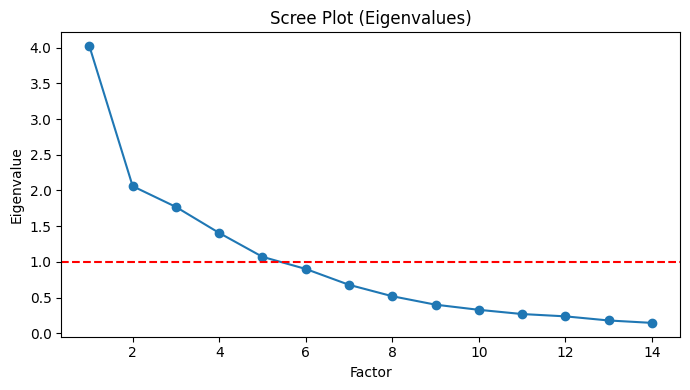

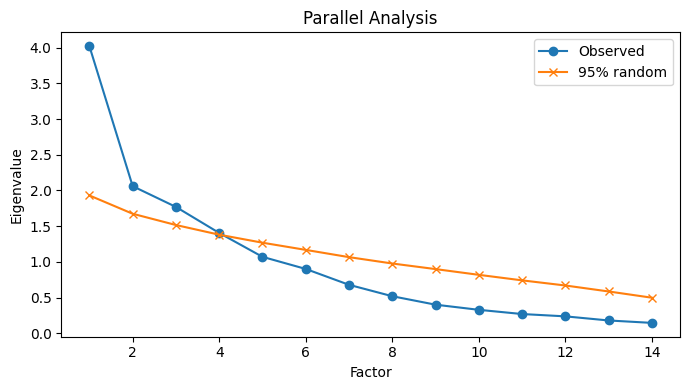

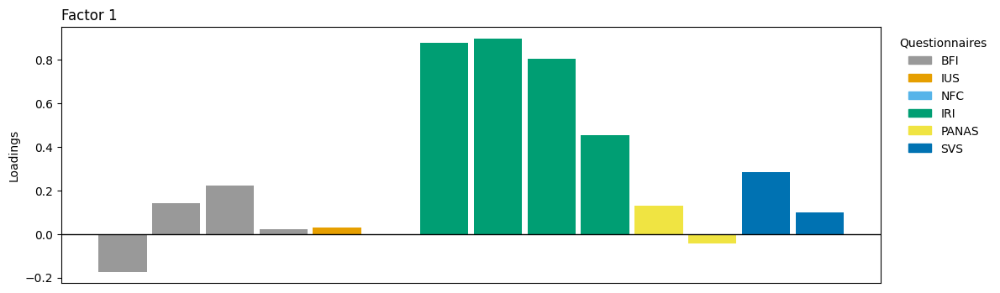

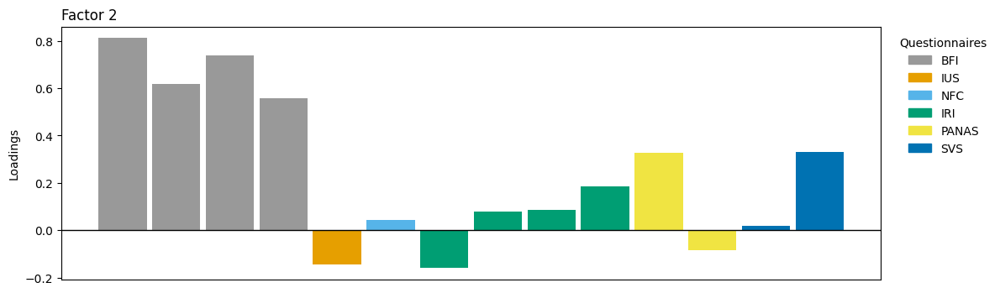

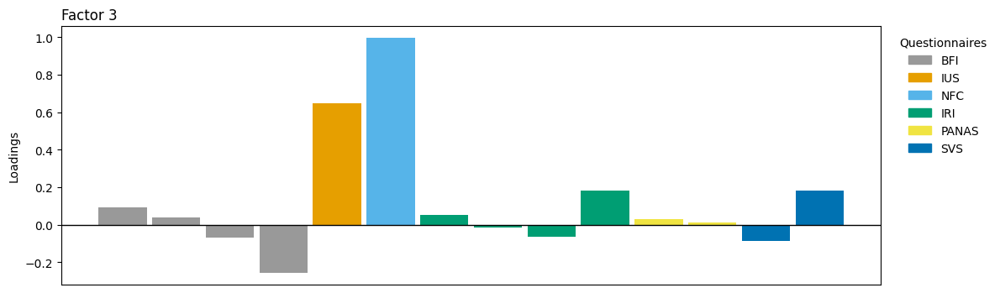

...

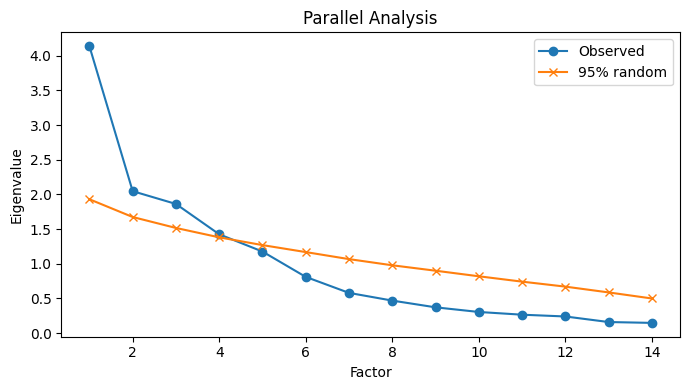

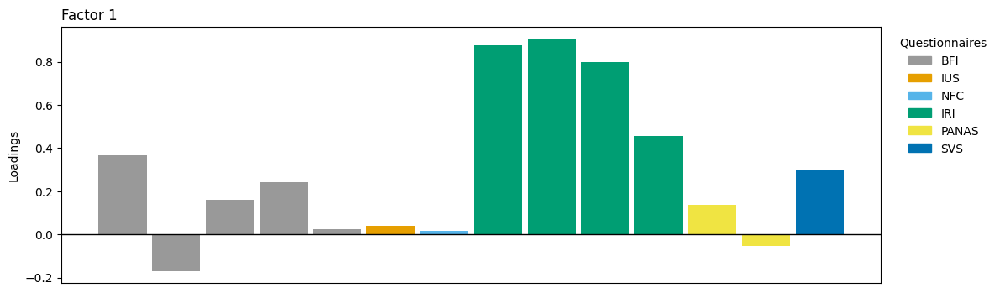

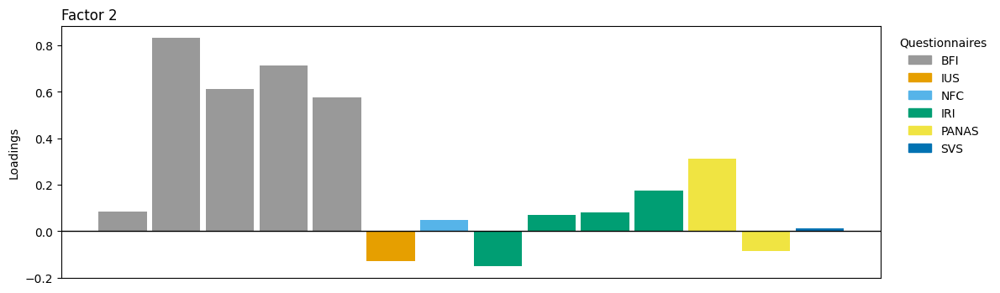

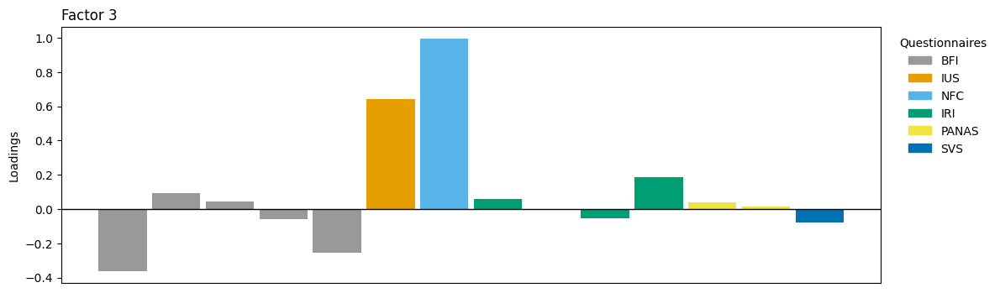

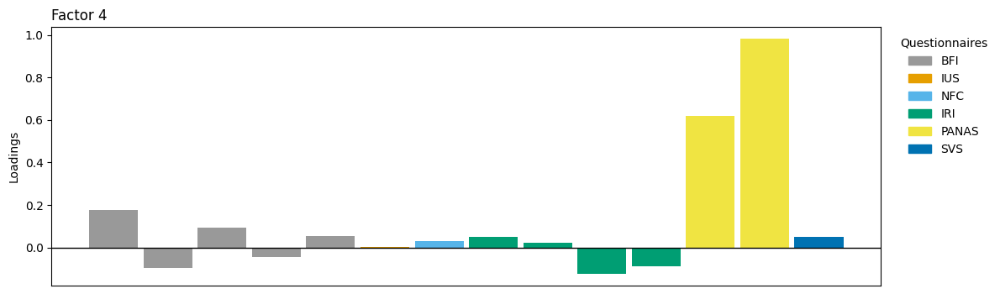

In [16]:
#For replicability - different cols dropped 
features_drop = ["BFI_O","BFI_C","BFI_E","BFI_A","BFI_N",
        "NFC_Total",
        "IUS_Total",  
        "IRI_PT","IRI_FS","IRI_EC","IRI_PD",
        "PANAS_PA","PANAS_NA", "SVS_Openness", "SVS_Conservation"
        ]

#remember to change code --> account for a number of factors other than 4 
max_factors = 4 
data_p_values = []

for i in range(len(features_drop)):
    for j in range(i, len(features_drop)):
        dropped_feature_1 = features_drop[i]
        
        if j != i: 
            dropped_feature_2 = features_drop[j]
            cols_expected.remove(dropped_feature_2)
            dropped_cols.append(dropped_feature_2)
        else:
            dropped_feature_2 = None

        data_drop = []
        cols_expected.remove(dropped_feature_1)
        

        dropped_cols = dropped_cols.copy()
        dropped_cols.append(dropped_feature_1)
        

        subs = df_raw[cols_expected].copy()

        subs_z = pre_processing(subs)
        
        loadings, n_factors = factor_analysis(subs_z)
        semopy_line = generate_semopy_syntax(loadings)
        #print(f"SEMOPYLINESEMOPYLINE:{semopy_line}")
        d_opp, d_sup, d_all = sem_path_analysis(semopy_line, n_factors)
        
        p_values = [d_opp['betas']['p-value'], d_sup['betas']['p-value'], d_all['betas']['p-value']]
        d_opp['betas']['p-value'] = d_opp['betas']['p-value'].astype(float) 
        d_sup['betas']['p-value'] = d_sup['betas']['p-value'].astype(float) 
        d_all['betas']['p-value'] = d_all['betas']['p-value'].astype(float) 
        d_opp_vals = d_opp['betas']['p-value'].tolist()
        d_sup_vals = d_sup['betas']['p-value'].tolist()
        d_all_vals = d_all['betas']['p-value'].tolist()

        data_drop.append(dropped_feature_1)
        data_drop.append(dropped_feature_2)
        data_drop.extend(d_opp_vals)
        for k in range(max_factors - n_factors):
            data_drop.append(np.nan) #fills missing values with NaN 
        
        data_drop.extend(d_sup_vals)
        for k in range(max_factors - n_factors):
            data_drop.append(np.nan)

        data_drop.extend(d_all_vals)  
        for k in range(max_factors - n_factors):
            data_drop.append(np.nan)  
        data_p_values.append(data_drop)
        #appends [dropped_feature, p_values for oppose, support, all]

        #reset list to default 
        cols_expected = all_cols.copy() 
        #cols_expected = features_drop.copy()
        dropped_cols = []


columns = ['Dropped Feature 1', 'Dropped Feature 2']
print(len(columns))

for n in range (1, max_factors + 1):
    columns.append(f'opp_factor{n}')
for n in range (1, max_factors + 1):
    columns.append(f'sup_factor{n}')
for n in range (1, max_factors + 1):
    columns.append(f'all_factor{n}')

data_p_values_df = pd.DataFrame(data_p_values, columns=columns)

data_p_values_df.to_excel('data_results_trial5.xlsx', index=False)

